# Load Libraries

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import glob
import cv2

from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
import os
import seaborn as sns

In [2]:
list_of_architectures = [
    "Xception",
    "VGG16",
    "VGG19",
    "ResNet50",
    "ResNet101",
    "ResNet152",
    "ResNet50V2",
    "ResNet101V2",
    "ResNet152V2",
    "InceptionV3",
    "InceptionResNetV2",
    "MobileNet",
    "MobileNetV2",
    "DenseNet121",
    "DenseNet169",
    "DenseNet201"
    
]

In [3]:
list_of_classifiers = [
    "RF"
]

In [4]:
list_of_size = [
    128,
    256
]

In [5]:
layer = "last_layer"

In [6]:
preprocessing_technique = "smote"

In [7]:
output_folder = "output"
analysis_output =  output_folder + "/" + layer + "_" + preprocessing_technique + "_fusion_2_RF_128_256.csv"

# get Data

In [8]:
import tensorflow as tf
def getData(model1, model2, image_size):
    train_data_dir="../class_imabalance/" + layer + "/" + str(image_size)+"/"
    test_data_dir="../feature_extractor/" + layer + "/" + str(image_size)+"/"
    X_train1=np.load(train_data_dir+model1+"_X_train_SMOTE.npy")
    X_train2=np.load(train_data_dir+model2+"_X_train_SMOTE.npy")
    X_train = tf.keras.layers.concatenate([X_train1, X_train2],
                            axis=1)
    
    y_train=np.load(train_data_dir+model1+"_y_train_SMOTE.npy")
    
    X_test1=np.load(test_data_dir+model1+"_test_images.npy")
    X_test2=np.load(test_data_dir+model2+"_test_images.npy")
    X_test = tf.keras.layers.concatenate([X_test1, X_test2],
                            axis=1)
    
    y_test=np.load(test_data_dir+"test_labels.npy")
    
    
    return X_train, y_train, X_test, y_test

In [9]:
def getLabelEncoder(layer, image_size):
    label_encoder_location = "../feature_extractor/" + layer + "/" + str(image_size)+"/"
    label_encoder = np.load(label_encoder_location+'label_encoder.npy')
    return label_encoder

#  Reusable function for Confusion Matrix 

In [10]:
def getClassificationReport(test_labels, prediction):
    
    def plot_confusion_matrix(cm, classes,
                              normalize=False,
                              title='Confusion matrix',
                              cmap=plt.cm.Blues):
        """
        This function prints and plots the confusion matrix.
        Normalization can be applied by setting `normalize=True`.
        """
        import itertools
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print("Normalized confusion matrix")
        else:
            print('Confusion matrix, without normalization')

        #print(cm)

        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        #plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()
        plt.show()
        
    from sklearn.metrics import confusion_matrix
    test_label_list=list(np.unique(test_labels))
    cnf_matrix = confusion_matrix(test_labels, prediction,labels=test_label_list)
    np.set_printoptions(precision=2)

    # Plot non-normalized confusion matrix
    plt.figure(figsize=(8,8))
    plot_confusion_matrix(cnf_matrix, classes=test_label_list,
                          title='Confusion matrix, without normalization')
    
    
    from sklearn import metrics
    
    accuracy = round(metrics.accuracy_score(test_labels, prediction),3)
    precision = round(metrics.precision_score(test_labels, prediction, average='weighted'),3)
    recall = round(metrics.recall_score(test_labels, prediction, average='weighted'),3)
    f1_score = round(metrics.f1_score(test_labels, prediction, average='weighted'),3)
    
    # Balanced
    balanced_accuracy = round(metrics.balanced_accuracy_score(test_labels, prediction),3)
    
    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
    TP = np.diag(cnf_matrix)
    TN = cnf_matrix.sum() - (FP + FN + TP)
    
    # Sensitivity, hit rate, recall, or true positive rate
    TPR = round((TP/(TP+FN)).mean(),3)
    # Specificity or true negative rate
    TNR = round((TN/(TN+FP) ).mean(),3)
    # Precision or positive predictive value
    PPV = round((TP/(TP+FP)).mean(),3)
    # Negative predictive value
    NPV = round((TN/(TN+FN)).mean(),3)
    # Fall out or false positive rate
    FPR = round((FP/(FP+TN)).mean(),3)
    # False negative rate
    FNR = round((FN/(TP+FN)).mean(),3)
    # False discovery rate
    FDR = round((FP/(TP+FP)).mean(),3)

    # Overall accuracy
    Overall_Acc = round(((TP+TN)/(TP+FP+FN+TN)).mean(),3)
    Bal_F1 = round((2*(PPV*TPR)/(PPV+TPR)),3)
    
    
    print("Acc     = ", accuracy)
    print("Pre     = ", precision)
    print("Rec     = ", recall)
    print("F1      = ", f1_score)
    print("")
    
    print("Bal_Acc = ", balanced_accuracy)
    print("Bal_Pre = ", PPV)
    print("Bal_Rec = ", TPR)
    print("Bal_F1  = ", Bal_F1)
    print("")
    
    from sklearn.metrics import classification_report, confusion_matrix
    print(classification_report(test_labels, prediction))
    
    return accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc


# Classifier

In [11]:
def classify(model1, model2, classifier, image_size):
    X_train, y_train, X_test, y_test = getData(model1, model2, image_size)

    if classifier == "RF":
        from sklearn.ensemble import RandomForestClassifier
        model = RandomForestClassifier(n_estimators = 100, random_state = 42)
    elif classifier == "SVM":
        from sklearn.svm import SVC
        model = SVC(kernel='linear', degree=3, C=1, decision_function_shape='ovo')
        
    # Train the model on training data
    model.fit(X_train, y_train) #For sklearn no one hot encoding

    #Now predict using the trained RF model. 
    prediction = model.predict(X_test)
    
    #get the encoder from the pickle file
    from sklearn import preprocessing
    le = preprocessing.LabelEncoder()
    le.classes_ = getLabelEncoder(layer, image_size)
    
    """
    import pickle
    model_loc = "models"
    filename = model_loc + "/" + layer + "_" + preprocessing_technique + "_" + 'classifier'  + "_" + model_name + "_" + classifier + "_" + str(image_size) + " .sav "
    pickle.dump(model, open(filename, 'wb'))
    """
    
    #Inverse le transform to get original label back. 
    prediction = le.inverse_transform(prediction)
    y_test = le.inverse_transform(y_test)
    
    accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc = getClassificationReport(y_test, prediction)
    return accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc

In [12]:
from itertools import combinations
list_of_combinations=[",".join(map(str, comb)) for comb in combinations(list_of_architectures, 2)]
list_of_combinations

['Xception,VGG16',
 'Xception,VGG19',
 'Xception,ResNet50',
 'Xception,ResNet101',
 'Xception,ResNet152',
 'Xception,ResNet50V2',
 'Xception,ResNet101V2',
 'Xception,ResNet152V2',
 'Xception,InceptionV3',
 'Xception,InceptionResNetV2',
 'Xception,MobileNet',
 'Xception,MobileNetV2',
 'Xception,DenseNet121',
 'Xception,DenseNet169',
 'Xception,DenseNet201',
 'VGG16,VGG19',
 'VGG16,ResNet50',
 'VGG16,ResNet101',
 'VGG16,ResNet152',
 'VGG16,ResNet50V2',
 'VGG16,ResNet101V2',
 'VGG16,ResNet152V2',
 'VGG16,InceptionV3',
 'VGG16,InceptionResNetV2',
 'VGG16,MobileNet',
 'VGG16,MobileNetV2',
 'VGG16,DenseNet121',
 'VGG16,DenseNet169',
 'VGG16,DenseNet201',
 'VGG19,ResNet50',
 'VGG19,ResNet101',
 'VGG19,ResNet152',
 'VGG19,ResNet50V2',
 'VGG19,ResNet101V2',
 'VGG19,ResNet152V2',
 'VGG19,InceptionV3',
 'VGG19,InceptionResNetV2',
 'VGG19,MobileNet',
 'VGG19,MobileNetV2',
 'VGG19,DenseNet121',
 'VGG19,DenseNet169',
 'VGG19,DenseNet201',
 'ResNet50,ResNet101',
 'ResNet50,ResNet152',
 'ResNet50,ResN

--------------------------------------------------------------------------
RF - Xception - VGG16-128

Confusion matrix, without normalization


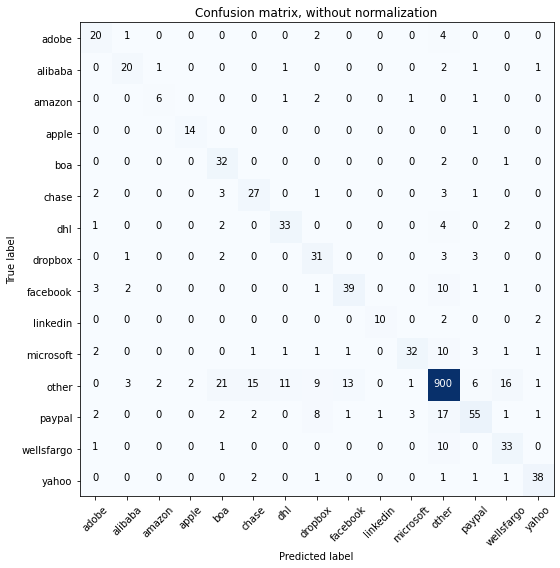

Acc     =  0.838
Pre     =  0.852
Rec     =  0.838
F1      =  0.841

Bal_Acc =  0.752
Bal_Pre =  0.727
Bal_Rec =  0.752
Bal_F1  =  0.739

              precision    recall  f1-score   support

       adobe       0.65      0.74      0.69        27
     alibaba       0.74      0.77      0.75        26
      amazon       0.67      0.55      0.60        11
       apple       0.88      0.93      0.90        15
         boa       0.51      0.91      0.65        35
       chase       0.57      0.73      0.64        37
         dhl       0.70      0.79      0.74        42
     dropbox       0.55      0.78      0.65        40
    facebook       0.72      0.68      0.70        57
    linkedin       0.91      0.71      0.80        14
   microsoft       0.86      0.60      0.71        53
       other       0.93      0.90      0.91      1000
      paypal       0.75      0.59      0.66        93
  wellsfargo       0.59      0.73      0.65        45
       yahoo       0.86      0.86      0.86        

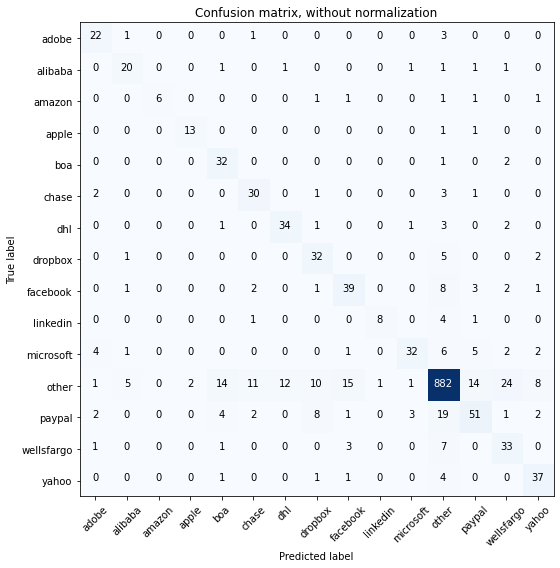

Acc     =  0.826
Pre     =  0.842
Rec     =  0.826
F1      =  0.829

Bal_Acc =  0.746
Bal_Pre =  0.728
Bal_Rec =  0.746
Bal_F1  =  0.737

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.69      0.77      0.73        26
      amazon       1.00      0.55      0.71        11
       apple       0.87      0.87      0.87        15
         boa       0.59      0.91      0.72        35
       chase       0.64      0.81      0.71        37
         dhl       0.72      0.81      0.76        42
     dropbox       0.58      0.80      0.67        40
    facebook       0.64      0.68      0.66        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.84      0.60      0.70        53
       other       0.93      0.88      0.91      1000
      paypal       0.65      0.55      0.60        93
  wellsfargo       0.49      0.73      0.59        45
       yahoo       0.70      0.84      0.76        

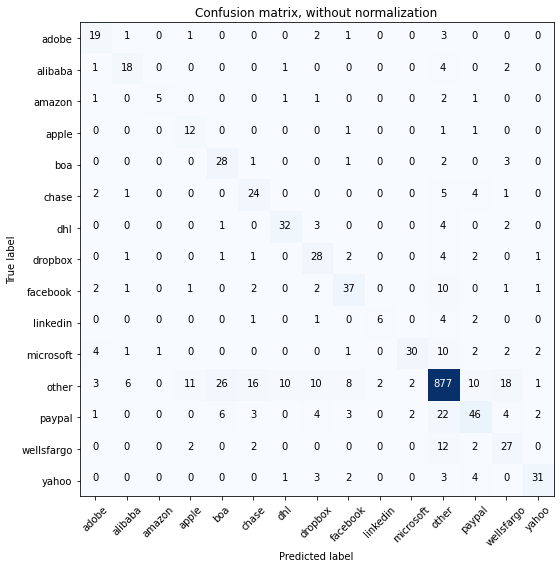

Acc     =  0.793
Pre     =  0.813
Rec     =  0.793
F1      =  0.797

Bal_Acc =  0.659
Bal_Pre =  0.648
Bal_Rec =  0.659
Bal_F1  =  0.653

              precision    recall  f1-score   support

       adobe       0.58      0.70      0.63        27
     alibaba       0.62      0.69      0.65        26
      amazon       0.83      0.45      0.59        11
       apple       0.44      0.80      0.57        15
         boa       0.45      0.80      0.58        35
       chase       0.48      0.65      0.55        37
         dhl       0.71      0.76      0.74        42
     dropbox       0.52      0.70      0.60        40
    facebook       0.66      0.65      0.65        57
    linkedin       0.75      0.43      0.55        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.88      0.89      1000
      paypal       0.62      0.49      0.55        93
  wellsfargo       0.45      0.60      0.51        45
       yahoo       0.82      0.70      0.76        

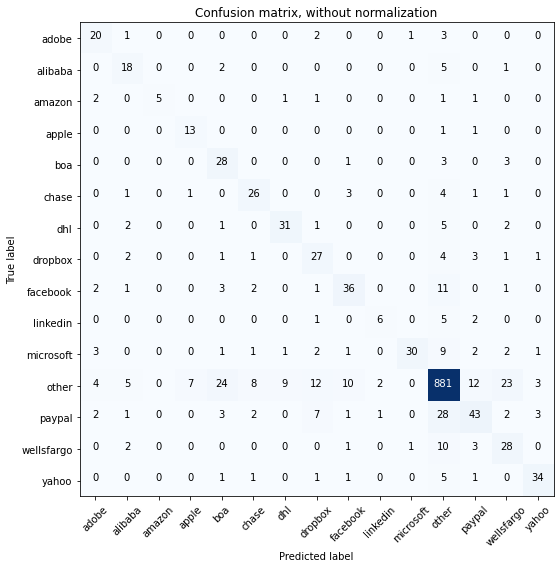

Acc     =  0.797
Pre     =  0.815
Rec     =  0.797
F1      =  0.8

Bal_Acc =  0.669
Bal_Pre =  0.674
Bal_Rec =  0.669
Bal_F1  =  0.671

              precision    recall  f1-score   support

       adobe       0.61      0.74      0.67        27
     alibaba       0.55      0.69      0.61        26
      amazon       1.00      0.45      0.62        11
       apple       0.62      0.87      0.72        15
         boa       0.44      0.80      0.57        35
       chase       0.63      0.70      0.67        37
         dhl       0.74      0.74      0.74        42
     dropbox       0.49      0.68      0.57        40
    facebook       0.67      0.63      0.65        57
    linkedin       0.67      0.43      0.52        14
   microsoft       0.94      0.57      0.71        53
       other       0.90      0.88      0.89      1000
      paypal       0.62      0.46      0.53        93
  wellsfargo       0.44      0.62      0.51        45
       yahoo       0.81      0.77      0.79        44

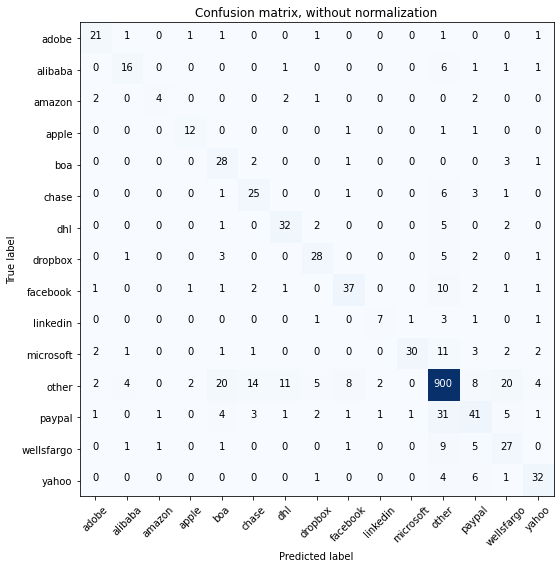

Acc     =  0.806
Pre     =  0.817
Rec     =  0.806
F1      =  0.807

Bal_Acc =  0.659
Bal_Pre =  0.675
Bal_Rec =  0.659
Bal_F1  =  0.667

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.67      0.62      0.64        26
      amazon       0.67      0.36      0.47        11
       apple       0.75      0.80      0.77        15
         boa       0.46      0.80      0.58        35
       chase       0.53      0.68      0.60        37
         dhl       0.67      0.76      0.71        42
     dropbox       0.68      0.70      0.69        40
    facebook       0.74      0.65      0.69        57
    linkedin       0.70      0.50      0.58        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.90      0.90      1000
      paypal       0.55      0.44      0.49        93
  wellsfargo       0.43      0.60      0.50        45
       yahoo       0.71      0.73      0.72        

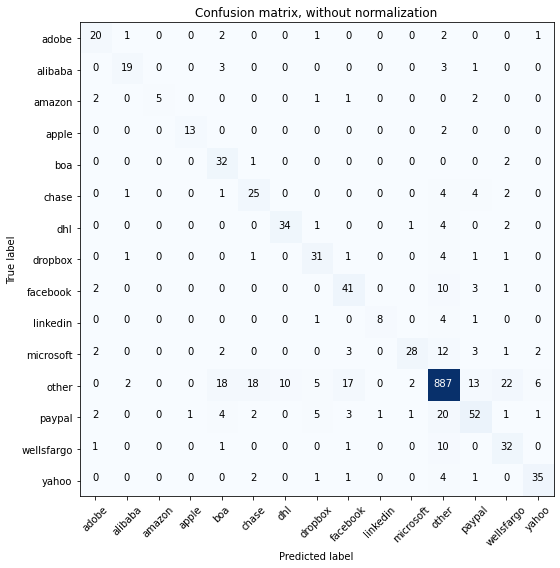

Acc     =  0.82
Pre     =  0.837
Rec     =  0.82
F1      =  0.823

Bal_Acc =  0.716
Bal_Pre =  0.739
Bal_Rec =  0.716
Bal_F1  =  0.727

              precision    recall  f1-score   support

       adobe       0.69      0.74      0.71        27
     alibaba       0.79      0.73      0.76        26
      amazon       1.00      0.45      0.62        11
       apple       0.93      0.87      0.90        15
         boa       0.51      0.91      0.65        35
       chase       0.51      0.68      0.58        37
         dhl       0.77      0.81      0.79        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.60      0.72      0.66        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.88      0.53      0.66        53
       other       0.92      0.89      0.90      1000
      paypal       0.64      0.56      0.60        93
  wellsfargo       0.50      0.71      0.59        45
       yahoo       0.78      0.80      0.79        44

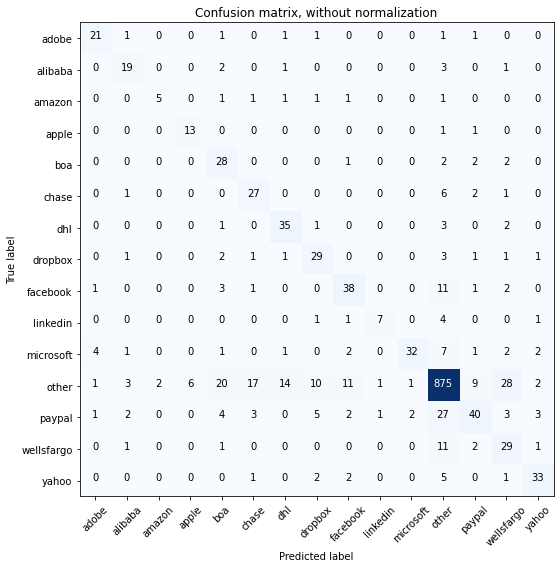

Acc     =  0.8
Pre     =  0.821
Rec     =  0.8
F1      =  0.804

Bal_Acc =  0.693
Bal_Pre =  0.673
Bal_Rec =  0.693
Bal_F1  =  0.683

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.66      0.73      0.69        26
      amazon       0.71      0.45      0.56        11
       apple       0.68      0.87      0.76        15
         boa       0.44      0.80      0.57        35
       chase       0.53      0.73      0.61        37
         dhl       0.65      0.83      0.73        42
     dropbox       0.58      0.72      0.64        40
    facebook       0.66      0.67      0.66        57
    linkedin       0.78      0.50      0.61        14
   microsoft       0.91      0.60      0.73        53
       other       0.91      0.88      0.89      1000
      paypal       0.67      0.43      0.52        93
  wellsfargo       0.40      0.64      0.50        45
       yahoo       0.77      0.75      0.76        44



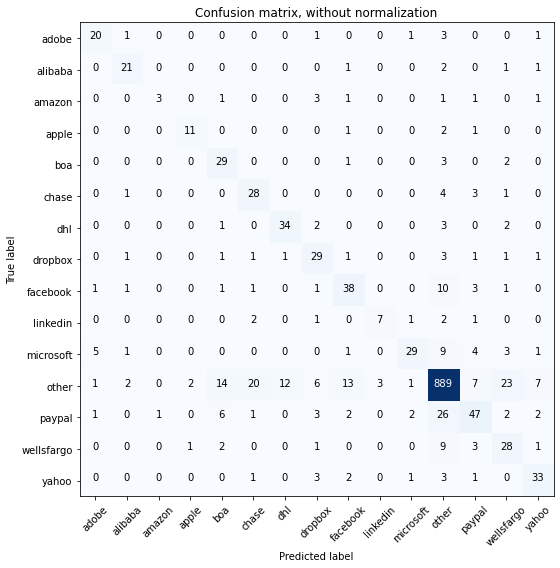

Acc     =  0.81
Pre     =  0.823
Rec     =  0.81
F1      =  0.812

Bal_Acc =  0.677
Bal_Pre =  0.68
Bal_Rec =  0.677
Bal_F1  =  0.678

              precision    recall  f1-score   support

       adobe       0.71      0.74      0.73        27
     alibaba       0.75      0.81      0.78        26
      amazon       0.75      0.27      0.40        11
       apple       0.79      0.73      0.76        15
         boa       0.53      0.83      0.64        35
       chase       0.52      0.76      0.62        37
         dhl       0.72      0.81      0.76        42
     dropbox       0.58      0.72      0.64        40
    facebook       0.62      0.67      0.64        57
    linkedin       0.70      0.50      0.58        14
   microsoft       0.83      0.55      0.66        53
       other       0.92      0.89      0.90      1000
      paypal       0.65      0.51      0.57        93
  wellsfargo       0.44      0.62      0.51        45
       yahoo       0.69      0.75      0.72        44


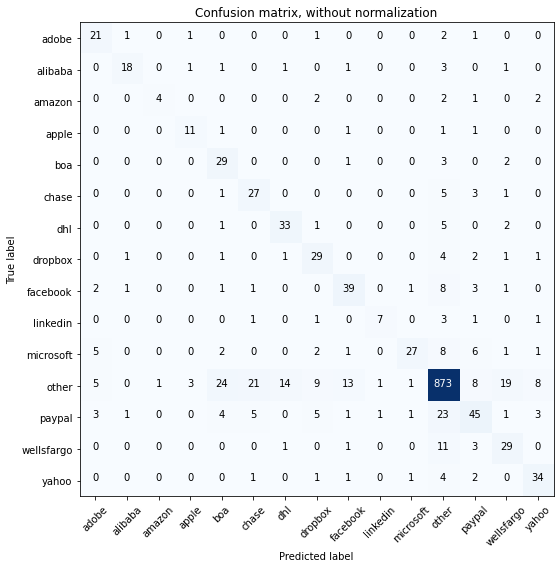

Acc     =  0.797
Pre     =  0.816
Rec     =  0.797
F1      =  0.8

Bal_Acc =  0.674
Bal_Pre =  0.669
Bal_Rec =  0.674
Bal_F1  =  0.671

              precision    recall  f1-score   support

       adobe       0.58      0.78      0.67        27
     alibaba       0.82      0.69      0.75        26
      amazon       0.80      0.36      0.50        11
       apple       0.69      0.73      0.71        15
         boa       0.45      0.83      0.58        35
       chase       0.48      0.73      0.58        37
         dhl       0.66      0.79      0.72        42
     dropbox       0.57      0.72      0.64        40
    facebook       0.66      0.68      0.67        57
    linkedin       0.78      0.50      0.61        14
   microsoft       0.87      0.51      0.64        53
       other       0.91      0.87      0.89      1000
      paypal       0.59      0.48      0.53        93
  wellsfargo       0.50      0.64      0.56        45
       yahoo       0.68      0.77      0.72        44

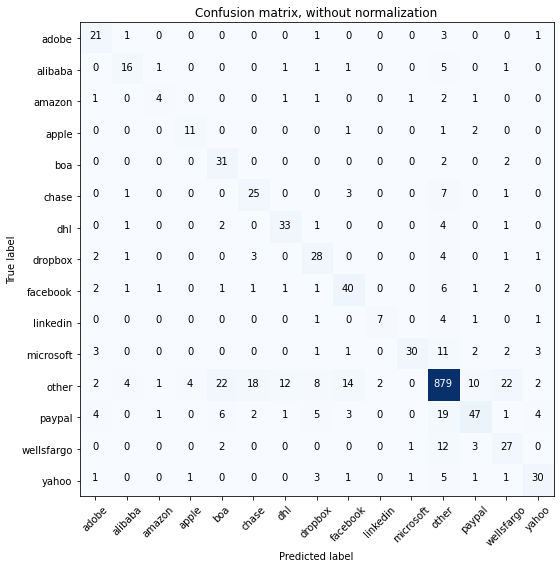

Acc     =  0.799
Pre     =  0.816
Rec     =  0.799
F1      =  0.802

Bal_Acc =  0.665
Bal_Pre =  0.647
Bal_Rec =  0.665
Bal_F1  =  0.656

              precision    recall  f1-score   support

       adobe       0.58      0.78      0.67        27
     alibaba       0.64      0.62      0.63        26
      amazon       0.50      0.36      0.42        11
       apple       0.69      0.73      0.71        15
         boa       0.48      0.89      0.63        35
       chase       0.51      0.68      0.58        37
         dhl       0.67      0.79      0.73        42
     dropbox       0.55      0.70      0.62        40
    facebook       0.62      0.70      0.66        57
    linkedin       0.78      0.50      0.61        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.88      0.90      1000
      paypal       0.69      0.51      0.58        93
  wellsfargo       0.44      0.60      0.51        45
       yahoo       0.71      0.68      0.70        

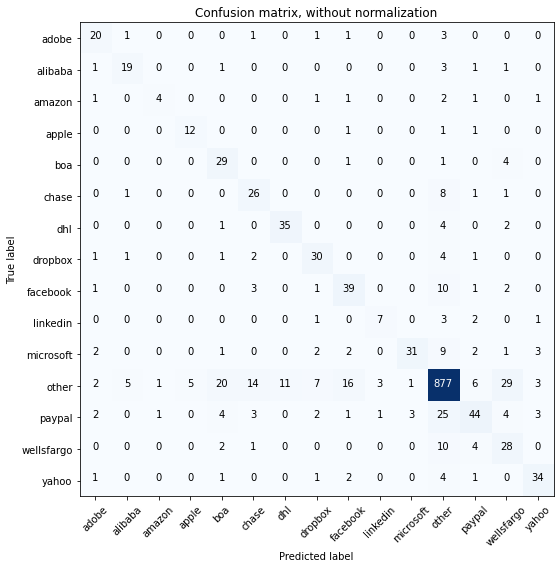

Acc     =  0.802
Pre     =  0.82
Rec     =  0.802
F1      =  0.806

Bal_Acc =  0.684
Bal_Pre =  0.667
Bal_Rec =  0.684
Bal_F1  =  0.675

              precision    recall  f1-score   support

       adobe       0.65      0.74      0.69        27
     alibaba       0.70      0.73      0.72        26
      amazon       0.67      0.36      0.47        11
       apple       0.71      0.80      0.75        15
         boa       0.48      0.83      0.61        35
       chase       0.52      0.70      0.60        37
         dhl       0.76      0.83      0.80        42
     dropbox       0.65      0.75      0.70        40
    facebook       0.61      0.68      0.64        57
    linkedin       0.64      0.50      0.56        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.88      0.89      1000
      paypal       0.68      0.47      0.56        93
  wellsfargo       0.39      0.62      0.48        45
       yahoo       0.76      0.77      0.76        4

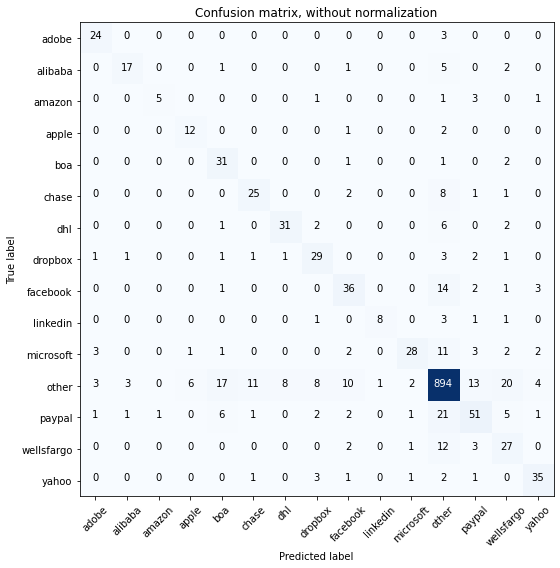

Acc     =  0.814
Pre     =  0.825
Rec     =  0.814
F1      =  0.816

Bal_Acc =  0.693
Bal_Pre =  0.71
Bal_Rec =  0.693
Bal_F1  =  0.701

              precision    recall  f1-score   support

       adobe       0.75      0.89      0.81        27
     alibaba       0.77      0.65      0.71        26
      amazon       0.83      0.45      0.59        11
       apple       0.63      0.80      0.71        15
         boa       0.53      0.89      0.66        35
       chase       0.64      0.68      0.66        37
         dhl       0.78      0.74      0.76        42
     dropbox       0.63      0.72      0.67        40
    facebook       0.62      0.63      0.63        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.85      0.53      0.65        53
       other       0.91      0.89      0.90      1000
      paypal       0.64      0.55      0.59        93
  wellsfargo       0.42      0.60      0.50        45
       yahoo       0.76      0.80      0.78        4

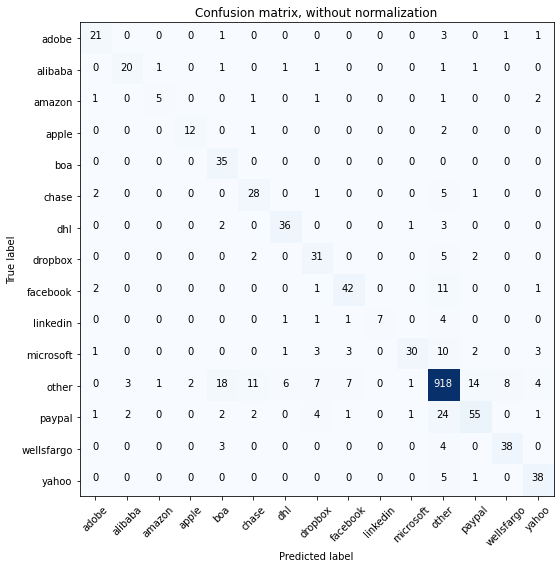

Acc     =  0.855
Pre     =  0.863
Rec     =  0.855
F1      =  0.854

Bal_Acc =  0.747
Bal_Pre =  0.775
Bal_Rec =  0.747
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.80      0.77      0.78        26
      amazon       0.71      0.45      0.56        11
       apple       0.86      0.80      0.83        15
         boa       0.56      1.00      0.72        35
       chase       0.62      0.76      0.68        37
         dhl       0.80      0.86      0.83        42
     dropbox       0.62      0.78      0.69        40
    facebook       0.78      0.74      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.92      0.92      0.92      1000
      paypal       0.72      0.59      0.65        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.76      0.86      0.81        

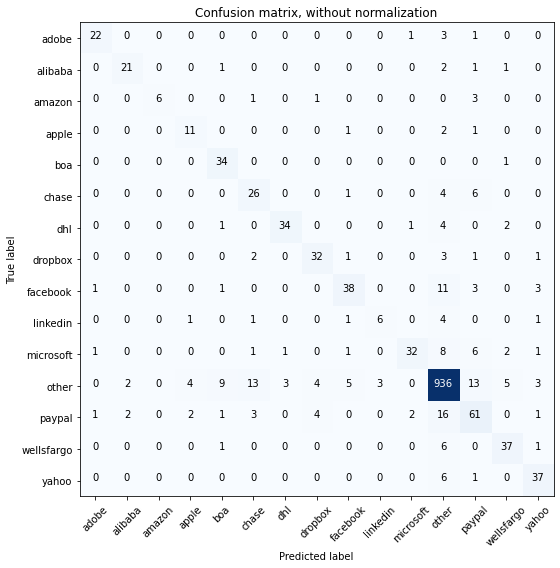

Acc     =  0.866
Pre     =  0.871
Rec     =  0.866
F1      =  0.866

Bal_Acc =  0.743
Bal_Pre =  0.781
Bal_Rec =  0.743
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.84      0.81      0.82        26
      amazon       1.00      0.55      0.71        11
       apple       0.61      0.73      0.67        15
         boa       0.71      0.97      0.82        35
       chase       0.55      0.70      0.62        37
         dhl       0.89      0.81      0.85        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.79      0.67      0.72        57
    linkedin       0.67      0.43      0.52        14
   microsoft       0.89      0.60      0.72        53
       other       0.93      0.94      0.93      1000
      paypal       0.63      0.66      0.64        93
  wellsfargo       0.77      0.82      0.80        45
       yahoo       0.77      0.84      0.80        

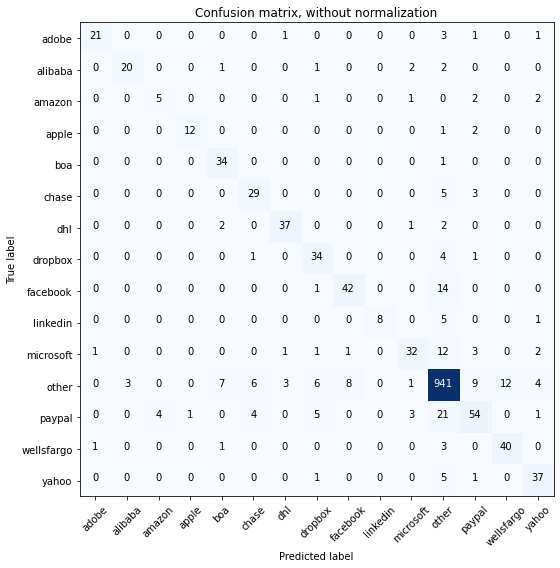

Acc     =  0.875
Pre     =  0.875
Rec     =  0.875
F1      =  0.872

Bal_Acc =  0.763
Bal_Pre =  0.807
Bal_Rec =  0.763
Bal_F1  =  0.784

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.56      0.45      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.76      0.97      0.85        35
       chase       0.72      0.78      0.75        37
         dhl       0.88      0.88      0.88        42
     dropbox       0.68      0.85      0.76        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.80      0.60      0.69        53
       other       0.92      0.94      0.93      1000
      paypal       0.71      0.58      0.64        93
  wellsfargo       0.77      0.89      0.82        45
       yahoo       0.77      0.84      0.80        

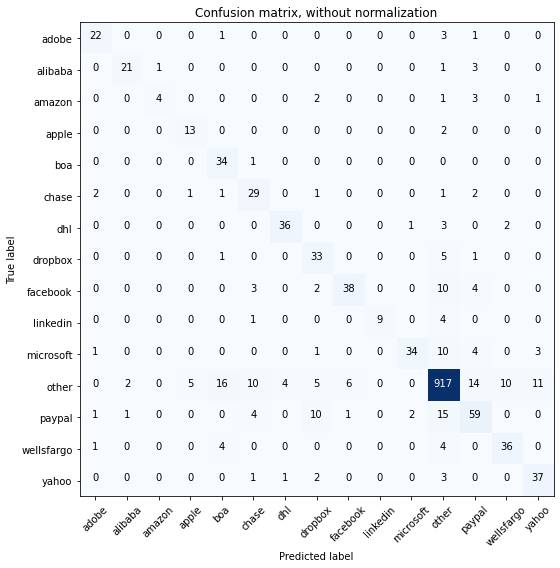

Acc     =  0.859
Pre     =  0.871
Rec     =  0.859
F1      =  0.86

Bal_Acc =  0.762
Bal_Pre =  0.776
Bal_Rec =  0.762
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.80      0.36      0.50        11
       apple       0.68      0.87      0.76        15
         boa       0.60      0.97      0.74        35
       chase       0.59      0.78      0.67        37
         dhl       0.88      0.86      0.87        42
     dropbox       0.59      0.82      0.69        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.92      0.64      0.76        53
       other       0.94      0.92      0.93      1000
      paypal       0.65      0.63      0.64        93
  wellsfargo       0.75      0.80      0.77        45
       yahoo       0.71      0.84      0.77        4

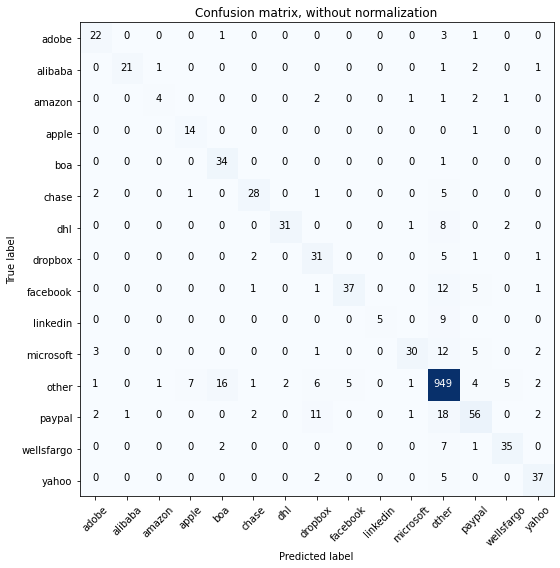

Acc     =  0.867
Pre     =  0.872
Rec     =  0.867
F1      =  0.863

Bal_Acc =  0.727
Bal_Pre =  0.798
Bal_Rec =  0.727
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       0.64      0.93      0.76        15
         boa       0.64      0.97      0.77        35
       chase       0.82      0.76      0.79        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.56      0.78      0.65        40
    facebook       0.88      0.65      0.75        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.95      0.93      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.80      0.84      0.82        

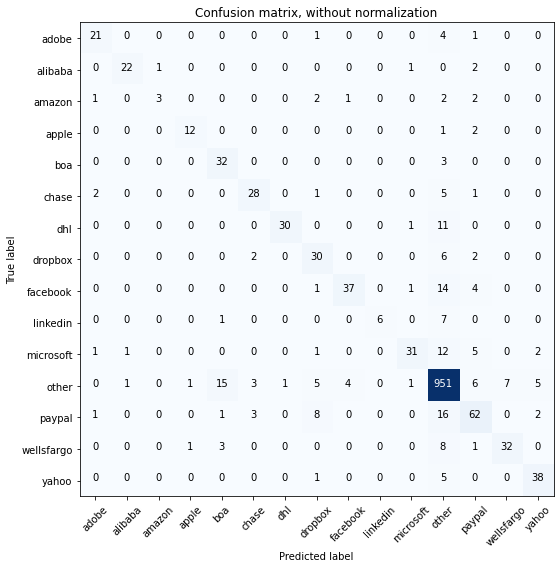

Acc     =  0.867
Pre     =  0.871
Rec     =  0.867
F1      =  0.864

Bal_Acc =  0.712
Bal_Pre =  0.82
Bal_Rec =  0.712
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.86      0.80      0.83        15
         boa       0.62      0.91      0.74        35
       chase       0.78      0.76      0.77        37
         dhl       0.97      0.71      0.82        42
     dropbox       0.60      0.75      0.67        40
    facebook       0.88      0.65      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.70      0.67      0.69        93
  wellsfargo       0.82      0.71      0.76        45
       yahoo       0.81      0.86      0.84        4

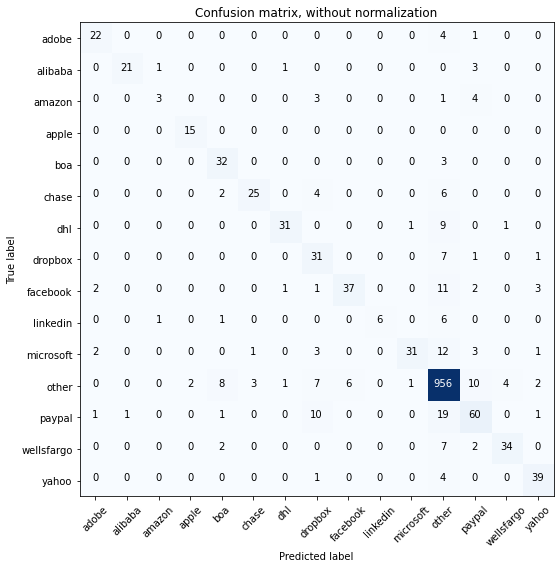

Acc     =  0.873
Pre     =  0.877
Rec     =  0.873
F1      =  0.869

Bal_Acc =  0.727
Bal_Pre =  0.823
Bal_Rec =  0.727
Bal_F1  =  0.772

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.88      1.00      0.94        15
         boa       0.70      0.91      0.79        35
       chase       0.86      0.68      0.76        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.52      0.78      0.62        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.58      0.72        53
       other       0.91      0.96      0.93      1000
      paypal       0.70      0.65      0.67        93
  wellsfargo       0.87      0.76      0.81        45
       yahoo       0.83      0.89      0.86        

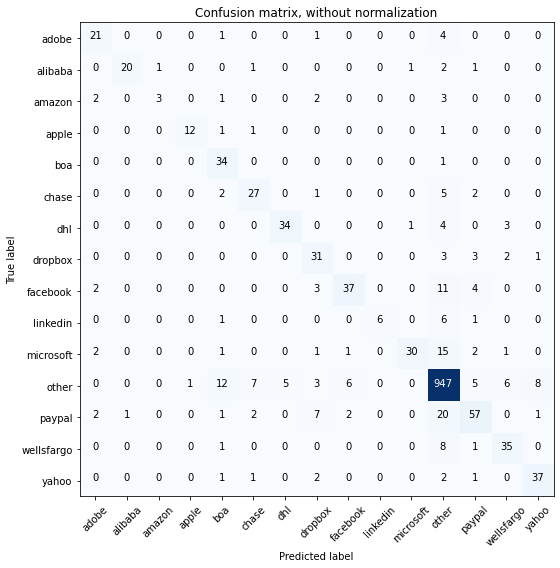

Acc     =  0.865
Pre     =  0.87
Rec     =  0.865
F1      =  0.861

Bal_Acc =  0.715
Bal_Pre =  0.804
Bal_Rec =  0.715
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.61      0.97      0.75        35
       chase       0.69      0.73      0.71        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.61      0.78      0.68        40
    facebook       0.80      0.65      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.57      0.71        53
       other       0.92      0.95      0.93      1000
      paypal       0.74      0.61      0.67        93
  wellsfargo       0.74      0.78      0.76        45
       yahoo       0.79      0.84      0.81        4

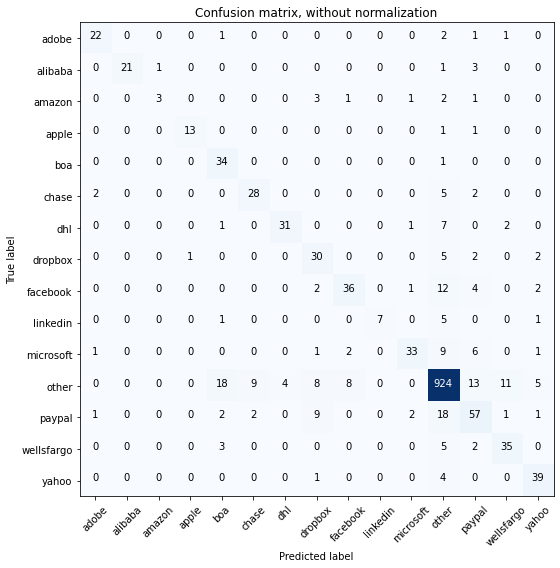

Acc     =  0.853
Pre     =  0.862
Rec     =  0.853
F1      =  0.853

Bal_Acc =  0.729
Bal_Pre =  0.793
Bal_Rec =  0.729
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       0.93      0.87      0.90        15
         boa       0.57      0.97      0.72        35
       chase       0.72      0.76      0.74        37
         dhl       0.89      0.74      0.81        42
     dropbox       0.56      0.75      0.64        40
    facebook       0.77      0.63      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.92      0.92      1000
      paypal       0.62      0.61      0.62        93
  wellsfargo       0.70      0.78      0.74        45
       yahoo       0.76      0.89      0.82        4

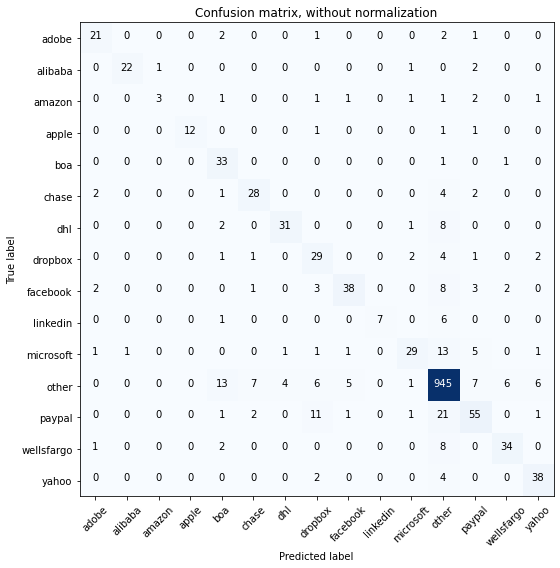

Acc     =  0.861
Pre     =  0.866
Rec     =  0.861
F1      =  0.859

Bal_Acc =  0.715
Bal_Pre =  0.799
Bal_Rec =  0.715
Bal_F1  =  0.755

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.58      0.94      0.72        35
       chase       0.72      0.76      0.74        37
         dhl       0.86      0.74      0.79        42
     dropbox       0.53      0.72      0.61        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.81      0.55      0.65        53
       other       0.92      0.94      0.93      1000
      paypal       0.70      0.59      0.64        93
  wellsfargo       0.79      0.76      0.77        45
       yahoo       0.78      0.86      0.82        

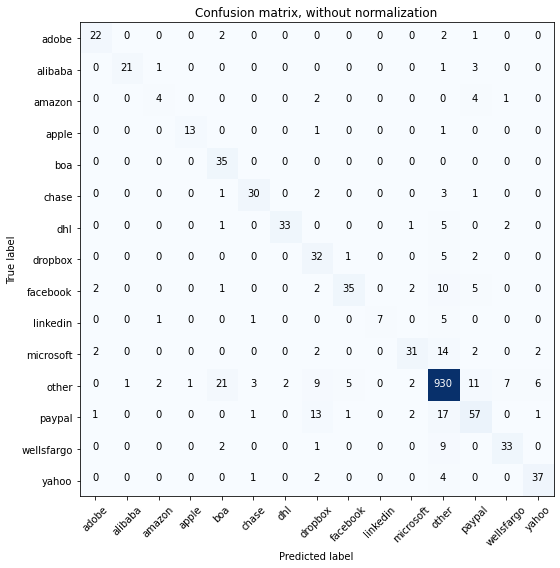

Acc     =  0.858
Pre     =  0.868
Rec     =  0.858
F1      =  0.858

Bal_Acc =  0.738
Bal_Pre =  0.788
Bal_Rec =  0.738
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.50      0.36      0.42        11
       apple       0.93      0.87      0.90        15
         boa       0.56      1.00      0.71        35
       chase       0.83      0.81      0.82        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.48      0.80      0.60        40
    facebook       0.83      0.61      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.58      0.68        53
       other       0.92      0.93      0.93      1000
      paypal       0.66      0.61      0.64        93
  wellsfargo       0.77      0.73      0.75        45
       yahoo       0.80      0.84      0.82        

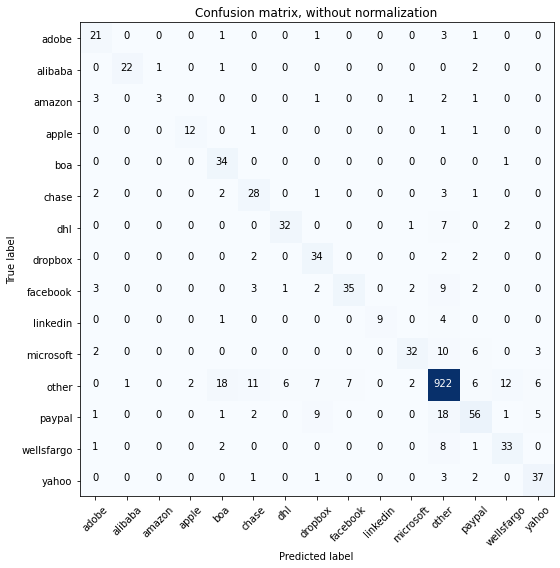

Acc     =  0.851
Pre     =  0.861
Rec     =  0.851
F1      =  0.851

Bal_Acc =  0.733
Bal_Pre =  0.765
Bal_Rec =  0.733
Bal_F1  =  0.749

              precision    recall  f1-score   support

       adobe       0.64      0.78      0.70        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       0.86      0.80      0.83        15
         boa       0.57      0.97      0.72        35
       chase       0.58      0.76      0.66        37
         dhl       0.82      0.76      0.79        42
     dropbox       0.61      0.85      0.71        40
    facebook       0.83      0.61      0.71        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.84      0.60      0.70        53
       other       0.93      0.92      0.93      1000
      paypal       0.69      0.60      0.64        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.73      0.84      0.78        

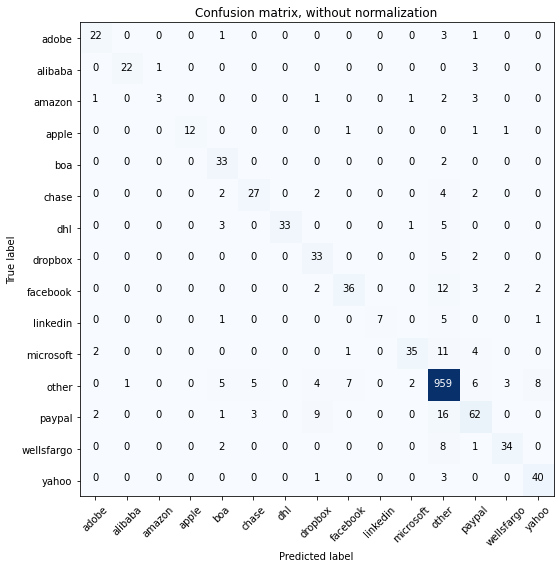

Acc     =  0.882
Pre     =  0.885
Rec     =  0.882
F1      =  0.879

Bal_Acc =  0.74
Bal_Pre =  0.839
Bal_Rec =  0.74
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.69      0.94      0.80        35
       chase       0.77      0.73      0.75        37
         dhl       1.00      0.79      0.88        42
     dropbox       0.63      0.82      0.72        40
    facebook       0.80      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.66      0.76        53
       other       0.93      0.96      0.94      1000
      paypal       0.70      0.67      0.69        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.78      0.91      0.84        44

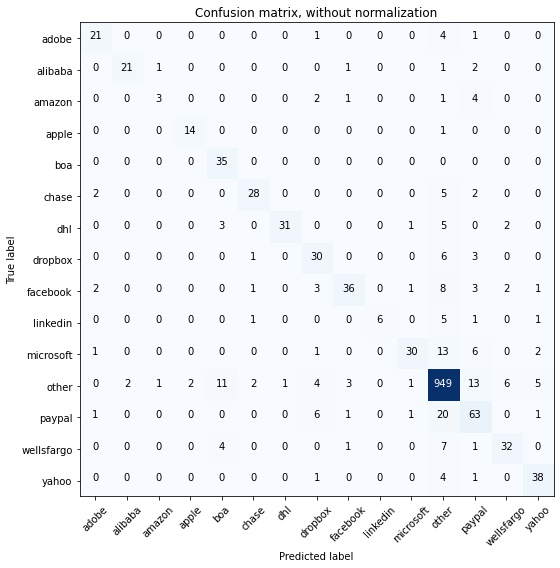

Acc     =  0.869
Pre     =  0.873
Rec     =  0.869
F1      =  0.866

Bal_Acc =  0.724
Bal_Pre =  0.806
Bal_Rec =  0.724
Bal_F1  =  0.763

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.60      0.27      0.37        11
       apple       0.88      0.93      0.90        15
         boa       0.66      1.00      0.80        35
       chase       0.85      0.76      0.80        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.62      0.75      0.68        40
    facebook       0.84      0.63      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.95      0.94      1000
      paypal       0.63      0.68      0.65        93
  wellsfargo       0.76      0.71      0.74        45
       yahoo       0.79      0.86      0.83        

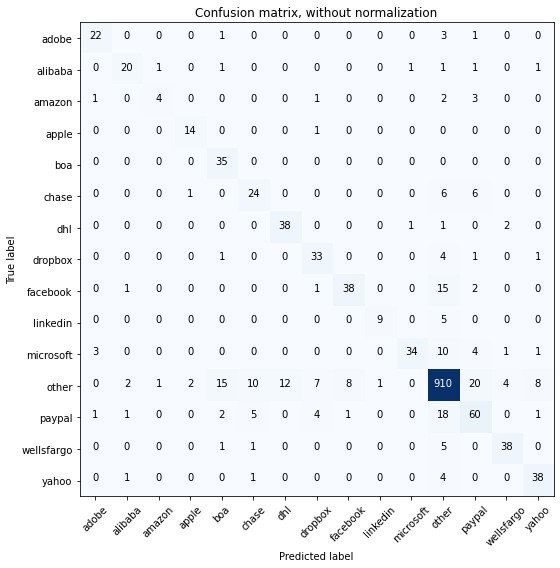

Acc     =  0.856
Pre     =  0.863
Rec     =  0.856
F1      =  0.856

Bal_Acc =  0.765
Bal_Pre =  0.771
Bal_Rec =  0.765
Bal_F1  =  0.768

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.80      0.77      0.78        26
      amazon       0.67      0.36      0.47        11
       apple       0.82      0.93      0.87        15
         boa       0.62      1.00      0.77        35
       chase       0.59      0.65      0.62        37
         dhl       0.76      0.90      0.83        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.81      0.67      0.73        57
    linkedin       0.90      0.64      0.75        14
   microsoft       0.94      0.64      0.76        53
       other       0.92      0.91      0.92      1000
      paypal       0.61      0.65      0.63        93
  wellsfargo       0.84      0.84      0.84        45
       yahoo       0.76      0.86      0.81        

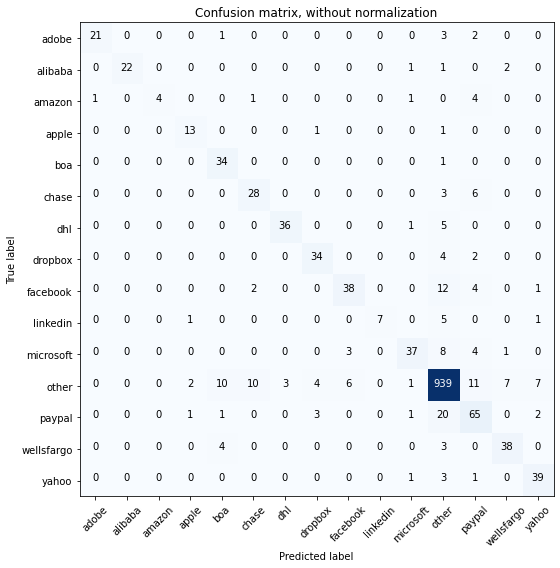

Acc     =  0.88
Pre     =  0.885
Rec     =  0.88
F1      =  0.879

Bal_Acc =  0.768
Bal_Pre =  0.843
Bal_Rec =  0.768
Bal_F1  =  0.804

              precision    recall  f1-score   support

       adobe       0.95      0.78      0.86        27
     alibaba       1.00      0.85      0.92        26
      amazon       1.00      0.36      0.53        11
       apple       0.76      0.87      0.81        15
         boa       0.68      0.97      0.80        35
       chase       0.68      0.76      0.72        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.81      0.85      0.83        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.70      0.77        53
       other       0.93      0.94      0.94      1000
      paypal       0.66      0.70      0.68        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.78      0.89      0.83        44

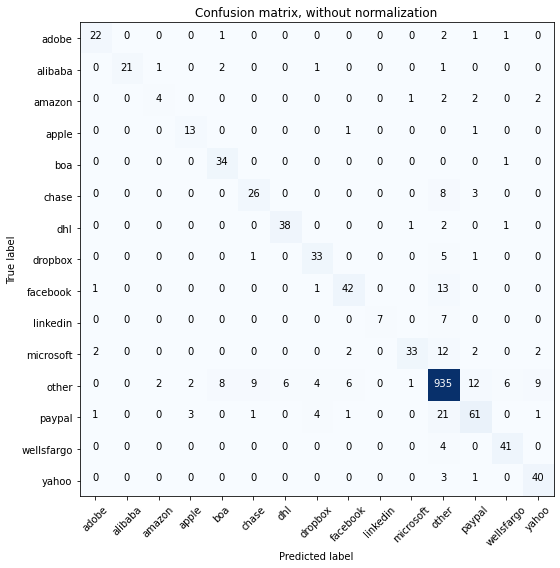

Acc     =  0.877
Pre     =  0.879
Rec     =  0.877
F1      =  0.875

Bal_Acc =  0.768
Bal_Pre =  0.811
Bal_Rec =  0.768
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.57      0.36      0.44        11
       apple       0.72      0.87      0.79        15
         boa       0.76      0.97      0.85        35
       chase       0.70      0.70      0.70        37
         dhl       0.86      0.90      0.88        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.94      0.93      1000
      paypal       0.73      0.66      0.69        93
  wellsfargo       0.82      0.91      0.86        45
       yahoo       0.74      0.91      0.82        

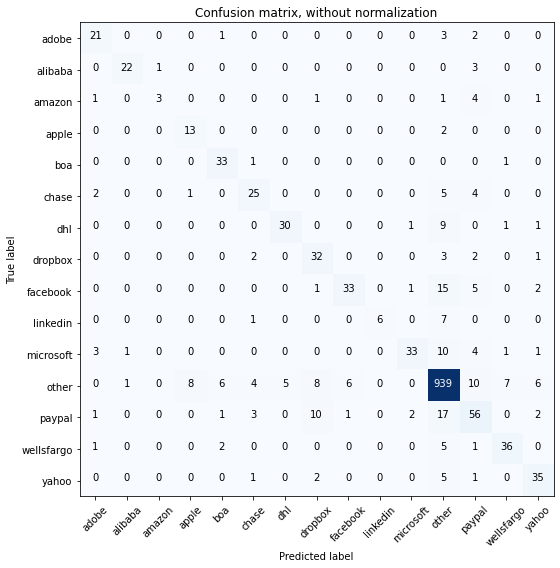

Acc     =  0.856
Pre     =  0.86
Rec     =  0.856
F1      =  0.853

Bal_Acc =  0.711
Bal_Pre =  0.774
Bal_Rec =  0.711
Bal_F1  =  0.741

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.59      0.87      0.70        15
         boa       0.77      0.94      0.85        35
       chase       0.68      0.68      0.68        37
         dhl       0.86      0.71      0.78        42
     dropbox       0.59      0.80      0.68        40
    facebook       0.82      0.58      0.68        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.62      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.61      0.60      0.61        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.71      0.80      0.75        4

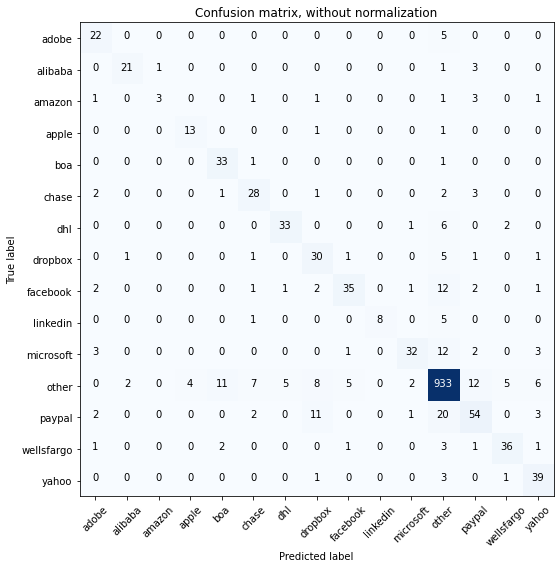

Acc     =  0.858
Pre     =  0.862
Rec     =  0.858
F1      =  0.856

Bal_Acc =  0.732
Bal_Pre =  0.774
Bal_Rec =  0.732
Bal_F1  =  0.752

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.75      0.27      0.40        11
       apple       0.76      0.87      0.81        15
         boa       0.70      0.94      0.80        35
       chase       0.67      0.76      0.71        37
         dhl       0.85      0.79      0.81        42
     dropbox       0.55      0.75      0.63        40
    facebook       0.81      0.61      0.70        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.60      0.71        53
       other       0.92      0.93      0.93      1000
      paypal       0.67      0.58      0.62        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.71      0.89      0.79        

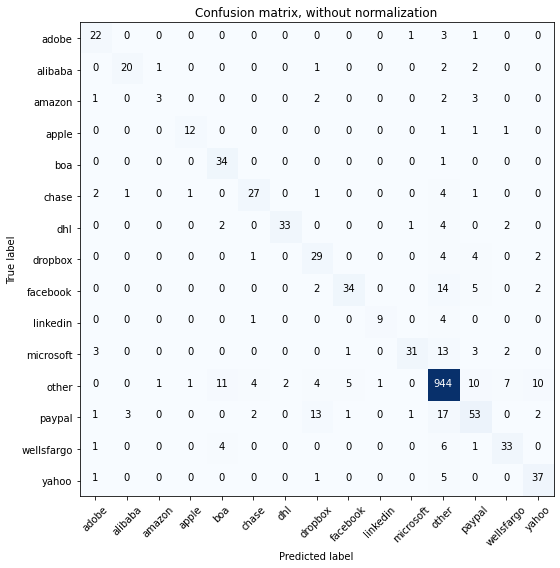

Acc     =  0.858
Pre     =  0.862
Rec     =  0.858
F1      =  0.856

Bal_Acc =  0.719
Bal_Pre =  0.77
Bal_Rec =  0.719
Bal_F1  =  0.744

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.83      0.77      0.80        26
      amazon       0.60      0.27      0.37        11
       apple       0.86      0.80      0.83        15
         boa       0.67      0.97      0.79        35
       chase       0.77      0.73      0.75        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.55      0.72      0.62        40
    facebook       0.83      0.60      0.69        57
    linkedin       0.90      0.64      0.75        14
   microsoft       0.91      0.58      0.71        53
       other       0.92      0.94      0.93      1000
      paypal       0.63      0.57      0.60        93
  wellsfargo       0.73      0.73      0.73        45
       yahoo       0.70      0.84      0.76        4

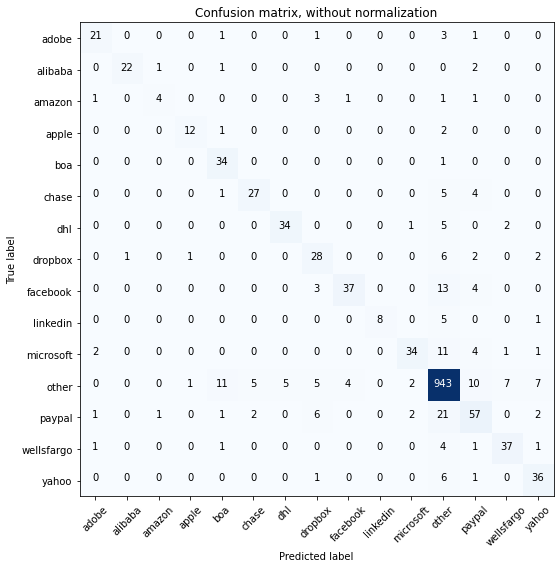

Acc     =  0.867
Pre     =  0.869
Rec     =  0.867
F1      =  0.865

Bal_Acc =  0.737
Bal_Pre =  0.803
Bal_Rec =  0.737
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.67      0.36      0.47        11
       apple       0.86      0.80      0.83        15
         boa       0.67      0.97      0.79        35
       chase       0.79      0.73      0.76        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.60      0.70      0.64        40
    facebook       0.88      0.65      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.64      0.74        53
       other       0.92      0.94      0.93      1000
      paypal       0.66      0.61      0.63        93
  wellsfargo       0.79      0.82      0.80        45
       yahoo       0.72      0.82      0.77        

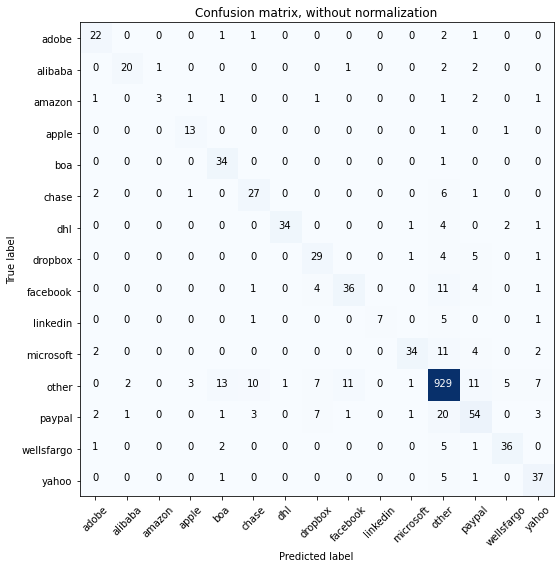

Acc     =  0.854
Pre     =  0.86
Rec     =  0.854
F1      =  0.853

Bal_Acc =  0.726
Bal_Pre =  0.774
Bal_Rec =  0.726
Bal_F1  =  0.749

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       0.72      0.87      0.79        15
         boa       0.64      0.97      0.77        35
       chase       0.63      0.73      0.68        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.60      0.72      0.66        40
    facebook       0.73      0.63      0.68        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.64      0.75        53
       other       0.92      0.93      0.93      1000
      paypal       0.63      0.58      0.60        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.69      0.84      0.76        4

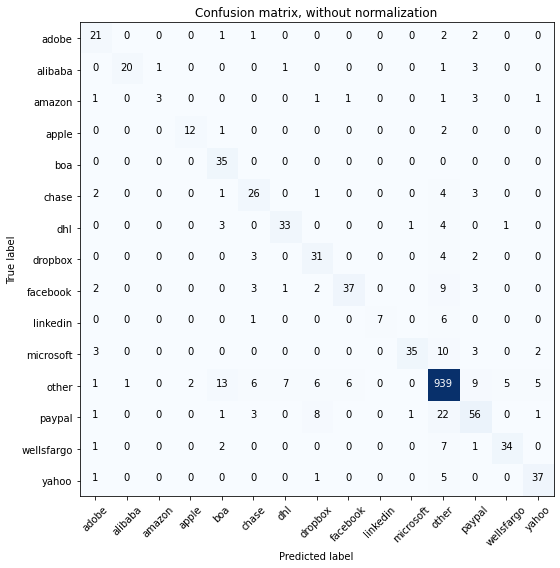

Acc     =  0.862
Pre     =  0.868
Rec     =  0.862
F1      =  0.86

Bal_Acc =  0.722
Bal_Pre =  0.79
Bal_Rec =  0.722
Bal_F1  =  0.754

              precision    recall  f1-score   support

       adobe       0.64      0.78      0.70        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.86      0.80      0.83        15
         boa       0.61      1.00      0.76        35
       chase       0.60      0.70      0.65        37
         dhl       0.79      0.79      0.79        42
     dropbox       0.62      0.78      0.69        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.95      0.66      0.78        53
       other       0.92      0.94      0.93      1000
      paypal       0.66      0.60      0.63        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.80      0.84      0.82        44

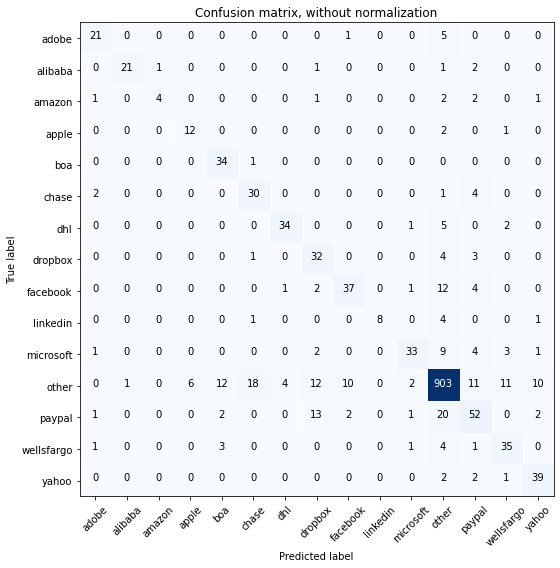

Acc     =  0.841
Pre     =  0.853
Rec     =  0.841
F1      =  0.843

Bal_Acc =  0.741
Bal_Pre =  0.756
Bal_Rec =  0.741
Bal_F1  =  0.748

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.67      0.80      0.73        15
         boa       0.67      0.97      0.79        35
       chase       0.59      0.81      0.68        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.51      0.80      0.62        40
    facebook       0.74      0.65      0.69        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.85      0.62      0.72        53
       other       0.93      0.90      0.91      1000
      paypal       0.61      0.56      0.58        93
  wellsfargo       0.66      0.78      0.71        45
       yahoo       0.72      0.89      0.80        

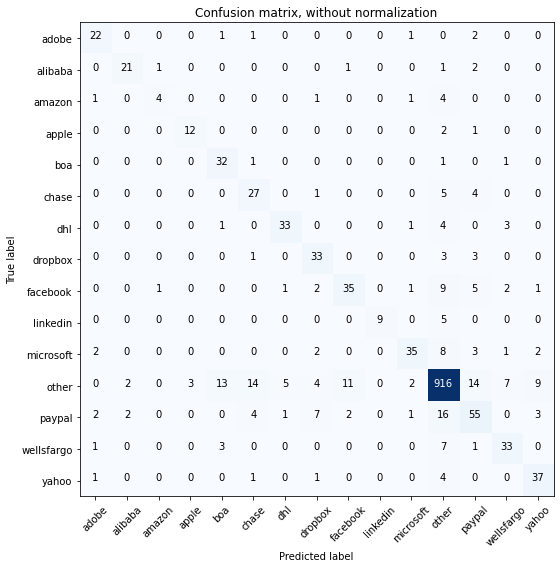

Acc     =  0.847
Pre     =  0.854
Rec     =  0.847
F1      =  0.848

Bal_Acc =  0.736
Bal_Pre =  0.749
Bal_Rec =  0.736
Bal_F1  =  0.742

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.67      0.36      0.47        11
       apple       0.80      0.80      0.80        15
         boa       0.64      0.91      0.75        35
       chase       0.55      0.73      0.63        37
         dhl       0.82      0.79      0.80        42
     dropbox       0.65      0.82      0.73        40
    facebook       0.71      0.61      0.66        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.83      0.66      0.74        53
       other       0.93      0.92      0.92      1000
      paypal       0.61      0.59      0.60        93
  wellsfargo       0.70      0.73      0.72        45
       yahoo       0.71      0.84      0.77        

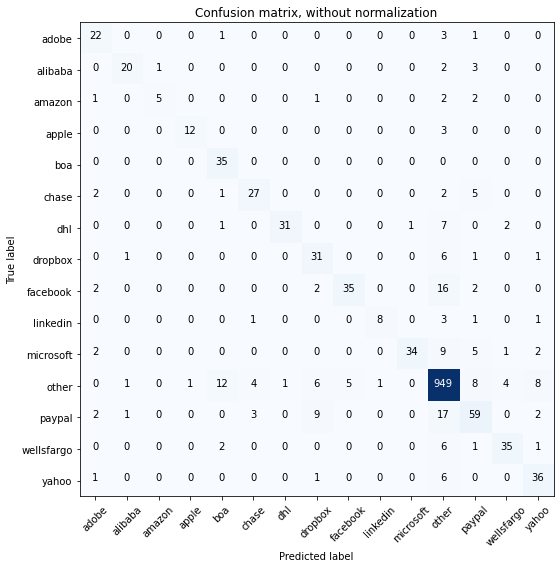

Acc     =  0.87
Pre     =  0.875
Rec     =  0.87
F1      =  0.868

Bal_Acc =  0.739
Bal_Pre =  0.814
Bal_Rec =  0.739
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.83      0.45      0.59        11
       apple       0.92      0.80      0.86        15
         boa       0.67      1.00      0.80        35
       chase       0.77      0.73      0.75        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.62      0.78      0.69        40
    facebook       0.88      0.61      0.72        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.97      0.64      0.77        53
       other       0.92      0.95      0.93      1000
      paypal       0.67      0.63      0.65        93
  wellsfargo       0.83      0.78      0.80        45
       yahoo       0.71      0.82      0.76        44

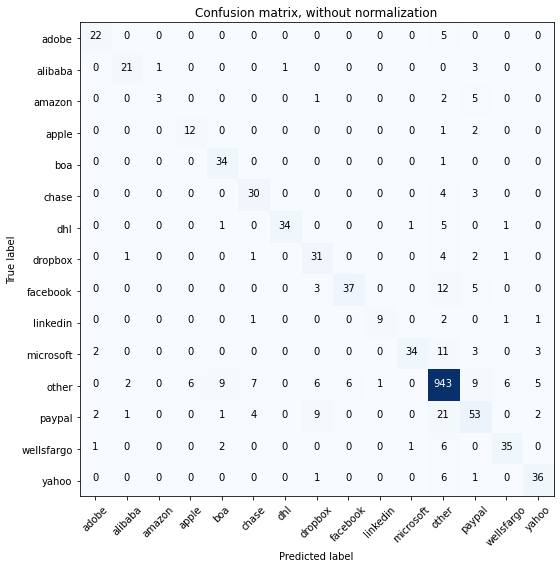

Acc     =  0.867
Pre     =  0.87
Rec     =  0.867
F1      =  0.865

Bal_Acc =  0.74
Bal_Pre =  0.792
Bal_Rec =  0.74
Bal_F1  =  0.765

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       0.67      0.80      0.73        15
         boa       0.72      0.97      0.83        35
       chase       0.70      0.81      0.75        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.61      0.78      0.68        40
    facebook       0.86      0.65      0.74        57
    linkedin       0.90      0.64      0.75        14
   microsoft       0.94      0.64      0.76        53
       other       0.92      0.94      0.93      1000
      paypal       0.62      0.57      0.59        93
  wellsfargo       0.80      0.78      0.79        45
       yahoo       0.77      0.82      0.79        44


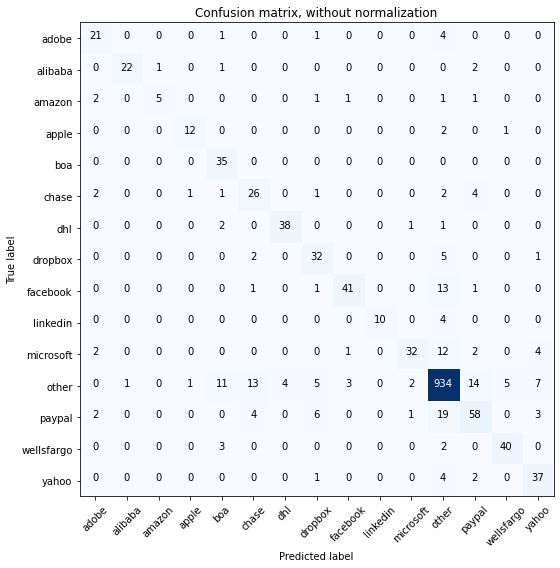

Acc     =  0.873
Pre     =  0.879
Rec     =  0.873
F1      =  0.872

Bal_Acc =  0.774
Bal_Pre =  0.809
Bal_Rec =  0.774
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       0.86      0.80      0.83        15
         boa       0.65      1.00      0.79        35
       chase       0.57      0.70      0.63        37
         dhl       0.90      0.90      0.90        42
     dropbox       0.67      0.80      0.73        40
    facebook       0.89      0.72      0.80        57
    linkedin       1.00      0.71      0.83        14
   microsoft       0.89      0.60      0.72        53
       other       0.93      0.93      0.93      1000
      paypal       0.69      0.62      0.66        93
  wellsfargo       0.87      0.89      0.88        45
       yahoo       0.71      0.84      0.77        

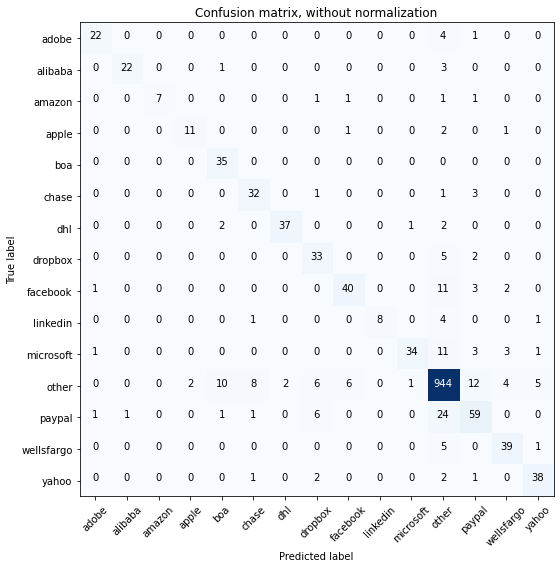

Acc     =  0.884
Pre     =  0.888
Rec     =  0.884
F1      =  0.883

Bal_Acc =  0.788
Bal_Pre =  0.852
Bal_Rec =  0.788
Bal_F1  =  0.819

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.96      0.85      0.90        26
      amazon       1.00      0.64      0.78        11
       apple       0.85      0.73      0.79        15
         boa       0.71      1.00      0.83        35
       chase       0.74      0.86      0.80        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.64      0.76        53
       other       0.93      0.94      0.94      1000
      paypal       0.69      0.63      0.66        93
  wellsfargo       0.80      0.87      0.83        45
       yahoo       0.83      0.86      0.84        

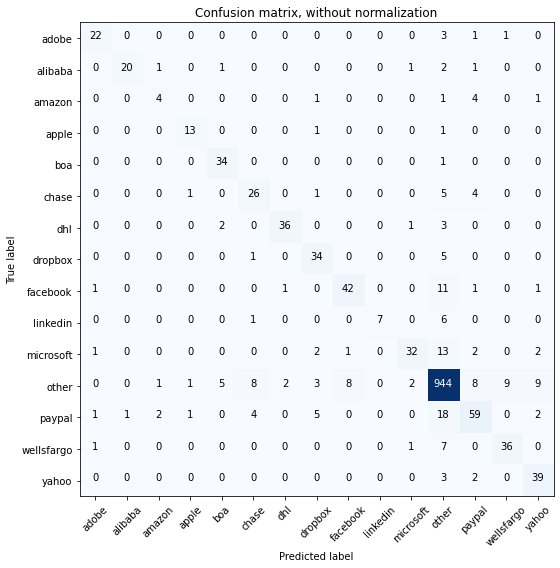

Acc     =  0.876
Pre     =  0.876
Rec     =  0.876
F1      =  0.873

Bal_Acc =  0.753
Bal_Pre =  0.804
Bal_Rec =  0.753
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.50      0.36      0.42        11
       apple       0.81      0.87      0.84        15
         boa       0.81      0.97      0.88        35
       chase       0.65      0.70      0.68        37
         dhl       0.92      0.86      0.89        42
     dropbox       0.72      0.85      0.78        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.92      0.94      0.93      1000
      paypal       0.72      0.63      0.67        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.72      0.89      0.80        

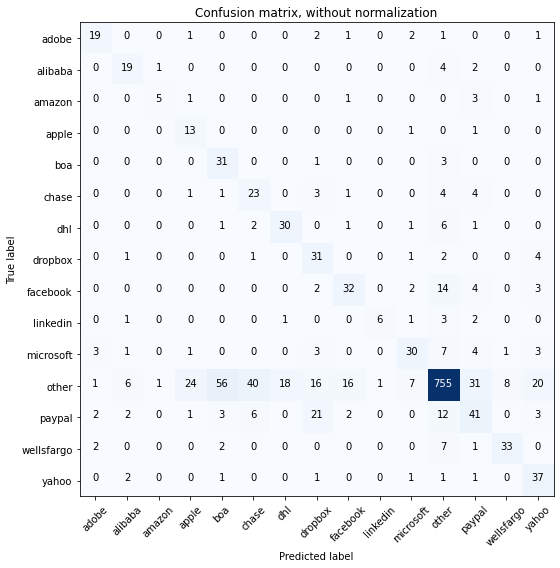

Acc     =  0.718
Pre     =  0.787
Rec     =  0.718
F1      =  0.738

Bal_Acc =  0.672
Bal_Pre =  0.581
Bal_Rec =  0.672
Bal_F1  =  0.623

              precision    recall  f1-score   support

       adobe       0.70      0.70      0.70        27
     alibaba       0.59      0.73      0.66        26
      amazon       0.71      0.45      0.56        11
       apple       0.31      0.87      0.46        15
         boa       0.33      0.89      0.48        35
       chase       0.32      0.62      0.42        37
         dhl       0.61      0.71      0.66        42
     dropbox       0.39      0.78      0.52        40
    facebook       0.59      0.56      0.58        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.65      0.57      0.61        53
       other       0.92      0.76      0.83      1000
      paypal       0.43      0.44      0.44        93
  wellsfargo       0.79      0.73      0.76        45
       yahoo       0.51      0.84      0.64        

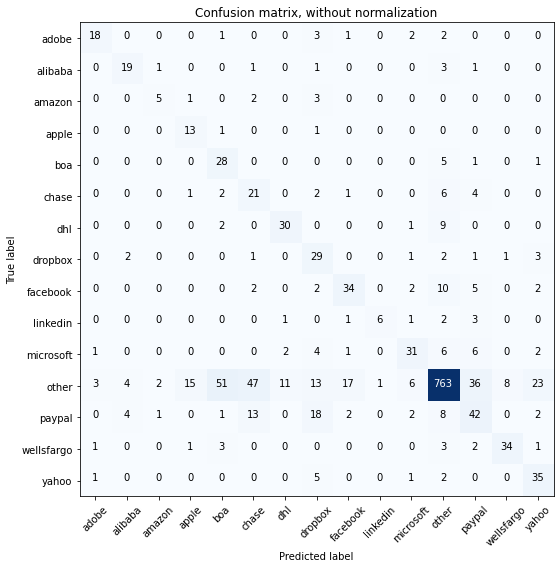

Acc     =  0.72
Pre     =  0.792
Rec     =  0.72
F1      =  0.743

Bal_Acc =  0.66
Bal_Pre =  0.582
Bal_Rec =  0.66
Bal_F1  =  0.619

              precision    recall  f1-score   support

       adobe       0.75      0.67      0.71        27
     alibaba       0.66      0.73      0.69        26
      amazon       0.56      0.45      0.50        11
       apple       0.42      0.87      0.57        15
         boa       0.31      0.80      0.45        35
       chase       0.24      0.57      0.34        37
         dhl       0.68      0.71      0.70        42
     dropbox       0.36      0.72      0.48        40
    facebook       0.60      0.60      0.60        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.66      0.58      0.62        53
       other       0.93      0.76      0.84      1000
      paypal       0.42      0.45      0.43        93
  wellsfargo       0.79      0.76      0.77        45
       yahoo       0.51      0.80      0.62        44



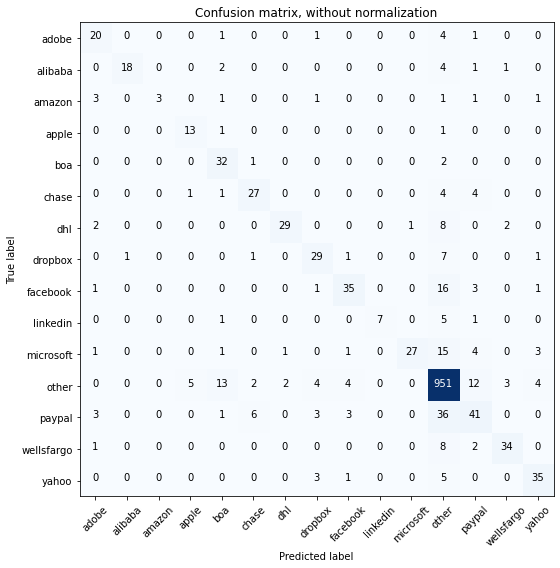

Acc     =  0.845
Pre     =  0.848
Rec     =  0.845
F1      =  0.838

Bal_Acc =  0.68
Bal_Pre =  0.803
Bal_Rec =  0.68
Bal_F1  =  0.736

              precision    recall  f1-score   support

       adobe       0.65      0.74      0.69        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.68      0.87      0.76        15
         boa       0.59      0.91      0.72        35
       chase       0.73      0.73      0.73        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.69      0.72      0.71        40
    facebook       0.78      0.61      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.96      0.51      0.67        53
       other       0.89      0.95      0.92      1000
      paypal       0.59      0.44      0.50        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.78      0.80      0.79        44

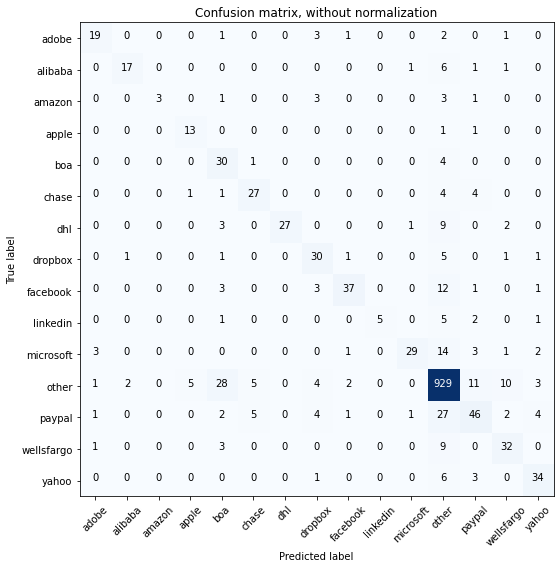

Acc     =  0.83
Pre     =  0.844
Rec     =  0.83
F1      =  0.828

Bal_Acc =  0.663
Bal_Pre =  0.781
Bal_Rec =  0.663
Bal_F1  =  0.717

              precision    recall  f1-score   support

       adobe       0.76      0.70      0.73        27
     alibaba       0.85      0.65      0.74        26
      amazon       1.00      0.27      0.43        11
       apple       0.68      0.87      0.76        15
         boa       0.41      0.86      0.55        35
       chase       0.71      0.73      0.72        37
         dhl       1.00      0.64      0.78        42
     dropbox       0.62      0.75      0.68        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.91      0.55      0.68        53
       other       0.90      0.93      0.91      1000
      paypal       0.63      0.49      0.55        93
  wellsfargo       0.64      0.71      0.67        45
       yahoo       0.74      0.77      0.76        44

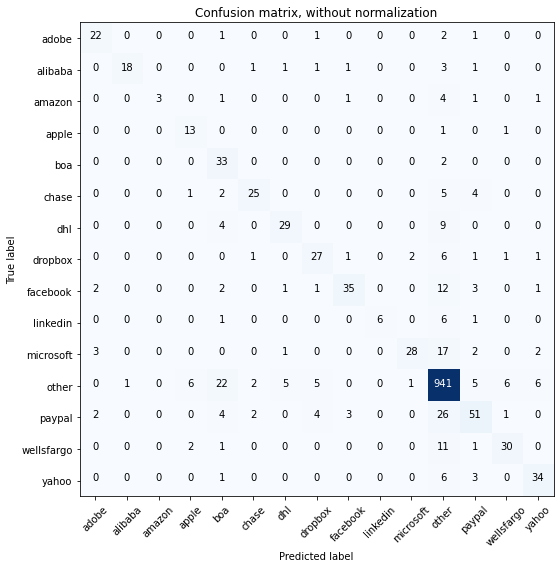

Acc     =  0.841
Pre     =  0.851
Rec     =  0.841
F1      =  0.837

Bal_Acc =  0.675
Bal_Pre =  0.794
Bal_Rec =  0.675
Bal_F1  =  0.73

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.59      0.87      0.70        15
         boa       0.46      0.94      0.62        35
       chase       0.81      0.68      0.74        37
         dhl       0.78      0.69      0.73        42
     dropbox       0.69      0.68      0.68        40
    facebook       0.85      0.61      0.71        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.90      0.53      0.67        53
       other       0.90      0.94      0.92      1000
      paypal       0.69      0.55      0.61        93
  wellsfargo       0.77      0.67      0.71        45
       yahoo       0.76      0.77      0.76        4

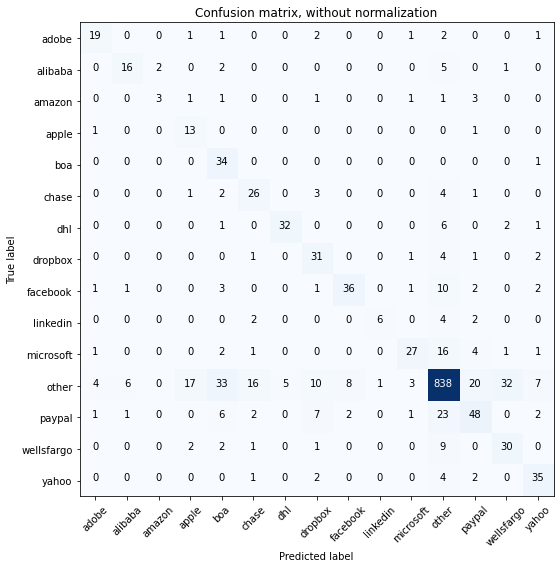

Acc     =  0.776
Pre     =  0.809
Rec     =  0.776
F1      =  0.784

Bal_Acc =  0.67
Bal_Pre =  0.644
Bal_Rec =  0.67
Bal_F1  =  0.657

              precision    recall  f1-score   support

       adobe       0.70      0.70      0.70        27
     alibaba       0.67      0.62      0.64        26
      amazon       0.60      0.27      0.37        11
       apple       0.37      0.87      0.52        15
         boa       0.39      0.97      0.56        35
       chase       0.52      0.70      0.60        37
         dhl       0.86      0.76      0.81        42
     dropbox       0.53      0.78      0.63        40
    facebook       0.78      0.63      0.70        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.77      0.51      0.61        53
       other       0.90      0.84      0.87      1000
      paypal       0.57      0.52      0.54        93
  wellsfargo       0.45      0.67      0.54        45
       yahoo       0.67      0.80      0.73        44

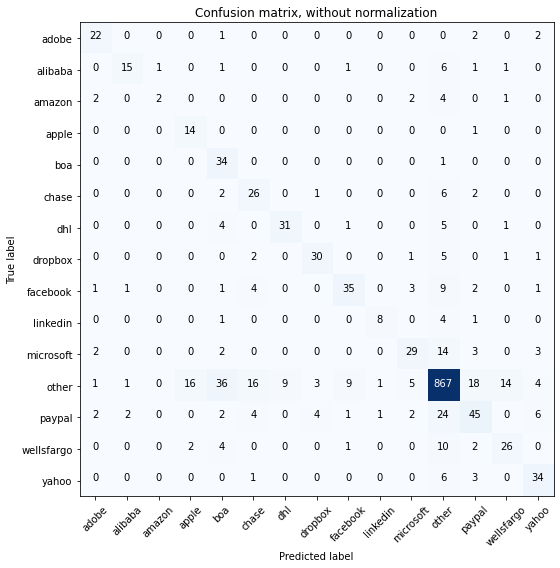

Acc     =  0.791
Pre     =  0.812
Rec     =  0.791
F1      =  0.795

Bal_Acc =  0.674
Bal_Pre =  0.667
Bal_Rec =  0.674
Bal_F1  =  0.67

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.79      0.58      0.67        26
      amazon       0.67      0.18      0.29        11
       apple       0.44      0.93      0.60        15
         boa       0.39      0.97      0.55        35
       chase       0.49      0.70      0.58        37
         dhl       0.78      0.74      0.76        42
     dropbox       0.79      0.75      0.77        40
    facebook       0.73      0.61      0.67        57
    linkedin       0.80      0.57      0.67        14
   microsoft       0.69      0.55      0.61        53
       other       0.90      0.87      0.88      1000
      paypal       0.56      0.48      0.52        93
  wellsfargo       0.59      0.58      0.58        45
       yahoo       0.67      0.77      0.72        4

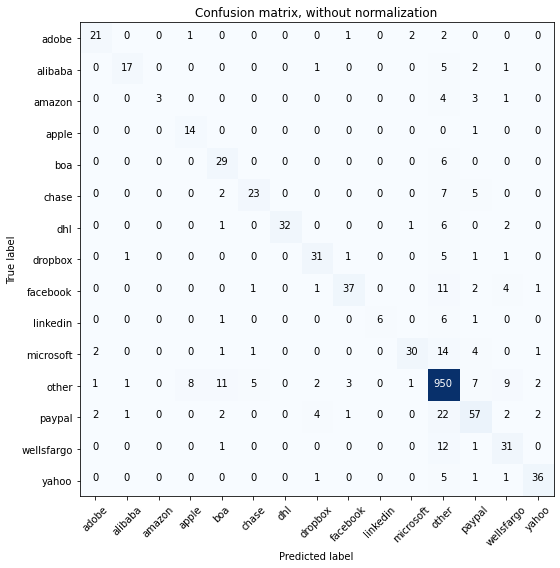

Acc     =  0.856
Pre     =  0.86
Rec     =  0.856
F1      =  0.851

Bal_Acc =  0.689
Bal_Pre =  0.812
Bal_Rec =  0.689
Bal_F1  =  0.745

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.85      0.65      0.74        26
      amazon       1.00      0.27      0.43        11
       apple       0.61      0.93      0.74        15
         boa       0.60      0.83      0.70        35
       chase       0.77      0.62      0.69        37
         dhl       1.00      0.76      0.86        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.57      0.69        53
       other       0.90      0.95      0.92      1000
      paypal       0.67      0.61      0.64        93
  wellsfargo       0.60      0.69      0.64        45
       yahoo       0.86      0.82      0.84        4

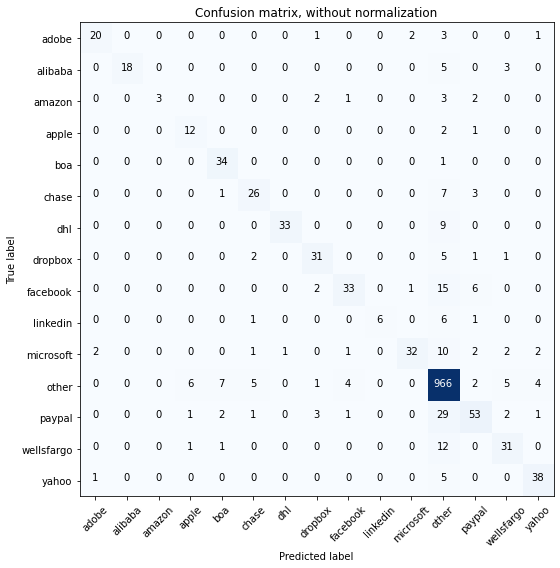

Acc     =  0.868
Pre     =  0.869
Rec     =  0.868
F1      =  0.861

Bal_Acc =  0.696
Bal_Pre =  0.84
Bal_Rec =  0.696
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.87      0.74      0.80        27
     alibaba       1.00      0.69      0.82        26
      amazon       1.00      0.27      0.43        11
       apple       0.60      0.80      0.69        15
         boa       0.76      0.97      0.85        35
       chase       0.72      0.70      0.71        37
         dhl       0.97      0.79      0.87        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.82      0.58      0.68        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.90      0.97      0.93      1000
      paypal       0.75      0.57      0.65        93
  wellsfargo       0.70      0.69      0.70        45
       yahoo       0.83      0.86      0.84        4

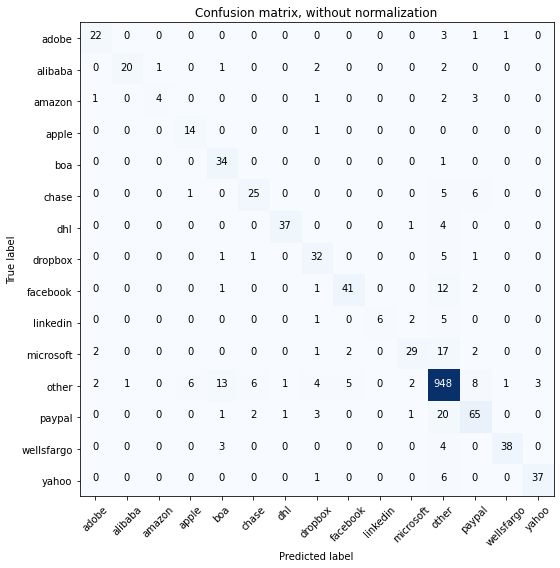

Acc     =  0.878
Pre     =  0.882
Rec     =  0.878
F1      =  0.876

Bal_Acc =  0.749
Bal_Pre =  0.829
Bal_Rec =  0.749
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.80      0.36      0.50        11
       apple       0.67      0.93      0.78        15
         boa       0.63      0.97      0.76        35
       chase       0.74      0.68      0.70        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.68      0.80      0.74        40
    facebook       0.85      0.72      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.83      0.55      0.66        53
       other       0.92      0.95      0.93      1000
      paypal       0.74      0.70      0.72        93
  wellsfargo       0.95      0.84      0.89        45
       yahoo       0.93      0.84      0.88        

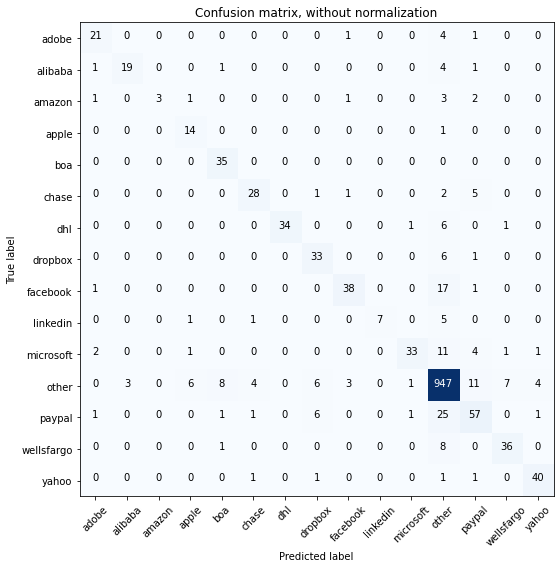

Acc     =  0.874
Pre     =  0.877
Rec     =  0.874
F1      =  0.87

Bal_Acc =  0.744
Bal_Pre =  0.837
Bal_Rec =  0.744
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.86      0.73      0.79        26
      amazon       1.00      0.27      0.43        11
       apple       0.61      0.93      0.74        15
         boa       0.76      1.00      0.86        35
       chase       0.80      0.76      0.78        37
         dhl       1.00      0.81      0.89        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.86      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.91      0.95      0.93      1000
      paypal       0.68      0.61      0.64        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.87      0.91      0.89        4

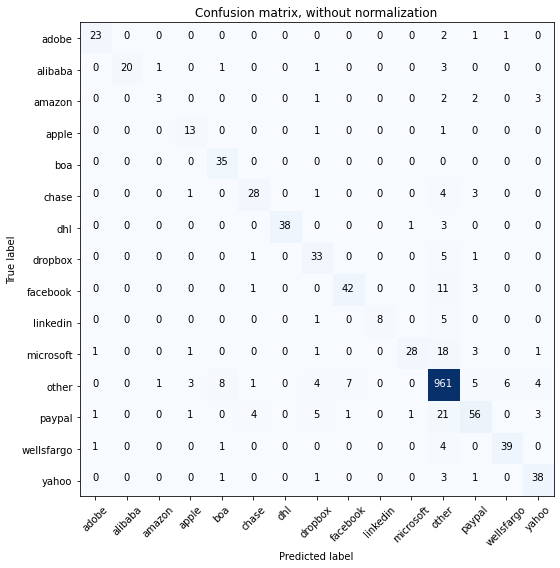

Acc     =  0.887
Pre     =  0.888
Rec     =  0.887
F1      =  0.883

Bal_Acc =  0.758
Bal_Pre =  0.831
Bal_Rec =  0.758
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.88      0.85      0.87        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.60      0.27      0.37        11
       apple       0.68      0.87      0.76        15
         boa       0.76      1.00      0.86        35
       chase       0.80      0.76      0.78        37
         dhl       1.00      0.90      0.95        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.84      0.74      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.93      0.53      0.67        53
       other       0.92      0.96      0.94      1000
      paypal       0.75      0.60      0.67        93
  wellsfargo       0.85      0.87      0.86        45
       yahoo       0.78      0.86      0.82        

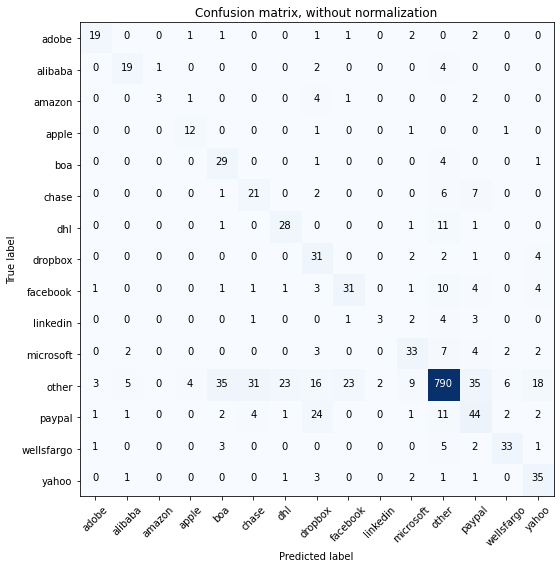

Acc     =  0.735
Pre     =  0.786
Rec     =  0.735
F1      =  0.75

Bal_Acc =  0.635
Bal_Pre =  0.589
Bal_Rec =  0.635
Bal_F1  =  0.611

              precision    recall  f1-score   support

       adobe       0.76      0.70      0.73        27
     alibaba       0.68      0.73      0.70        26
      amazon       0.75      0.27      0.40        11
       apple       0.67      0.80      0.73        15
         boa       0.40      0.83      0.54        35
       chase       0.36      0.57      0.44        37
         dhl       0.52      0.67      0.58        42
     dropbox       0.34      0.78      0.47        40
    facebook       0.54      0.54      0.54        57
    linkedin       0.60      0.21      0.32        14
   microsoft       0.61      0.62      0.62        53
       other       0.92      0.79      0.85      1000
      paypal       0.42      0.47      0.44        93
  wellsfargo       0.75      0.73      0.74        45
       yahoo       0.52      0.80      0.63        4

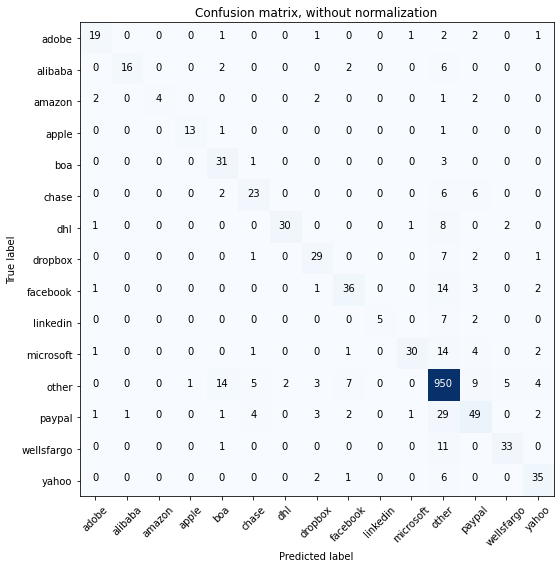

Acc     =  0.847
Pre     =  0.849
Rec     =  0.847
F1      =  0.841

Bal_Acc =  0.67
Bal_Pre =  0.816
Bal_Rec =  0.67
Bal_F1  =  0.736

              precision    recall  f1-score   support

       adobe       0.76      0.70      0.73        27
     alibaba       0.94      0.62      0.74        26
      amazon       1.00      0.36      0.53        11
       apple       0.93      0.87      0.90        15
         boa       0.58      0.89      0.70        35
       chase       0.66      0.62      0.64        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.71      0.72      0.72        40
    facebook       0.73      0.63      0.68        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.91      0.57      0.70        53
       other       0.89      0.95      0.92      1000
      paypal       0.62      0.53      0.57        93
  wellsfargo       0.82      0.73      0.78        45
       yahoo       0.74      0.80      0.77        44

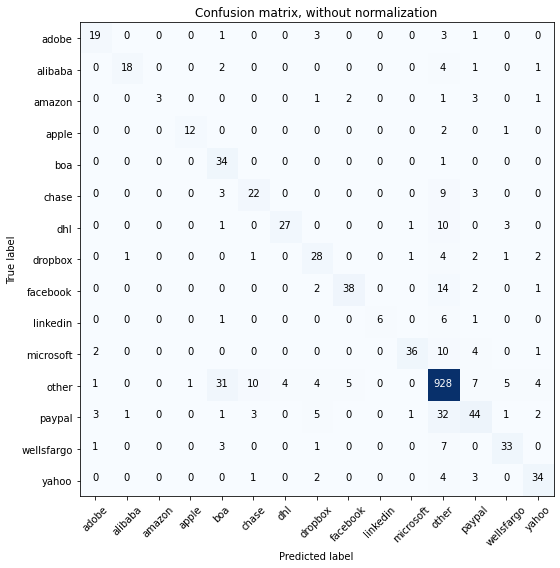

Acc     =  0.833
Pre     =  0.843
Rec     =  0.833
F1      =  0.831

Bal_Acc =  0.671
Bal_Pre =  0.79
Bal_Rec =  0.671
Bal_F1  =  0.726

              precision    recall  f1-score   support

       adobe       0.73      0.70      0.72        27
     alibaba       0.90      0.69      0.78        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.44      0.97      0.61        35
       chase       0.59      0.59      0.59        37
         dhl       0.87      0.64      0.74        42
     dropbox       0.61      0.70      0.65        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.92      0.68      0.78        53
       other       0.90      0.93      0.91      1000
      paypal       0.62      0.47      0.54        93
  wellsfargo       0.75      0.73      0.74        45
       yahoo       0.74      0.77      0.76        4

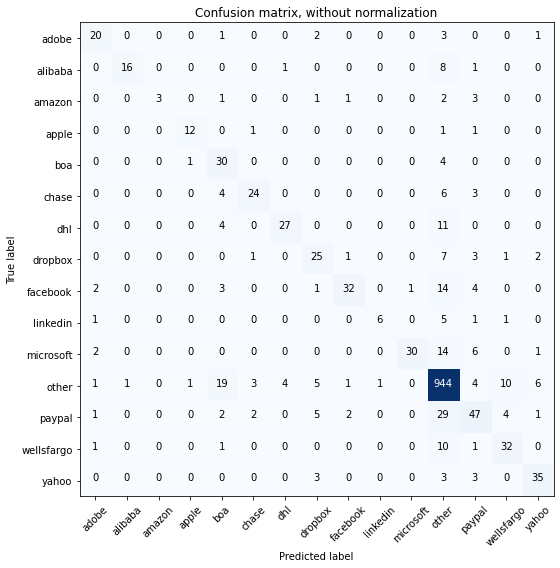

Acc     =  0.834
Pre     =  0.841
Rec     =  0.834
F1      =  0.829

Bal_Acc =  0.648
Bal_Pre =  0.787
Bal_Rec =  0.648
Bal_F1  =  0.711

              precision    recall  f1-score   support

       adobe       0.71      0.74      0.73        27
     alibaba       0.94      0.62      0.74        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.46      0.86      0.60        35
       chase       0.77      0.65      0.71        37
         dhl       0.84      0.64      0.73        42
     dropbox       0.60      0.62      0.61        40
    facebook       0.86      0.56      0.68        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.97      0.57      0.71        53
       other       0.89      0.94      0.92      1000
      paypal       0.61      0.51      0.55        93
  wellsfargo       0.67      0.71      0.69        45
       yahoo       0.76      0.80      0.78        

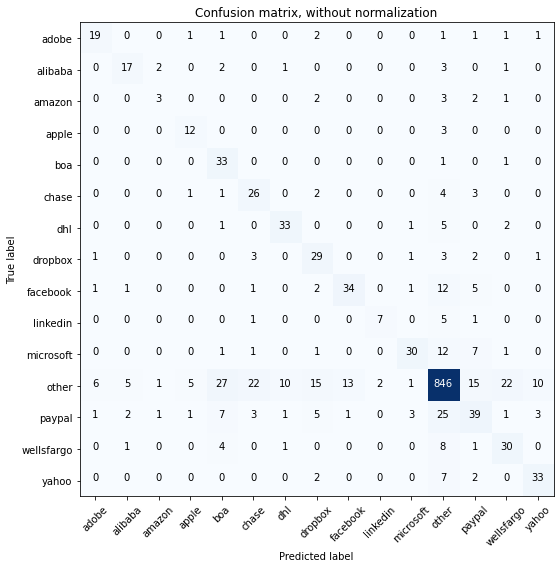

Acc     =  0.774
Pre     =  0.796
Rec     =  0.774
F1      =  0.779

Bal_Acc =  0.662
Bal_Pre =  0.622
Bal_Rec =  0.662
Bal_F1  =  0.641

              precision    recall  f1-score   support

       adobe       0.68      0.70      0.69        27
     alibaba       0.65      0.65      0.65        26
      amazon       0.43      0.27      0.33        11
       apple       0.60      0.80      0.69        15
         boa       0.43      0.94      0.59        35
       chase       0.46      0.70      0.55        37
         dhl       0.72      0.79      0.75        42
     dropbox       0.48      0.72      0.58        40
    facebook       0.71      0.60      0.65        57
    linkedin       0.78      0.50      0.61        14
   microsoft       0.81      0.57      0.67        53
       other       0.90      0.85      0.87      1000
      paypal       0.50      0.42      0.46        93
  wellsfargo       0.50      0.67      0.57        45
       yahoo       0.69      0.75      0.72        

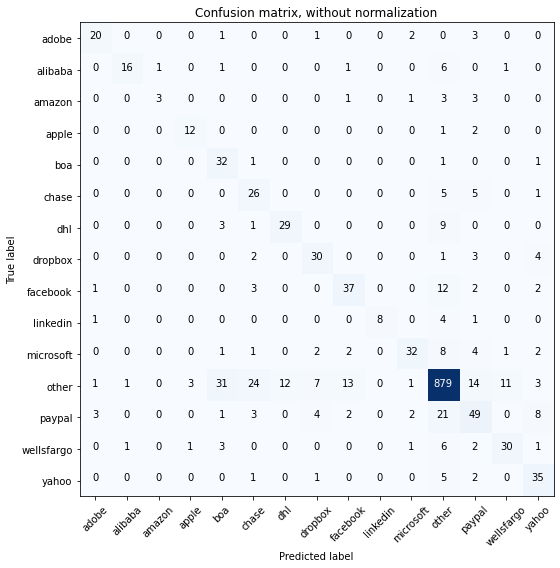

Acc     =  0.804
Pre     =  0.825
Rec     =  0.804
F1      =  0.809

Bal_Acc =  0.679
Bal_Pre =  0.709
Bal_Rec =  0.679
Bal_F1  =  0.694

              precision    recall  f1-score   support

       adobe       0.77      0.74      0.75        27
     alibaba       0.89      0.62      0.73        26
      amazon       0.75      0.27      0.40        11
       apple       0.75      0.80      0.77        15
         boa       0.44      0.91      0.59        35
       chase       0.42      0.70      0.53        37
         dhl       0.71      0.69      0.70        42
     dropbox       0.67      0.75      0.71        40
    facebook       0.66      0.65      0.65        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.82      0.60      0.70        53
       other       0.91      0.88      0.90      1000
      paypal       0.54      0.53      0.54        93
  wellsfargo       0.70      0.67      0.68        45
       yahoo       0.61      0.80      0.69        

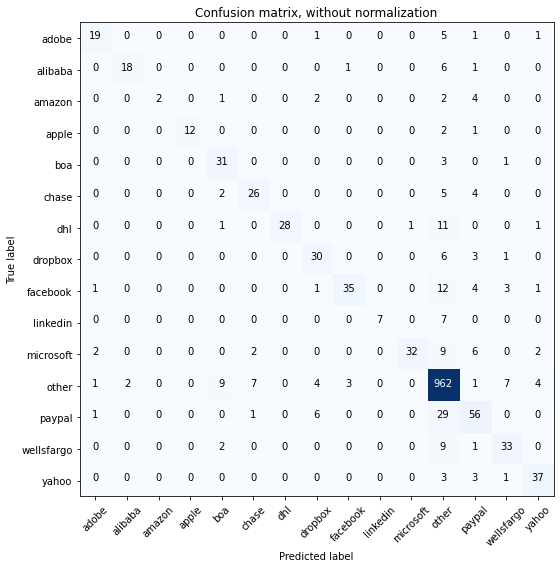

Acc     =  0.863
Pre     =  0.867
Rec     =  0.863
F1      =  0.857

Bal_Acc =  0.683
Bal_Pre =  0.848
Bal_Rec =  0.683
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.79      0.70      0.75        27
     alibaba       0.90      0.69      0.78        26
      amazon       1.00      0.18      0.31        11
       apple       1.00      0.80      0.89        15
         boa       0.67      0.89      0.77        35
       chase       0.72      0.70      0.71        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.68      0.75      0.71        40
    facebook       0.90      0.61      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.60      0.74        53
       other       0.90      0.96      0.93      1000
      paypal       0.66      0.60      0.63        93
  wellsfargo       0.72      0.73      0.73        45
       yahoo       0.80      0.84      0.82        

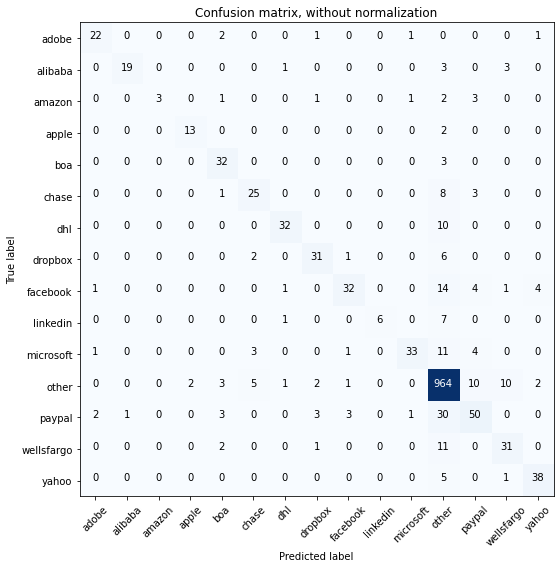

Acc     =  0.865
Pre     =  0.864
Rec     =  0.865
F1      =  0.858

Bal_Acc =  0.699
Bal_Pre =  0.842
Bal_Rec =  0.699
Bal_F1  =  0.764

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       0.87      0.87      0.87        15
         boa       0.73      0.91      0.81        35
       chase       0.71      0.68      0.69        37
         dhl       0.89      0.76      0.82        42
     dropbox       0.79      0.78      0.78        40
    facebook       0.84      0.56      0.67        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.92      0.62      0.74        53
       other       0.90      0.96      0.93      1000
      paypal       0.68      0.54      0.60        93
  wellsfargo       0.67      0.69      0.68        45
       yahoo       0.84      0.86      0.85        

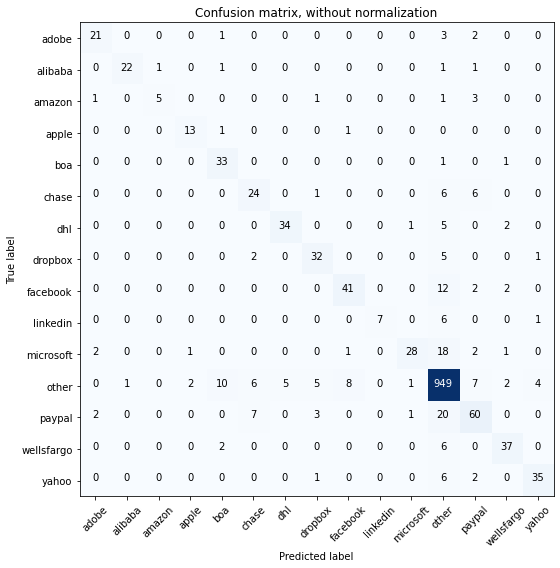

Acc     =  0.871
Pre     =  0.872
Rec     =  0.871
F1      =  0.868

Bal_Acc =  0.74
Bal_Pre =  0.822
Bal_Rec =  0.74
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       0.81      0.87      0.84        15
         boa       0.69      0.94      0.80        35
       chase       0.62      0.65      0.63        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.53      0.67        53
       other       0.91      0.95      0.93      1000
      paypal       0.71      0.65      0.67        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.85      0.80      0.82        44

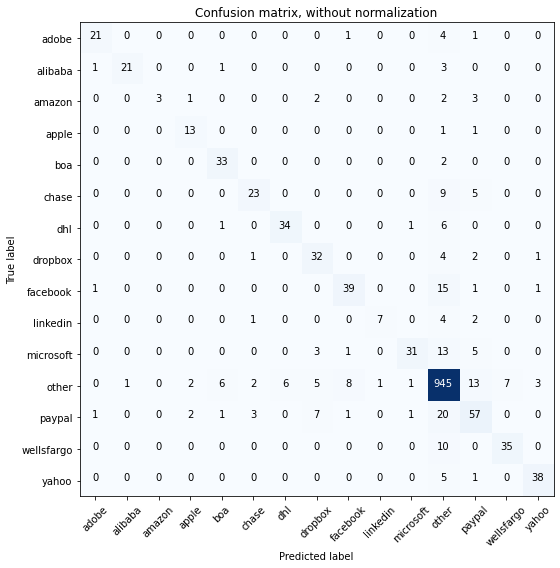

Acc     =  0.865
Pre     =  0.867
Rec     =  0.865
F1      =  0.862

Bal_Acc =  0.724
Bal_Pre =  0.828
Bal_Rec =  0.724
Bal_F1  =  0.773

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.95      0.81      0.88        26
      amazon       1.00      0.27      0.43        11
       apple       0.72      0.87      0.79        15
         boa       0.79      0.94      0.86        35
       chase       0.77      0.62      0.69        37
         dhl       0.85      0.81      0.83        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.78      0.68      0.73        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.94      0.93      1000
      paypal       0.63      0.61      0.62        93
  wellsfargo       0.83      0.78      0.80        45
       yahoo       0.88      0.86      0.87        

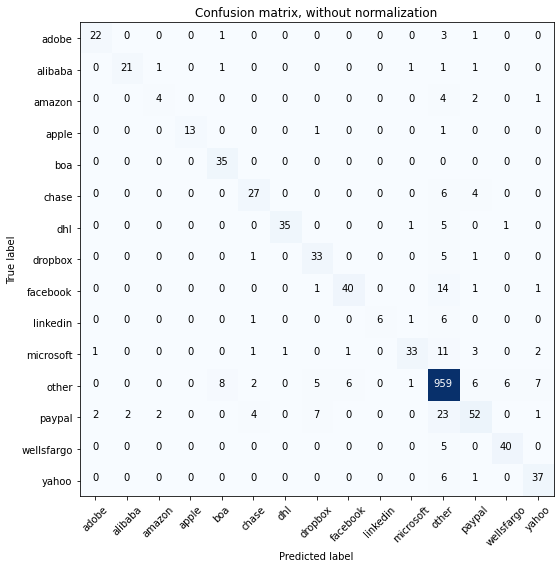

Acc     =  0.882
Pre     =  0.881
Rec     =  0.882
F1      =  0.877

Bal_Acc =  0.749
Bal_Pre =  0.837
Bal_Rec =  0.749
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.57      0.36      0.44        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.75      0.73      0.74        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.96      0.94      1000
      paypal       0.72      0.56      0.63        93
  wellsfargo       0.85      0.89      0.87        45
       yahoo       0.76      0.84      0.80        

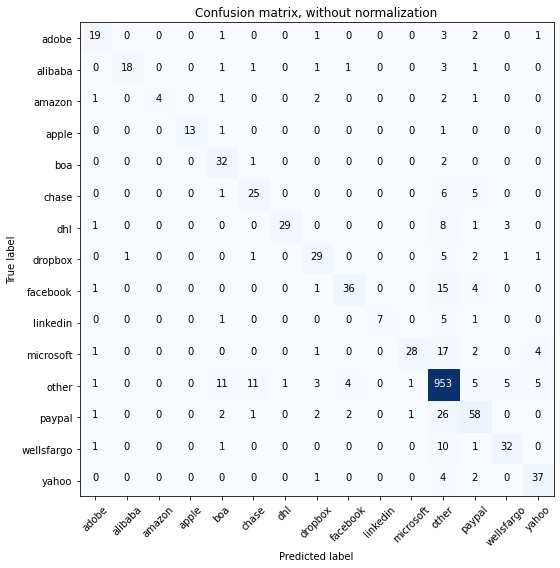

Acc     =  0.858
Pre     =  0.862
Rec     =  0.858
F1      =  0.853

Bal_Acc =  0.695
Bal_Pre =  0.833
Bal_Rec =  0.695
Bal_F1  =  0.758

              precision    recall  f1-score   support

       adobe       0.73      0.70      0.72        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.36      0.53        11
       apple       1.00      0.87      0.93        15
         boa       0.62      0.91      0.74        35
       chase       0.62      0.68      0.65        37
         dhl       0.97      0.69      0.81        42
     dropbox       0.71      0.72      0.72        40
    facebook       0.84      0.63      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.93      0.53      0.67        53
       other       0.90      0.95      0.93      1000
      paypal       0.68      0.62      0.65        93
  wellsfargo       0.78      0.71      0.74        45
       yahoo       0.77      0.84      0.80        

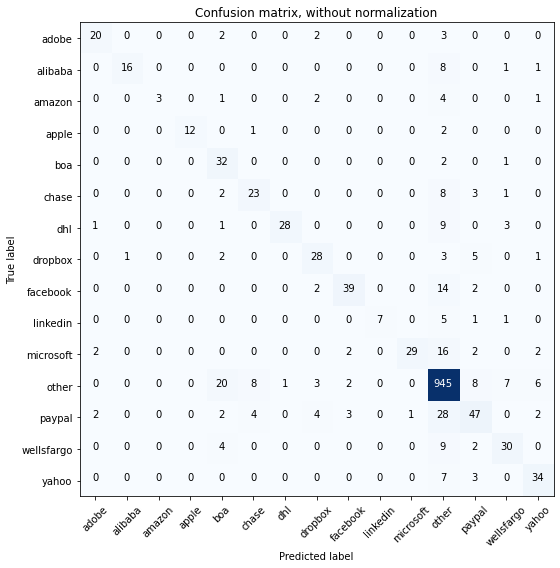

Acc     =  0.84
Pre     =  0.848
Rec     =  0.84
F1      =  0.836

Bal_Acc =  0.664
Bal_Pre =  0.818
Bal_Rec =  0.664
Bal_F1  =  0.733

              precision    recall  f1-score   support

       adobe       0.80      0.74      0.77        27
     alibaba       0.94      0.62      0.74        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.48      0.91      0.63        35
       chase       0.64      0.62      0.63        37
         dhl       0.97      0.67      0.79        42
     dropbox       0.68      0.70      0.69        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.55      0.70        53
       other       0.89      0.94      0.92      1000
      paypal       0.64      0.51      0.57        93
  wellsfargo       0.68      0.67      0.67        45
       yahoo       0.72      0.77      0.75        44

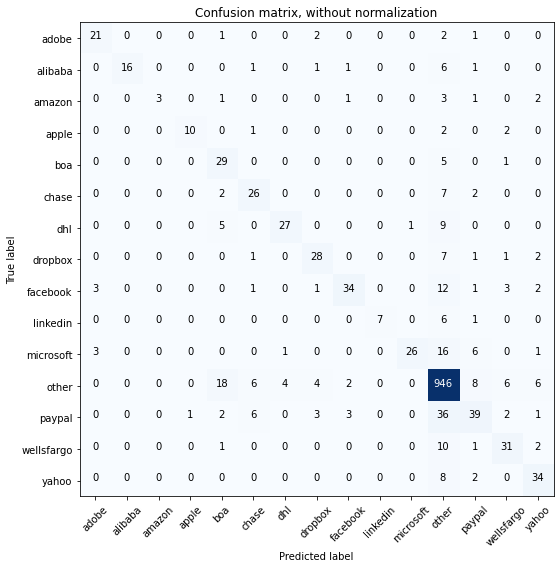

Acc     =  0.83
Pre     =  0.835
Rec     =  0.83
F1      =  0.823

Bal_Acc =  0.641
Bal_Pre =  0.8
Bal_Rec =  0.641
Bal_F1  =  0.712

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.62      0.76        26
      amazon       1.00      0.27      0.43        11
       apple       0.91      0.67      0.77        15
         boa       0.49      0.83      0.62        35
       chase       0.62      0.70      0.66        37
         dhl       0.84      0.64      0.73        42
     dropbox       0.72      0.70      0.71        40
    facebook       0.83      0.60      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.96      0.49      0.65        53
       other       0.88      0.95      0.91      1000
      paypal       0.61      0.42      0.50        93
  wellsfargo       0.67      0.69      0.68        45
       yahoo       0.68      0.77      0.72        44



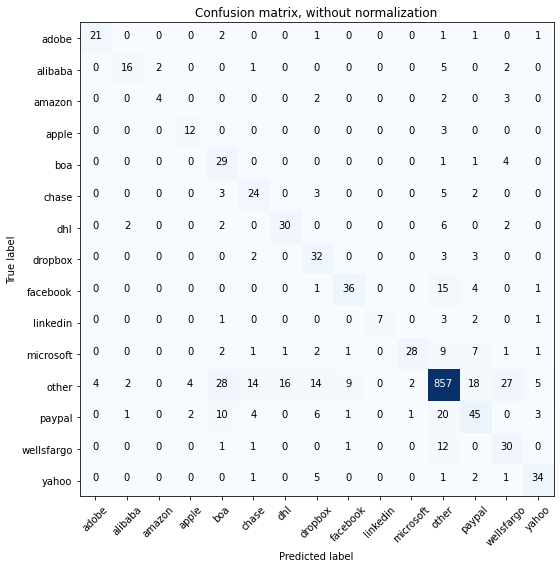

Acc     =  0.783
Pre     =  0.814
Rec     =  0.783
F1      =  0.79

Bal_Acc =  0.666
Bal_Pre =  0.679
Bal_Rec =  0.666
Bal_F1  =  0.672

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.76      0.62      0.68        26
      amazon       0.67      0.36      0.47        11
       apple       0.67      0.80      0.73        15
         boa       0.37      0.83      0.51        35
       chase       0.50      0.65      0.56        37
         dhl       0.64      0.71      0.67        42
     dropbox       0.48      0.80      0.60        40
    facebook       0.75      0.63      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.53      0.67        53
       other       0.91      0.86      0.88      1000
      paypal       0.53      0.48      0.51        93
  wellsfargo       0.43      0.67      0.52        45
       yahoo       0.74      0.77      0.76        4

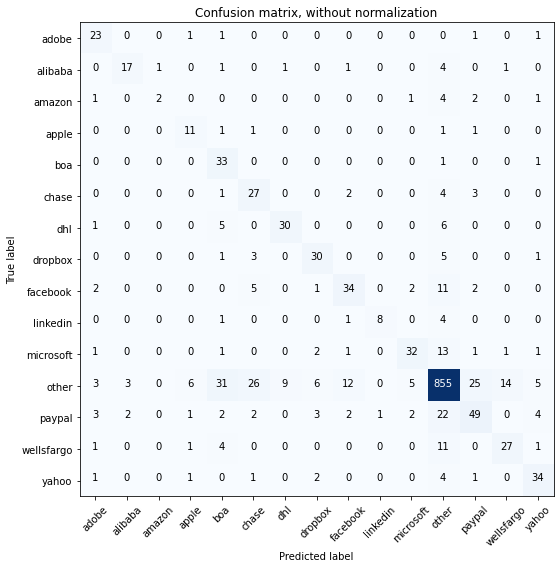

Acc     =  0.788
Pre     =  0.81
Rec     =  0.788
F1      =  0.793

Bal_Acc =  0.672
Bal_Pre =  0.663
Bal_Rec =  0.672
Bal_F1  =  0.667

              precision    recall  f1-score   support

       adobe       0.64      0.85      0.73        27
     alibaba       0.77      0.65      0.71        26
      amazon       0.67      0.18      0.29        11
       apple       0.52      0.73      0.61        15
         boa       0.40      0.94      0.56        35
       chase       0.42      0.73      0.53        37
         dhl       0.75      0.71      0.73        42
     dropbox       0.68      0.75      0.71        40
    facebook       0.64      0.60      0.62        57
    linkedin       0.89      0.57      0.70        14
   microsoft       0.76      0.60      0.67        53
       other       0.90      0.85      0.88      1000
      paypal       0.58      0.53      0.55        93
  wellsfargo       0.63      0.60      0.61        45
       yahoo       0.69      0.77      0.73        4

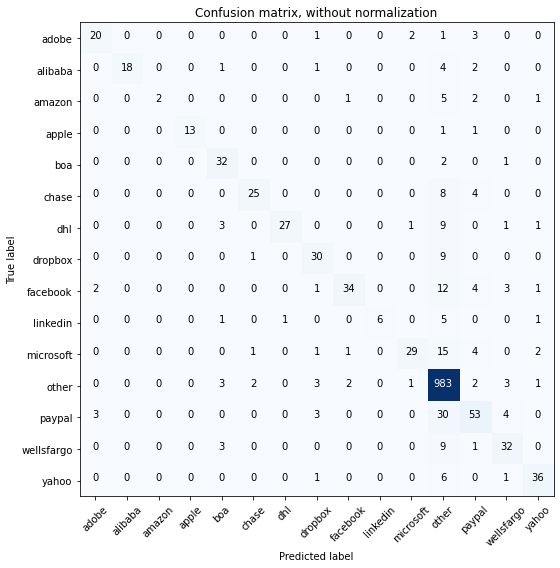

Acc     =  0.871
Pre     =  0.871
Rec     =  0.871
F1      =  0.862

Bal_Acc =  0.675
Bal_Pre =  0.868
Bal_Rec =  0.675
Bal_F1  =  0.759

              precision    recall  f1-score   support

       adobe       0.80      0.74      0.77        27
     alibaba       1.00      0.69      0.82        26
      amazon       1.00      0.18      0.31        11
       apple       1.00      0.87      0.93        15
         boa       0.74      0.91      0.82        35
       chase       0.86      0.68      0.76        37
         dhl       0.96      0.64      0.77        42
     dropbox       0.73      0.75      0.74        40
    facebook       0.89      0.60      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.55      0.67        53
       other       0.89      0.98      0.94      1000
      paypal       0.70      0.57      0.63        93
  wellsfargo       0.71      0.71      0.71        45
       yahoo       0.84      0.82      0.83        

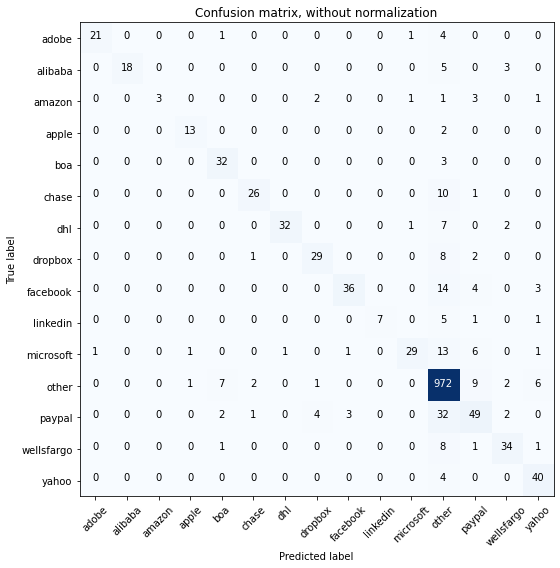

Acc     =  0.871
Pre     =  0.872
Rec     =  0.871
F1      =  0.864

Bal_Acc =  0.704
Bal_Pre =  0.873
Bal_Rec =  0.704
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.95      0.78      0.86        27
     alibaba       1.00      0.69      0.82        26
      amazon       1.00      0.27      0.43        11
       apple       0.87      0.87      0.87        15
         boa       0.74      0.91      0.82        35
       chase       0.87      0.70      0.78        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.81      0.72      0.76        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.97      0.93      1000
      paypal       0.64      0.53      0.58        93
  wellsfargo       0.79      0.76      0.77        45
       yahoo       0.75      0.91      0.82        

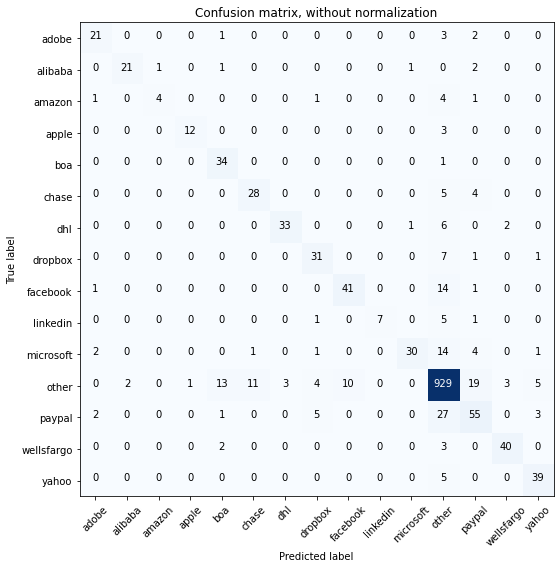

Acc     =  0.861
Pre     =  0.864
Rec     =  0.861
F1      =  0.859

Bal_Acc =  0.741
Bal_Pre =  0.823
Bal_Rec =  0.741
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.65      0.97      0.78        35
       chase       0.70      0.76      0.73        37
         dhl       0.92      0.79      0.85        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.93      0.92      1000
      paypal       0.61      0.59      0.60        93
  wellsfargo       0.89      0.89      0.89        45
       yahoo       0.80      0.89      0.84        4

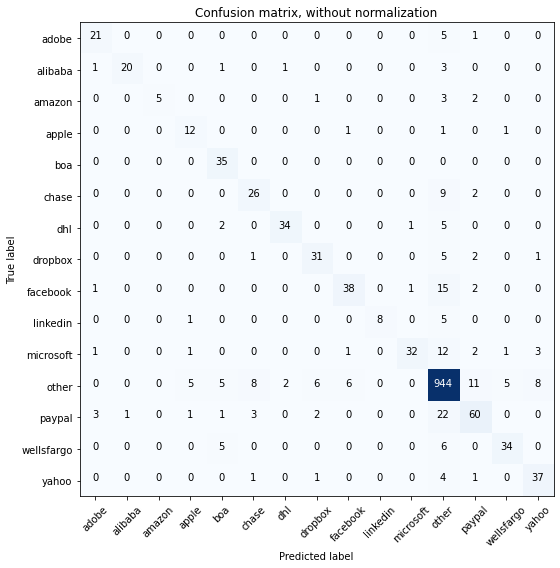

Acc     =  0.869
Pre     =  0.872
Rec     =  0.869
F1      =  0.866

Bal_Acc =  0.741
Bal_Pre =  0.825
Bal_Rec =  0.741
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.45      0.62        11
       apple       0.60      0.80      0.69        15
         boa       0.71      1.00      0.83        35
       chase       0.67      0.70      0.68        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.76      0.78      0.77        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.60      0.74        53
       other       0.91      0.94      0.93      1000
      paypal       0.72      0.65      0.68        93
  wellsfargo       0.83      0.76      0.79        45
       yahoo       0.76      0.84      0.80        

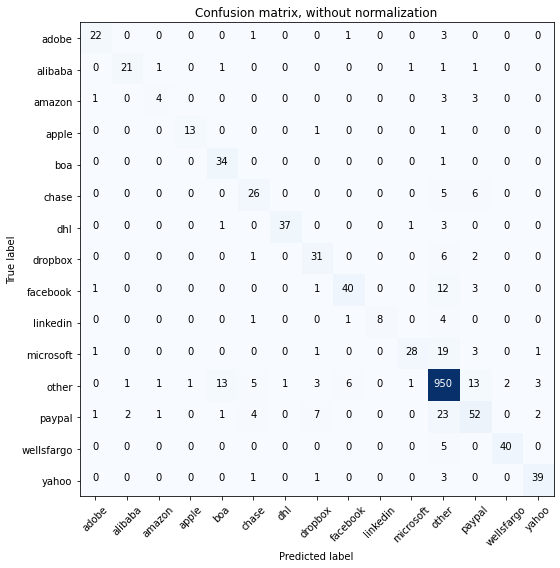

Acc     =  0.874
Pre     =  0.874
Rec     =  0.874
F1      =  0.87

Bal_Acc =  0.751
Bal_Pre =  0.822
Bal_Rec =  0.751
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.57      0.36      0.44        11
       apple       0.93      0.87      0.90        15
         boa       0.68      0.97      0.80        35
       chase       0.67      0.70      0.68        37
         dhl       0.97      0.88      0.93        42
     dropbox       0.69      0.78      0.73        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.90      0.53      0.67        53
       other       0.91      0.95      0.93      1000
      paypal       0.63      0.56      0.59        93
  wellsfargo       0.95      0.89      0.92        45
       yahoo       0.87      0.89      0.88        4

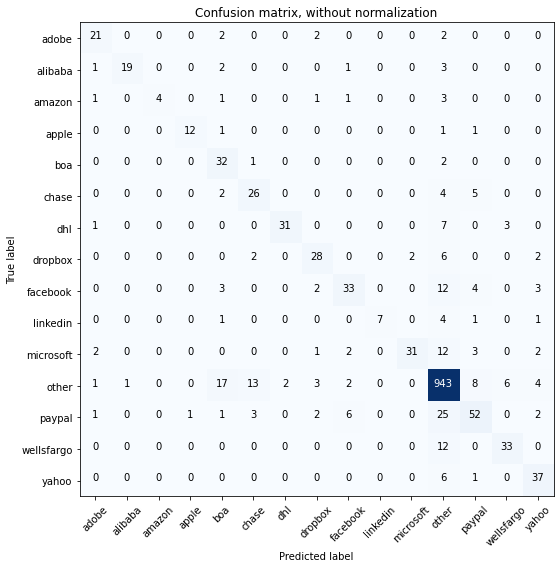

Acc     =  0.851
Pre     =  0.858
Rec     =  0.851
F1      =  0.848

Bal_Acc =  0.698
Bal_Pre =  0.81
Bal_Rec =  0.698
Bal_F1  =  0.75

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.92      0.80      0.86        15
         boa       0.52      0.91      0.66        35
       chase       0.58      0.70      0.63        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.72      0.70      0.71        40
    facebook       0.73      0.58      0.65        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.58      0.72        53
       other       0.90      0.94      0.92      1000
      paypal       0.69      0.56      0.62        93
  wellsfargo       0.79      0.73      0.76        45
       yahoo       0.73      0.84      0.78        44

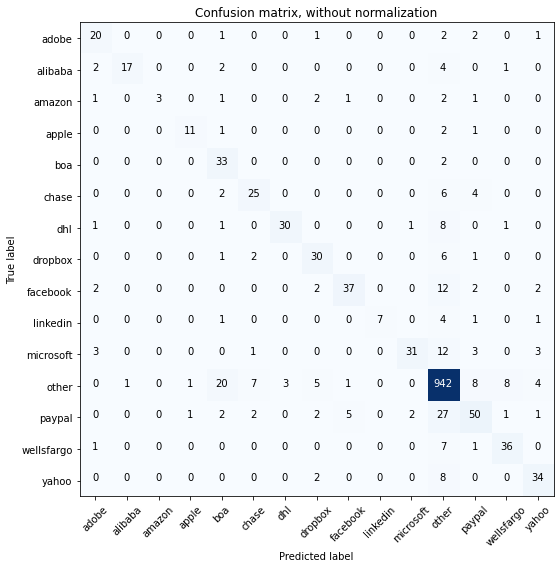

Acc     =  0.849
Pre     =  0.856
Rec     =  0.849
F1      =  0.845

Bal_Acc =  0.685
Bal_Pre =  0.804
Bal_Rec =  0.685
Bal_F1  =  0.74

              precision    recall  f1-score   support

       adobe       0.67      0.74      0.70        27
     alibaba       0.94      0.65      0.77        26
      amazon       1.00      0.27      0.43        11
       apple       0.85      0.73      0.79        15
         boa       0.51      0.94      0.66        35
       chase       0.68      0.68      0.68        37
         dhl       0.91      0.71      0.80        42
     dropbox       0.68      0.75      0.71        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.90      0.94      0.92      1000
      paypal       0.68      0.54      0.60        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.74      0.77      0.76        4

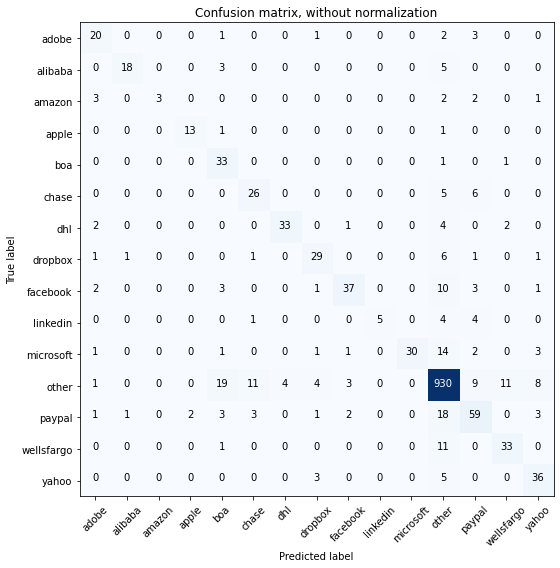

Acc     =  0.848
Pre     =  0.86
Rec     =  0.848
F1      =  0.846

Bal_Acc =  0.694
Bal_Pre =  0.797
Bal_Rec =  0.694
Bal_F1  =  0.742

              precision    recall  f1-score   support

       adobe       0.65      0.74      0.69        27
     alibaba       0.90      0.69      0.78        26
      amazon       1.00      0.27      0.43        11
       apple       0.87      0.87      0.87        15
         boa       0.51      0.94      0.66        35
       chase       0.62      0.70      0.66        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.72      0.72      0.73        40
    facebook       0.84      0.65      0.73        57
    linkedin       1.00      0.36      0.53        14
   microsoft       1.00      0.57      0.72        53
       other       0.91      0.93      0.92      1000
      paypal       0.66      0.63      0.65        93
  wellsfargo       0.70      0.73      0.72        45
       yahoo       0.68      0.82      0.74        4

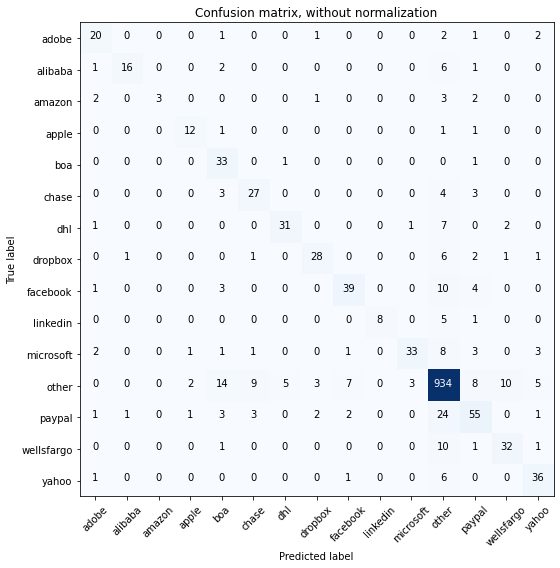

Acc     =  0.849
Pre     =  0.855
Rec     =  0.849
F1      =  0.847

Bal_Acc =  0.698
Bal_Pre =  0.79
Bal_Rec =  0.698
Bal_F1  =  0.741

              precision    recall  f1-score   support

       adobe       0.69      0.74      0.71        27
     alibaba       0.89      0.62      0.73        26
      amazon       1.00      0.27      0.43        11
       apple       0.75      0.80      0.77        15
         boa       0.53      0.94      0.68        35
       chase       0.66      0.73      0.69        37
         dhl       0.84      0.74      0.78        42
     dropbox       0.80      0.70      0.75        40
    facebook       0.78      0.68      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.93      0.92      1000
      paypal       0.66      0.59      0.62        93
  wellsfargo       0.71      0.71      0.71        45
       yahoo       0.73      0.82      0.77        4

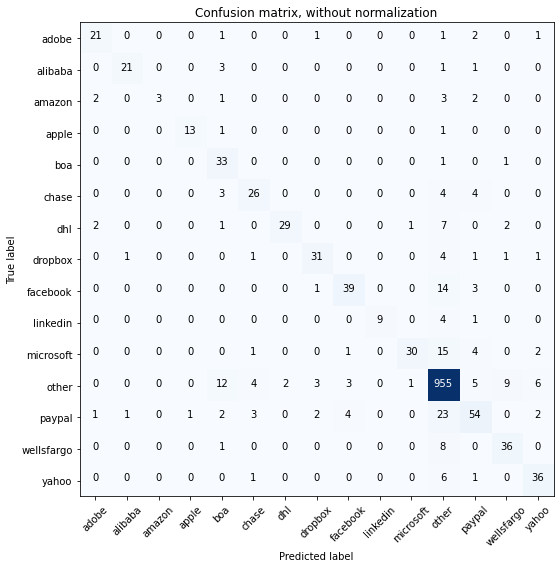

Acc     =  0.868
Pre     =  0.872
Rec     =  0.868
F1      =  0.864

Bal_Acc =  0.726
Bal_Pre =  0.837
Bal_Rec =  0.726
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.91      0.81      0.86        26
      amazon       1.00      0.27      0.43        11
       apple       0.93      0.87      0.90        15
         boa       0.57      0.94      0.71        35
       chase       0.72      0.70      0.71        37
         dhl       0.94      0.69      0.79        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.95      0.93      1000
      paypal       0.69      0.58      0.63        93
  wellsfargo       0.73      0.80      0.77        45
       yahoo       0.75      0.82      0.78        

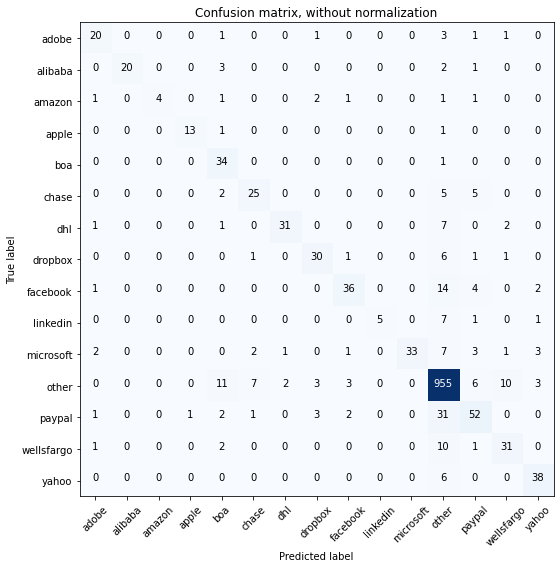

Acc     =  0.862
Pre     =  0.867
Rec     =  0.862
F1      =  0.858

Bal_Acc =  0.704
Bal_Pre =  0.835
Bal_Rec =  0.704
Bal_F1  =  0.764

              precision    recall  f1-score   support

       adobe       0.74      0.74      0.74        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.36      0.53        11
       apple       0.93      0.87      0.90        15
         boa       0.59      0.97      0.73        35
       chase       0.69      0.68      0.68        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.77      0.75      0.76        40
    facebook       0.82      0.63      0.71        57
    linkedin       1.00      0.36      0.53        14
   microsoft       1.00      0.62      0.77        53
       other       0.90      0.95      0.93      1000
      paypal       0.68      0.56      0.62        93
  wellsfargo       0.67      0.69      0.68        45
       yahoo       0.81      0.86      0.84        

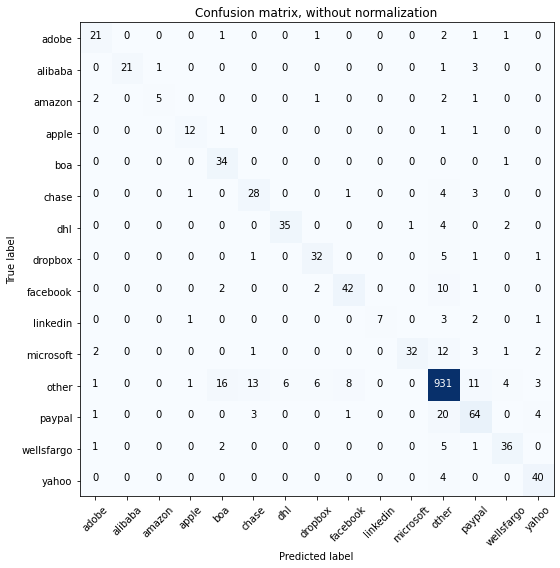

Acc     =  0.871
Pre     =  0.878
Rec     =  0.871
F1      =  0.87

Bal_Acc =  0.758
Bal_Pre =  0.813
Bal_Rec =  0.758
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.83      0.45      0.59        11
       apple       0.80      0.80      0.80        15
         boa       0.61      0.97      0.75        35
       chase       0.61      0.76      0.67        37
         dhl       0.85      0.83      0.84        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.81      0.74      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.60      0.74        53
       other       0.93      0.93      0.93      1000
      paypal       0.70      0.69      0.69        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.78      0.91      0.84        4

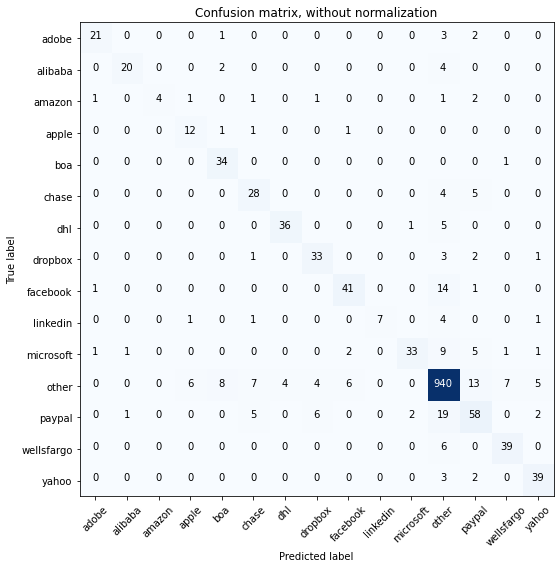

Acc     =  0.874
Pre     =  0.878
Rec     =  0.874
F1      =  0.872

Bal_Acc =  0.752
Bal_Pre =  0.822
Bal_Rec =  0.752
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.60      0.80      0.69        15
         boa       0.74      0.97      0.84        35
       chase       0.64      0.76      0.69        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.75      0.82      0.79        40
    facebook       0.82      0.72      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.93      0.94      0.93      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.81      0.87      0.84        45
       yahoo       0.80      0.89      0.84        

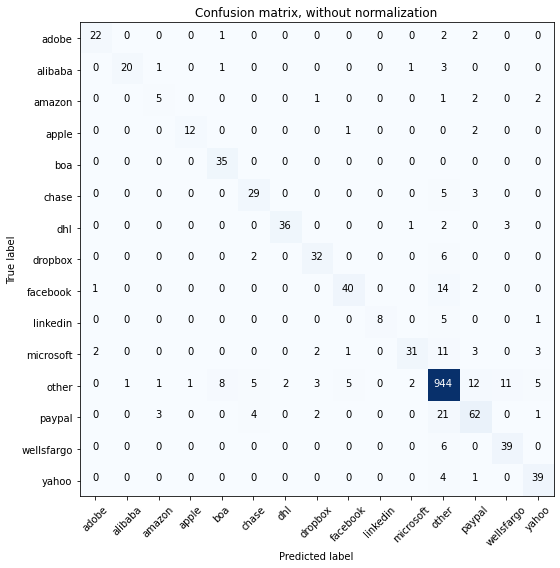

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.878

Bal_Acc =  0.767
Bal_Pre =  0.824
Bal_Rec =  0.767
Bal_F1  =  0.794

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.50      0.45      0.48        11
       apple       0.92      0.80      0.86        15
         boa       0.78      1.00      0.88        35
       chase       0.72      0.78      0.75        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.58      0.70        53
       other       0.92      0.94      0.93      1000
      paypal       0.70      0.67      0.68        93
  wellsfargo       0.74      0.87      0.80        45
       yahoo       0.76      0.89      0.82        44

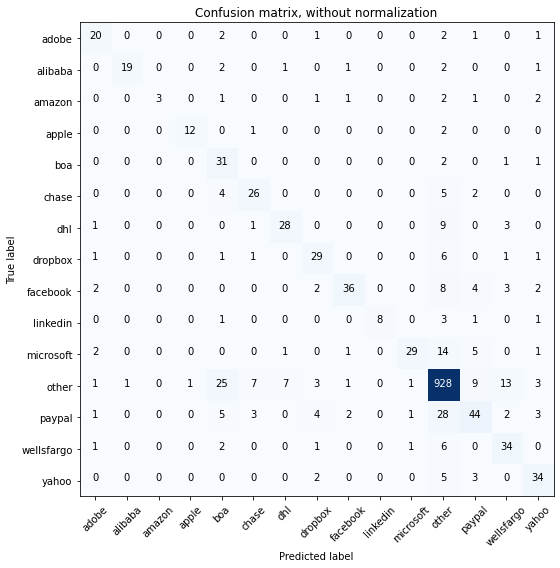

Acc     =  0.832
Pre     =  0.845
Rec     =  0.832
F1      =  0.831

Bal_Acc =  0.68
Bal_Pre =  0.777
Bal_Rec =  0.68
Bal_F1  =  0.725

              precision    recall  f1-score   support

       adobe       0.69      0.74      0.71        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.42      0.89      0.57        35
       chase       0.67      0.70      0.68        37
         dhl       0.76      0.67      0.71        42
     dropbox       0.67      0.72      0.70        40
    facebook       0.86      0.63      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.55      0.68        53
       other       0.91      0.93      0.92      1000
      paypal       0.63      0.47      0.54        93
  wellsfargo       0.60      0.76      0.67        45
       yahoo       0.68      0.77      0.72        44

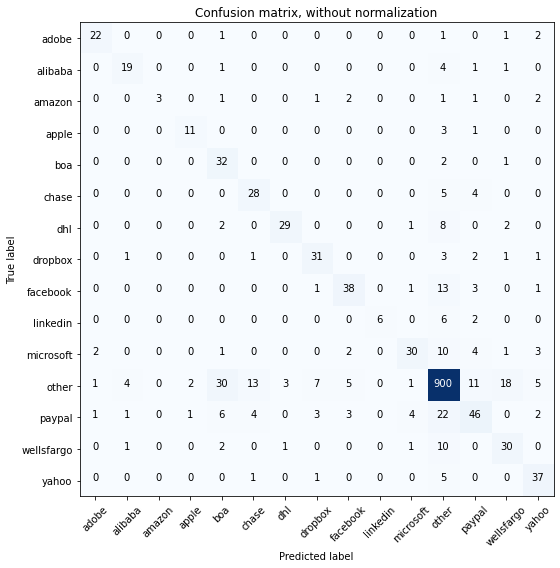

Acc     =  0.82
Pre     =  0.835
Rec     =  0.82
F1      =  0.821

Bal_Acc =  0.683
Bal_Pre =  0.752
Bal_Rec =  0.683
Bal_F1  =  0.716

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.73      0.73      0.73        26
      amazon       1.00      0.27      0.43        11
       apple       0.79      0.73      0.76        15
         boa       0.42      0.91      0.58        35
       chase       0.60      0.76      0.67        37
         dhl       0.88      0.69      0.77        42
     dropbox       0.70      0.78      0.74        40
    facebook       0.76      0.67      0.71        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.79      0.57      0.66        53
       other       0.91      0.90      0.90      1000
      paypal       0.61      0.49      0.55        93
  wellsfargo       0.55      0.67      0.60        45
       yahoo       0.70      0.84      0.76        44

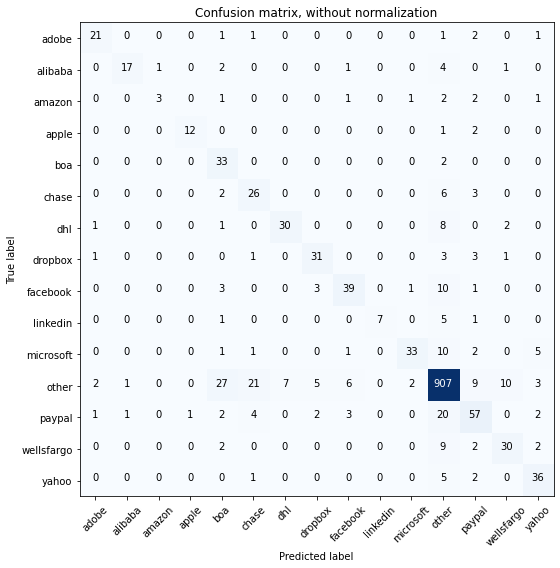

Acc     =  0.833
Pre     =  0.849
Rec     =  0.833
F1      =  0.835

Bal_Acc =  0.697
Bal_Pre =  0.766
Bal_Rec =  0.697
Bal_F1  =  0.73

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.89      0.65      0.76        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.43      0.94      0.59        35
       chase       0.47      0.70      0.57        37
         dhl       0.81      0.71      0.76        42
     dropbox       0.76      0.78      0.77        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.91      0.91      1000
      paypal       0.66      0.61      0.64        93
  wellsfargo       0.68      0.67      0.67        45
       yahoo       0.72      0.82      0.77        4

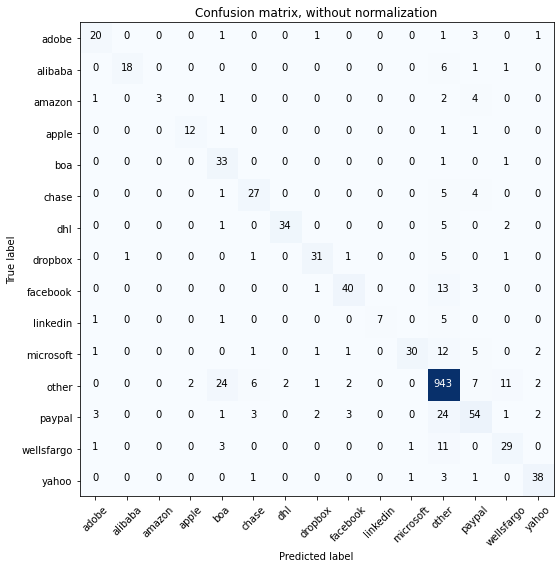

Acc     =  0.857
Pre     =  0.866
Rec     =  0.857
F1      =  0.855

Bal_Acc =  0.704
Bal_Pre =  0.822
Bal_Rec =  0.704
Bal_F1  =  0.758

              precision    recall  f1-score   support

       adobe       0.74      0.74      0.74        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.49      0.94      0.65        35
       chase       0.69      0.73      0.71        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.94      0.93      1000
      paypal       0.65      0.58      0.61        93
  wellsfargo       0.63      0.64      0.64        45
       yahoo       0.84      0.86      0.85        

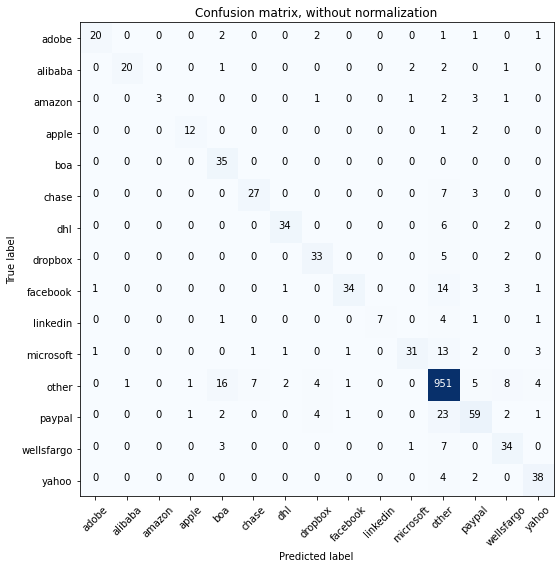

Acc     =  0.869
Pre     =  0.876
Rec     =  0.869
F1      =  0.866

Bal_Acc =  0.722
Bal_Pre =  0.839
Bal_Rec =  0.722
Bal_F1  =  0.776

              precision    recall  f1-score   support

       adobe       0.91      0.74      0.82        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.58      1.00      0.74        35
       chase       0.77      0.73      0.75        37
         dhl       0.89      0.81      0.85        42
     dropbox       0.75      0.82      0.79        40
    facebook       0.92      0.60      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.73      0.63      0.68        93
  wellsfargo       0.64      0.76      0.69        45
       yahoo       0.78      0.86      0.82        

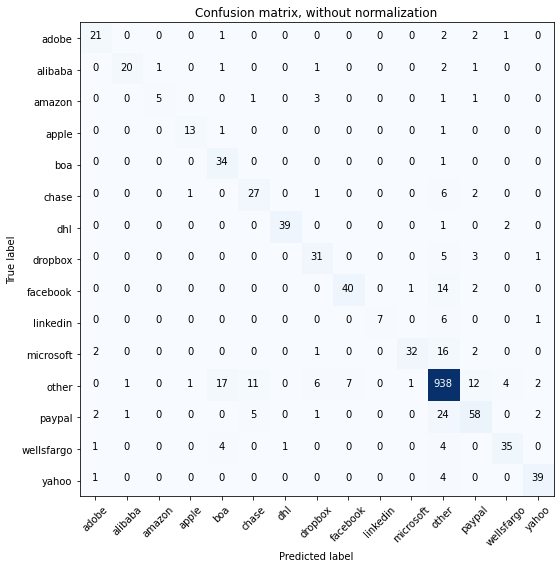

Acc     =  0.87
Pre     =  0.875
Rec     =  0.87
F1      =  0.868

Bal_Acc =  0.754
Bal_Pre =  0.825
Bal_Rec =  0.754
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.83      0.45      0.59        11
       apple       0.87      0.87      0.87        15
         boa       0.59      0.97      0.73        35
       chase       0.61      0.73      0.67        37
         dhl       0.97      0.93      0.95        42
     dropbox       0.70      0.78      0.74        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.94      0.93      1000
      paypal       0.70      0.62      0.66        93
  wellsfargo       0.83      0.78      0.80        45
       yahoo       0.87      0.89      0.88        44

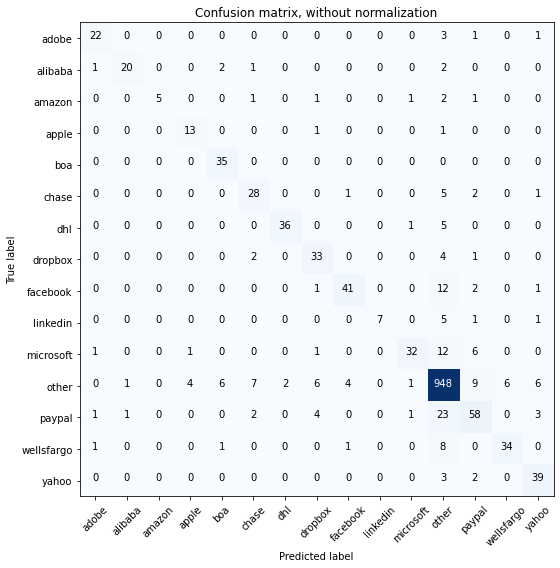

Acc     =  0.878
Pre     =  0.88
Rec     =  0.878
F1      =  0.875

Bal_Acc =  0.759
Bal_Pre =  0.839
Bal_Rec =  0.759
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.45      0.62        11
       apple       0.72      0.87      0.79        15
         boa       0.80      1.00      0.89        35
       chase       0.68      0.76      0.72        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.87      0.72      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.95      0.93      1000
      paypal       0.70      0.62      0.66        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.75      0.89      0.81        4

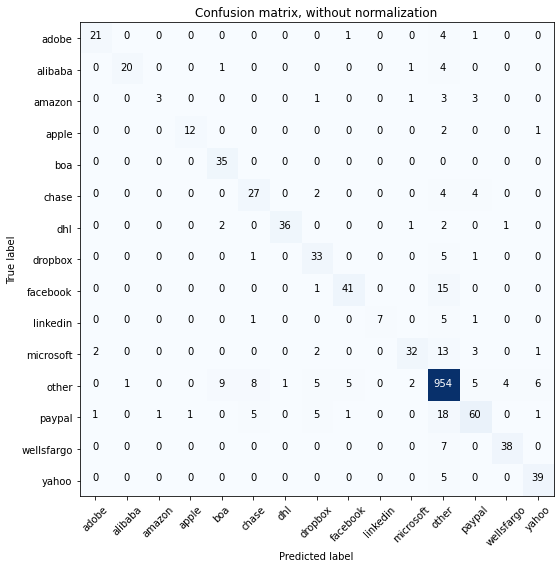

Acc     =  0.882
Pre     =  0.884
Rec     =  0.882
F1      =  0.879

Bal_Acc =  0.746
Bal_Pre =  0.842
Bal_Rec =  0.746
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.74      1.00      0.85        35
       chase       0.64      0.73      0.68        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.67      0.82      0.74        40
    facebook       0.85      0.72      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.60      0.71        53
       other       0.92      0.95      0.93      1000
      paypal       0.77      0.65      0.70        93
  wellsfargo       0.88      0.84      0.86        45
       yahoo       0.81      0.89      0.85        

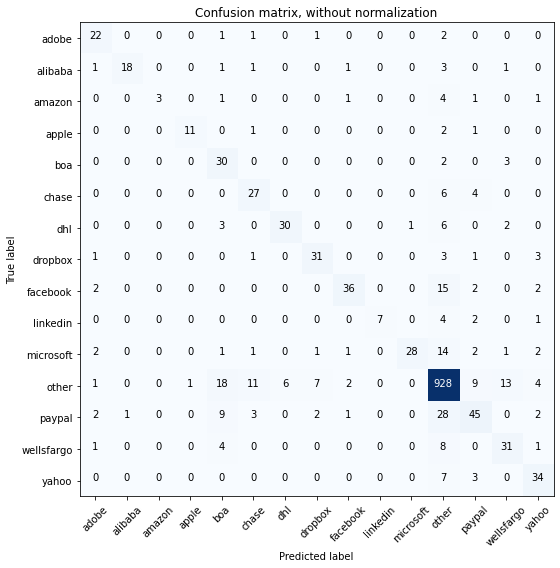

Acc     =  0.832
Pre     =  0.845
Rec     =  0.832
F1      =  0.83

Bal_Acc =  0.675
Bal_Pre =  0.787
Bal_Rec =  0.675
Bal_F1  =  0.727

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.73      0.81        15
         boa       0.44      0.86      0.58        35
       chase       0.59      0.73      0.65        37
         dhl       0.83      0.71      0.77        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.86      0.63      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.53      0.68        53
       other       0.90      0.93      0.91      1000
      paypal       0.64      0.48      0.55        93
  wellsfargo       0.61      0.69      0.65        45
       yahoo       0.68      0.77      0.72        4

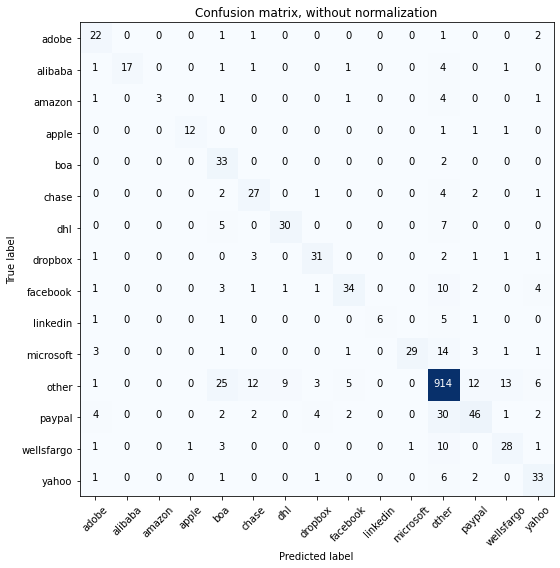

Acc     =  0.822
Pre     =  0.839
Rec     =  0.822
F1      =  0.821

Bal_Acc =  0.67
Bal_Pre =  0.77
Bal_Rec =  0.67
Bal_F1  =  0.717

              precision    recall  f1-score   support

       adobe       0.59      0.81      0.69        27
     alibaba       1.00      0.65      0.79        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.42      0.94      0.58        35
       chase       0.57      0.73      0.64        37
         dhl       0.75      0.71      0.73        42
     dropbox       0.76      0.78      0.77        40
    facebook       0.77      0.60      0.67        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.97      0.55      0.70        53
       other       0.90      0.91      0.91      1000
      paypal       0.66      0.49      0.56        93
  wellsfargo       0.61      0.62      0.62        45
       yahoo       0.63      0.75      0.69        44


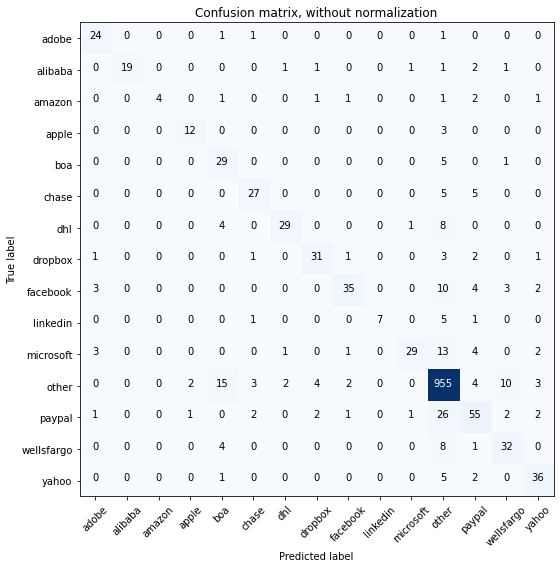

Acc     =  0.86
Pre     =  0.865
Rec     =  0.86
F1      =  0.857

Bal_Acc =  0.703
Bal_Pre =  0.819
Bal_Rec =  0.703
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.75      0.89      0.81        27
     alibaba       1.00      0.73      0.84        26
      amazon       1.00      0.36      0.53        11
       apple       0.80      0.80      0.80        15
         boa       0.53      0.83      0.64        35
       chase       0.77      0.73      0.75        37
         dhl       0.88      0.69      0.77        42
     dropbox       0.79      0.78      0.78        40
    facebook       0.85      0.61      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.91      0.95      0.93      1000
      paypal       0.67      0.59      0.63        93
  wellsfargo       0.65      0.71      0.68        45
       yahoo       0.77      0.82      0.79        44

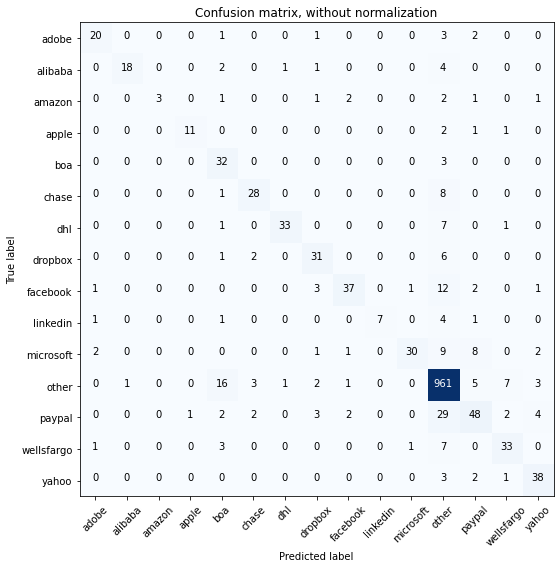

Acc     =  0.864
Pre     =  0.869
Rec     =  0.864
F1      =  0.859

Bal_Acc =  0.697
Bal_Pre =  0.837
Bal_Rec =  0.697
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.80      0.74      0.77        27
     alibaba       0.95      0.69      0.80        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.73      0.81        15
         boa       0.52      0.91      0.67        35
       chase       0.80      0.76      0.78        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.86      0.65      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.96      0.93      1000
      paypal       0.69      0.52      0.59        93
  wellsfargo       0.73      0.73      0.73        45
       yahoo       0.78      0.86      0.82        

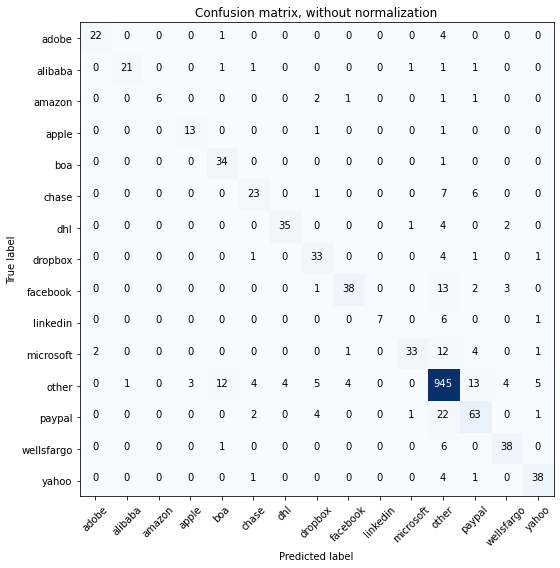

Acc     =  0.877
Pre     =  0.879
Rec     =  0.877
F1      =  0.874

Bal_Acc =  0.76
Bal_Pre =  0.846
Bal_Rec =  0.76
Bal_F1  =  0.801

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.95      0.81      0.88        26
      amazon       1.00      0.55      0.71        11
       apple       0.81      0.87      0.84        15
         boa       0.69      0.97      0.81        35
       chase       0.72      0.62      0.67        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.70      0.82      0.76        40
    facebook       0.86      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.94      0.93      1000
      paypal       0.68      0.68      0.68        93
  wellsfargo       0.81      0.84      0.83        45
       yahoo       0.81      0.86      0.84        44

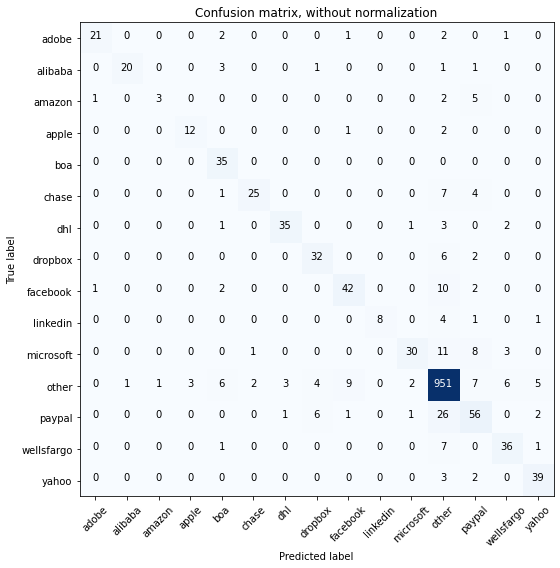

Acc     =  0.874
Pre     =  0.875
Rec     =  0.874
F1      =  0.87

Bal_Acc =  0.736
Bal_Pre =  0.828
Bal_Rec =  0.736
Bal_F1  =  0.779

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.69      1.00      0.81        35
       chase       0.89      0.68      0.77        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.78      0.74      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.95      0.93      1000
      paypal       0.64      0.60      0.62        93
  wellsfargo       0.75      0.80      0.77        45
       yahoo       0.81      0.89      0.85        4

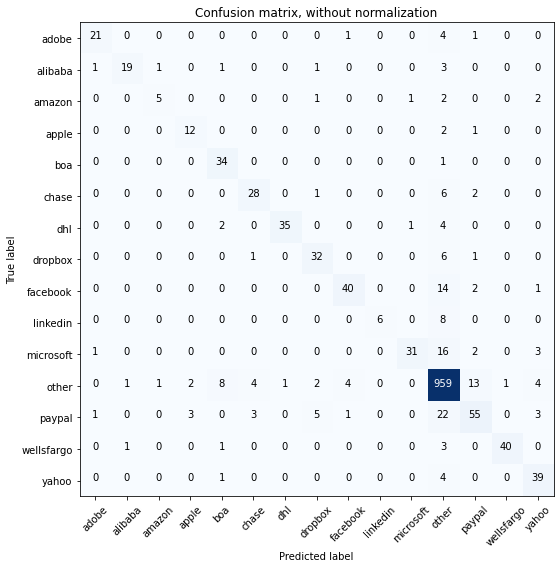

Acc     =  0.881
Pre     =  0.882
Rec     =  0.881
F1      =  0.877

Bal_Acc =  0.744
Bal_Pre =  0.84
Bal_Rec =  0.744
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.71      0.45      0.56        11
       apple       0.71      0.80      0.75        15
         boa       0.72      0.97      0.83        35
       chase       0.78      0.76      0.77        37
         dhl       0.97      0.83      0.90        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.58      0.72        53
       other       0.91      0.96      0.93      1000
      paypal       0.71      0.59      0.65        93
  wellsfargo       0.98      0.89      0.93        45
       yahoo       0.75      0.89      0.81        4

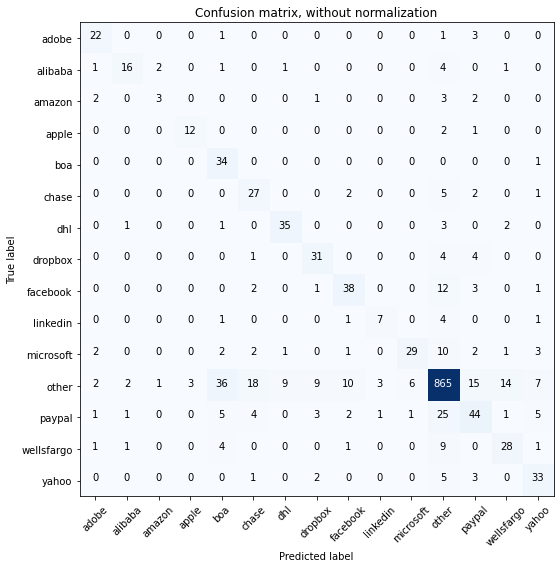

Acc     =  0.795
Pre     =  0.814
Rec     =  0.795
F1      =  0.799

Bal_Acc =  0.682
Bal_Pre =  0.66
Bal_Rec =  0.682
Bal_F1  =  0.671

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.76      0.62      0.68        26
      amazon       0.50      0.27      0.35        11
       apple       0.80      0.80      0.80        15
         boa       0.40      0.97      0.57        35
       chase       0.49      0.73      0.59        37
         dhl       0.76      0.83      0.80        42
     dropbox       0.66      0.78      0.71        40
    facebook       0.69      0.67      0.68        57
    linkedin       0.64      0.50      0.56        14
   microsoft       0.81      0.55      0.65        53
       other       0.91      0.86      0.89      1000
      paypal       0.56      0.47      0.51        93
  wellsfargo       0.60      0.62      0.61        45
       yahoo       0.62      0.75      0.68        4

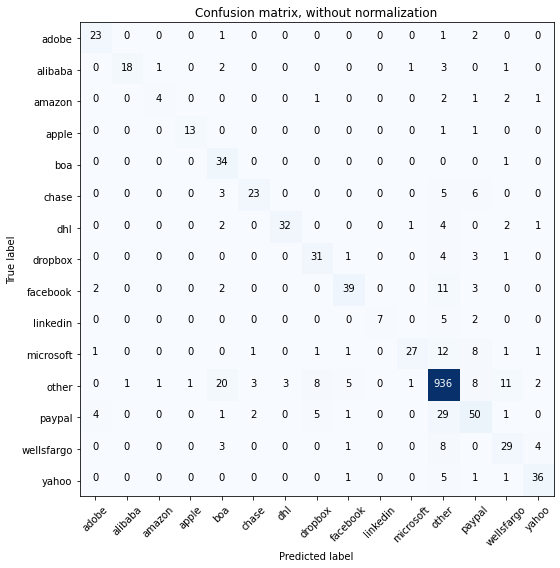

Acc     =  0.846
Pre     =  0.854
Rec     =  0.846
F1      =  0.844

Bal_Acc =  0.702
Bal_Pre =  0.784
Bal_Rec =  0.702
Bal_F1  =  0.741

              precision    recall  f1-score   support

       adobe       0.77      0.85      0.81        27
     alibaba       0.95      0.69      0.80        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.50      0.97      0.66        35
       chase       0.79      0.62      0.70        37
         dhl       0.91      0.76      0.83        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.51      0.65        53
       other       0.91      0.94      0.92      1000
      paypal       0.59      0.54      0.56        93
  wellsfargo       0.58      0.64      0.61        45
       yahoo       0.80      0.82      0.81        

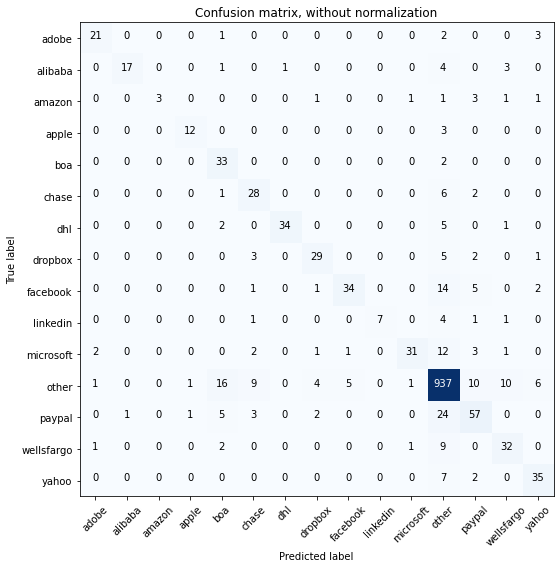

Acc     =  0.851
Pre     =  0.86
Rec     =  0.851
F1      =  0.849

Bal_Acc =  0.698
Bal_Pre =  0.816
Bal_Rec =  0.698
Bal_F1  =  0.752

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.94      0.65      0.77        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.54      0.94      0.69        35
       chase       0.60      0.76      0.67        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.76      0.72      0.74        40
    facebook       0.85      0.60      0.70        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.94      0.92      1000
      paypal       0.67      0.61      0.64        93
  wellsfargo       0.65      0.71      0.68        45
       yahoo       0.73      0.80      0.76        4

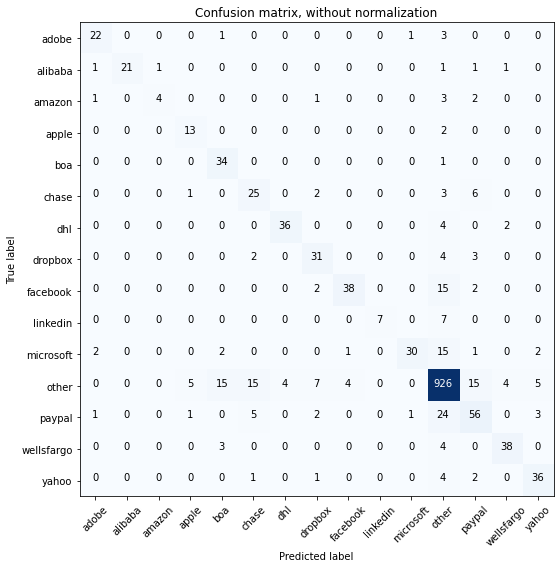

Acc     =  0.856
Pre     =  0.864
Rec     =  0.856
F1      =  0.855

Bal_Acc =  0.737
Bal_Pre =  0.798
Bal_Rec =  0.737
Bal_F1  =  0.766

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.80      0.36      0.50        11
       apple       0.65      0.87      0.74        15
         boa       0.62      0.97      0.76        35
       chase       0.52      0.68      0.59        37
         dhl       0.90      0.86      0.88        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.93      0.92      1000
      paypal       0.64      0.60      0.62        93
  wellsfargo       0.84      0.84      0.84        45
       yahoo       0.78      0.82      0.80        

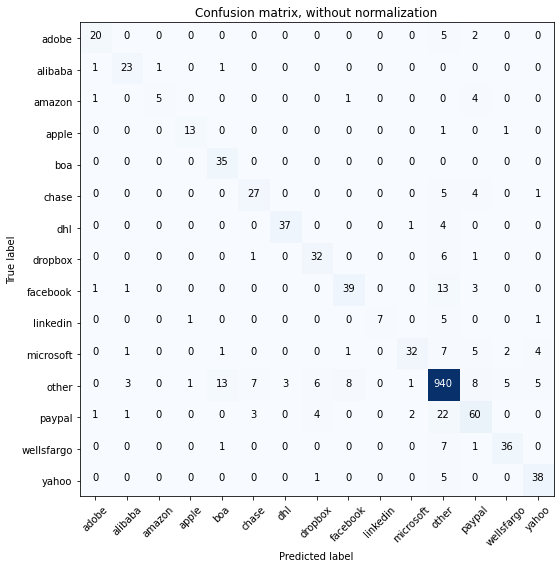

Acc     =  0.873
Pre     =  0.875
Rec     =  0.873
F1      =  0.871

Bal_Acc =  0.76
Bal_Pre =  0.818
Bal_Rec =  0.76
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.83      0.74      0.78        27
     alibaba       0.79      0.88      0.84        26
      amazon       0.83      0.45      0.59        11
       apple       0.87      0.87      0.87        15
         boa       0.69      1.00      0.81        35
       chase       0.71      0.73      0.72        37
         dhl       0.93      0.88      0.90        42
     dropbox       0.74      0.80      0.77        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.92      0.94      0.93      1000
      paypal       0.68      0.65      0.66        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.78      0.86      0.82        44

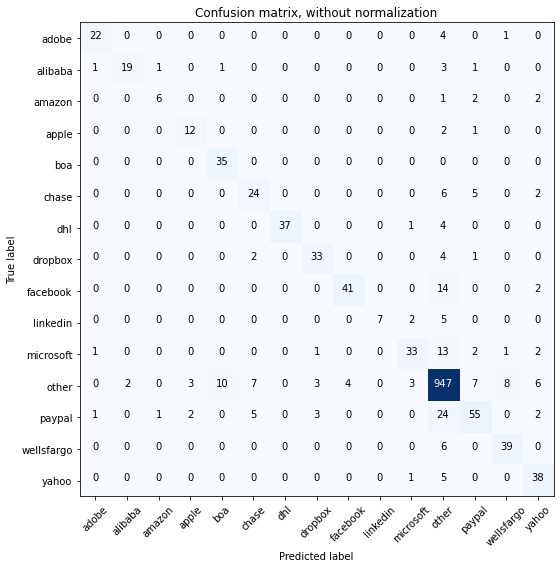

Acc     =  0.876
Pre     =  0.877
Rec     =  0.876
F1      =  0.873

Bal_Acc =  0.757
Bal_Pre =  0.823
Bal_Rec =  0.757
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.75      0.55      0.63        11
       apple       0.71      0.80      0.75        15
         boa       0.76      1.00      0.86        35
       chase       0.63      0.65      0.64        37
         dhl       1.00      0.88      0.94        42
     dropbox       0.82      0.82      0.82        40
    facebook       0.91      0.72      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.62      0.71        53
       other       0.91      0.95      0.93      1000
      paypal       0.74      0.59      0.66        93
  wellsfargo       0.80      0.87      0.83        45
       yahoo       0.70      0.86      0.78        

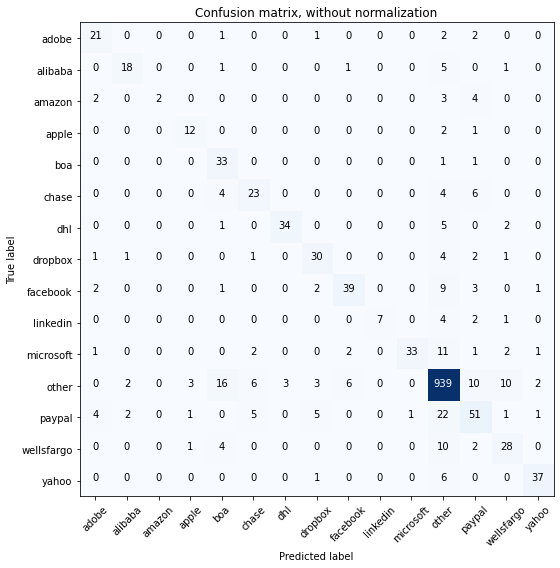

Acc     =  0.849
Pre     =  0.856
Rec     =  0.849
F1      =  0.847

Bal_Acc =  0.689
Bal_Pre =  0.783
Bal_Rec =  0.689
Bal_F1  =  0.733

              precision    recall  f1-score   support

       adobe       0.68      0.78      0.72        27
     alibaba       0.78      0.69      0.73        26
      amazon       1.00      0.18      0.31        11
       apple       0.71      0.80      0.75        15
         boa       0.54      0.94      0.69        35
       chase       0.62      0.62      0.62        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.71      0.75      0.73        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.62      0.76        53
       other       0.91      0.94      0.93      1000
      paypal       0.60      0.55      0.57        93
  wellsfargo       0.61      0.62      0.62        45
       yahoo       0.88      0.84      0.86        

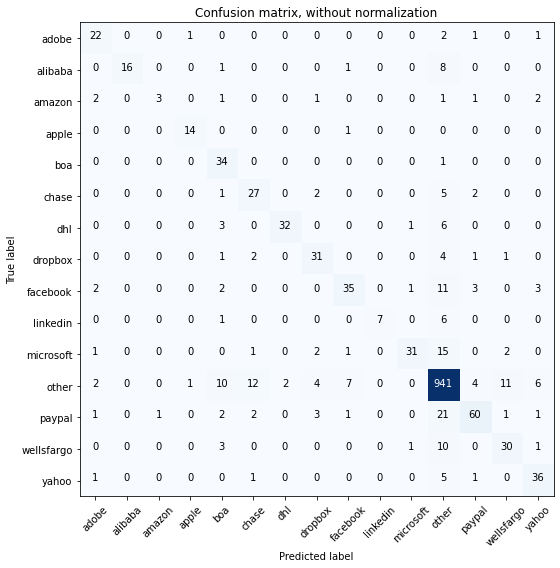

Acc     =  0.857
Pre     =  0.864
Rec     =  0.857
F1      =  0.854

Bal_Acc =  0.71
Bal_Pre =  0.798
Bal_Rec =  0.71
Bal_F1  =  0.751

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       1.00      0.62      0.76        26
      amazon       0.75      0.27      0.40        11
       apple       0.88      0.93      0.90        15
         boa       0.58      0.97      0.72        35
       chase       0.60      0.73      0.66        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.76      0.61      0.68        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.94      0.92      1000
      paypal       0.82      0.65      0.72        93
  wellsfargo       0.67      0.67      0.67        45
       yahoo       0.72      0.82      0.77        44

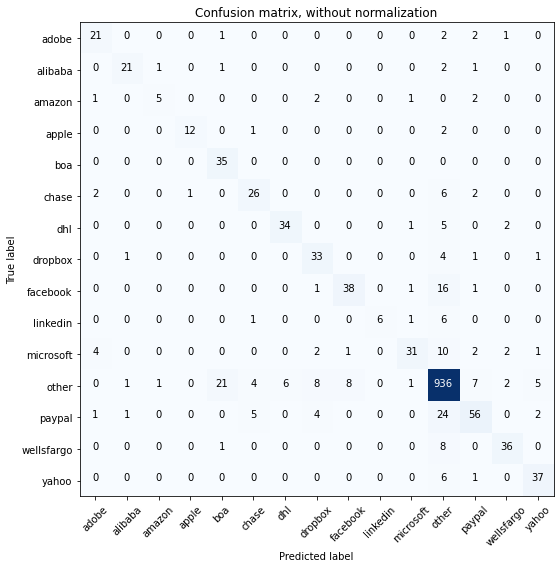

Acc     =  0.862
Pre     =  0.866
Rec     =  0.862
F1      =  0.86

Bal_Acc =  0.736
Bal_Pre =  0.801
Bal_Rec =  0.736
Bal_F1  =  0.767

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.71      0.45      0.56        11
       apple       0.92      0.80      0.86        15
         boa       0.59      1.00      0.74        35
       chase       0.70      0.70      0.70        37
         dhl       0.85      0.81      0.83        42
     dropbox       0.66      0.82      0.73        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.86      0.58      0.70        53
       other       0.91      0.94      0.92      1000
      paypal       0.75      0.60      0.67        93
  wellsfargo       0.84      0.80      0.82        45
       yahoo       0.80      0.84      0.82        4

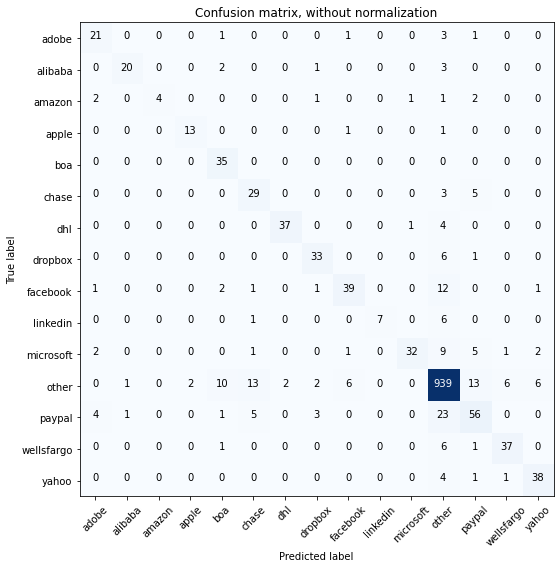

Acc     =  0.871
Pre     =  0.876
Rec     =  0.871
F1      =  0.869

Bal_Acc =  0.752
Bal_Pre =  0.83
Bal_Rec =  0.752
Bal_F1  =  0.789

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       0.91      0.77      0.83        26
      amazon       1.00      0.36      0.53        11
       apple       0.87      0.87      0.87        15
         boa       0.67      1.00      0.80        35
       chase       0.58      0.78      0.67        37
         dhl       0.95      0.88      0.91        42
     dropbox       0.80      0.82      0.81        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.94      0.93      1000
      paypal       0.66      0.60      0.63        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.81      0.86      0.84        4

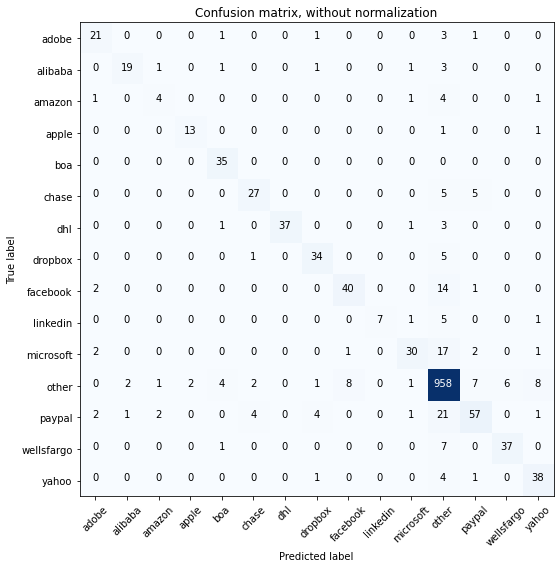

Acc     =  0.882
Pre     =  0.88
Rec     =  0.882
F1      =  0.877

Bal_Acc =  0.748
Bal_Pre =  0.822
Bal_Rec =  0.748
Bal_F1  =  0.783

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.86      0.73      0.79        26
      amazon       0.50      0.36      0.42        11
       apple       0.87      0.87      0.87        15
         boa       0.81      1.00      0.90        35
       chase       0.79      0.73      0.76        37
         dhl       1.00      0.88      0.94        42
     dropbox       0.81      0.85      0.83        40
    facebook       0.82      0.70      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.83      0.57      0.67        53
       other       0.91      0.96      0.93      1000
      paypal       0.77      0.61      0.68        93
  wellsfargo       0.86      0.82      0.84        45
       yahoo       0.75      0.86      0.80        4

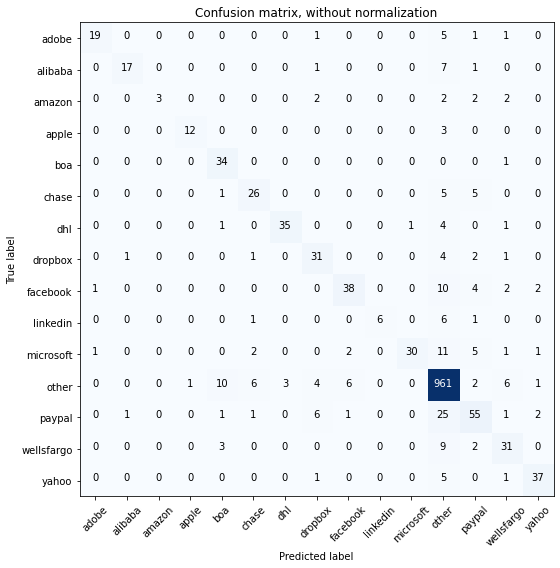

Acc     =  0.867
Pre     =  0.87
Rec     =  0.867
F1      =  0.862

Bal_Acc =  0.697
Bal_Pre =  0.839
Bal_Rec =  0.697
Bal_F1  =  0.761

              precision    recall  f1-score   support

       adobe       0.90      0.70      0.79        27
     alibaba       0.89      0.65      0.76        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.68      0.97      0.80        35
       chase       0.70      0.70      0.70        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.67      0.78      0.72        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.97      0.57      0.71        53
       other       0.91      0.96      0.93      1000
      paypal       0.69      0.59      0.64        93
  wellsfargo       0.65      0.69      0.67        45
       yahoo       0.86      0.84      0.85        4

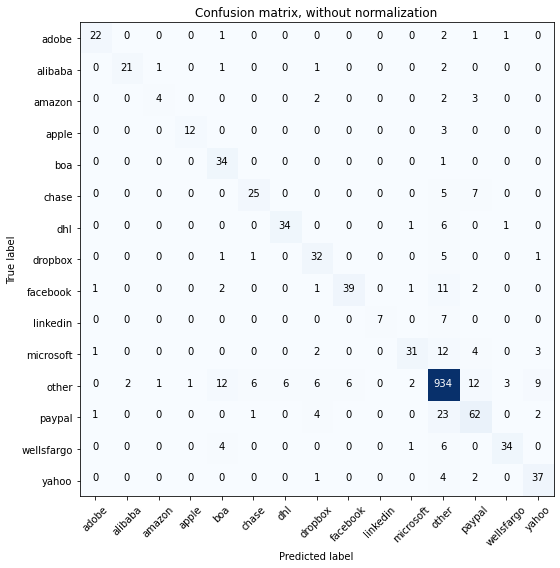

Acc     =  0.863
Pre     =  0.867
Rec     =  0.863
F1      =  0.861

Bal_Acc =  0.734
Bal_Pre =  0.81
Bal_Rec =  0.734
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       0.92      0.80      0.86        15
         boa       0.62      0.97      0.76        35
       chase       0.76      0.68      0.71        37
         dhl       0.85      0.81      0.83        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.91      0.93      0.92      1000
      paypal       0.67      0.67      0.67        93
  wellsfargo       0.87      0.76      0.81        45
       yahoo       0.71      0.84      0.77        44

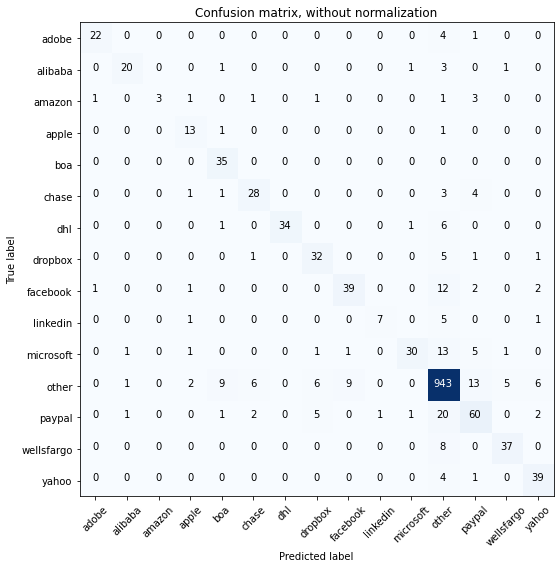

Acc     =  0.872
Pre     =  0.876
Rec     =  0.872
F1      =  0.869

Bal_Acc =  0.742
Bal_Pre =  0.825
Bal_Rec =  0.742
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       0.87      0.77      0.82        26
      amazon       1.00      0.27      0.43        11
       apple       0.65      0.87      0.74        15
         boa       0.71      1.00      0.83        35
       chase       0.74      0.76      0.75        37
         dhl       1.00      0.81      0.89        42
     dropbox       0.71      0.80      0.75        40
    facebook       0.80      0.68      0.74        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.91      0.57      0.70        53
       other       0.92      0.94      0.93      1000
      paypal       0.67      0.65      0.66        93
  wellsfargo       0.84      0.82      0.83        45
       yahoo       0.76      0.89      0.82        

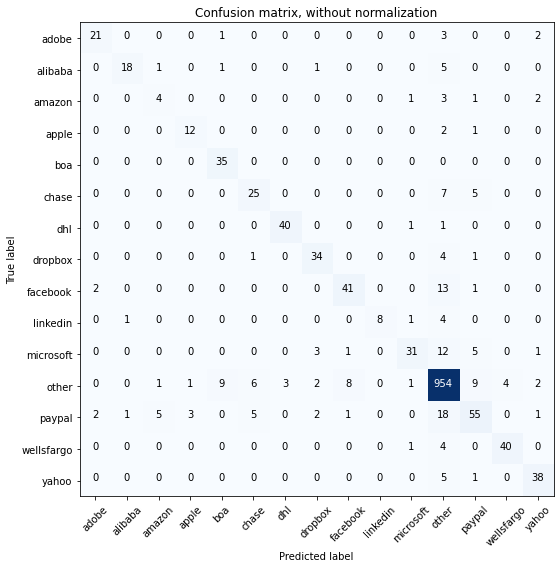

Acc     =  0.881
Pre     =  0.88
Rec     =  0.881
F1      =  0.878

Bal_Acc =  0.752
Bal_Pre =  0.803
Bal_Rec =  0.752
Bal_F1  =  0.777

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.90      0.69      0.78        26
      amazon       0.36      0.36      0.36        11
       apple       0.75      0.80      0.77        15
         boa       0.76      1.00      0.86        35
       chase       0.68      0.68      0.68        37
         dhl       0.93      0.95      0.94        42
     dropbox       0.81      0.85      0.83        40
    facebook       0.80      0.72      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.58      0.70        53
       other       0.92      0.95      0.94      1000
      paypal       0.70      0.59      0.64        93
  wellsfargo       0.91      0.89      0.90        45
       yahoo       0.83      0.86      0.84        4

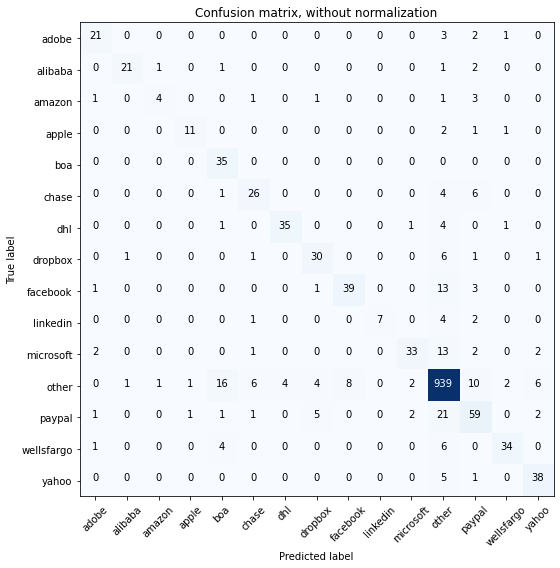

Acc     =  0.865
Pre     =  0.869
Rec     =  0.865
F1      =  0.864

Bal_Acc =  0.731
Bal_Pre =  0.802
Bal_Rec =  0.731
Bal_F1  =  0.765

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       0.85      0.73      0.79        15
         boa       0.59      1.00      0.74        35
       chase       0.70      0.70      0.70        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.73      0.75      0.74        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.64      0.63      0.64        93
  wellsfargo       0.87      0.76      0.81        45
       yahoo       0.78      0.86      0.82        

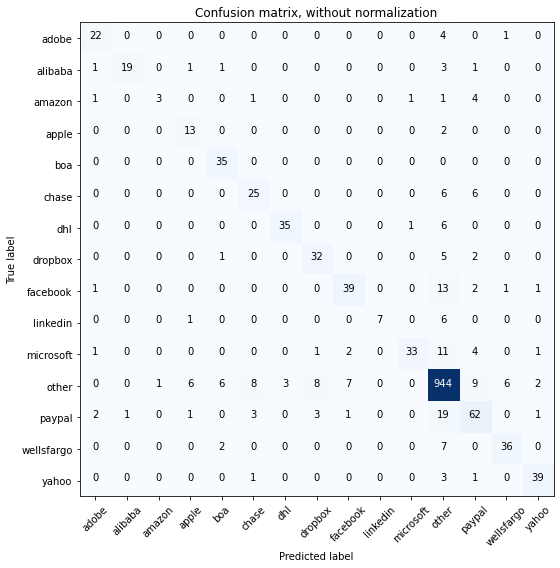

Acc     =  0.873
Pre     =  0.875
Rec     =  0.873
F1      =  0.87

Bal_Acc =  0.74
Bal_Pre =  0.813
Bal_Rec =  0.74
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.59      0.87      0.70        15
         boa       0.78      1.00      0.88        35
       chase       0.66      0.68      0.67        37
         dhl       0.92      0.83      0.88        42
     dropbox       0.73      0.80      0.76        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.62      0.75        53
       other       0.92      0.94      0.93      1000
      paypal       0.68      0.67      0.67        93
  wellsfargo       0.82      0.80      0.81        45
       yahoo       0.89      0.89      0.89        44


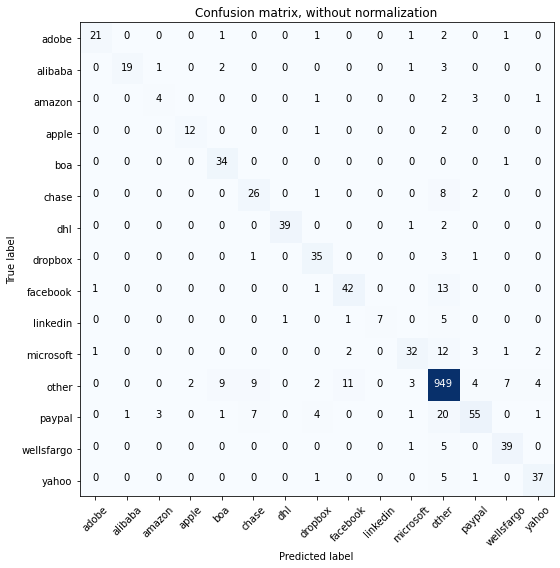

Acc     =  0.878
Pre     =  0.878
Rec     =  0.878
F1      =  0.875

Bal_Acc =  0.749
Bal_Pre =  0.81
Bal_Rec =  0.749
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.50      0.36      0.42        11
       apple       0.86      0.80      0.83        15
         boa       0.72      0.97      0.83        35
       chase       0.60      0.70      0.65        37
         dhl       0.97      0.93      0.95        42
     dropbox       0.74      0.88      0.80        40
    facebook       0.75      0.74      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.80      0.60      0.69        53
       other       0.92      0.95      0.93      1000
      paypal       0.80      0.59      0.68        93
  wellsfargo       0.80      0.87      0.83        45
       yahoo       0.82      0.84      0.83        4

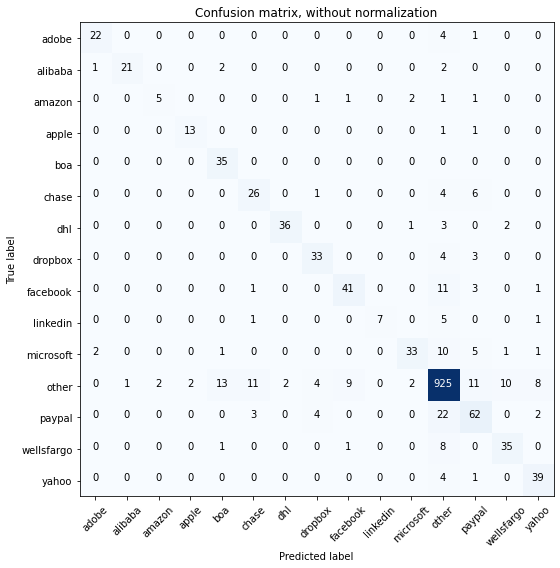

Acc     =  0.866
Pre     =  0.871
Rec     =  0.866
F1      =  0.865

Bal_Acc =  0.762
Bal_Pre =  0.809
Bal_Rec =  0.762
Bal_F1  =  0.785

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.71      0.45      0.56        11
       apple       0.87      0.87      0.87        15
         boa       0.67      1.00      0.80        35
       chase       0.62      0.70      0.66        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.79      0.72      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.93      0.92      1000
      paypal       0.66      0.67      0.66        93
  wellsfargo       0.73      0.78      0.75        45
       yahoo       0.75      0.89      0.81        

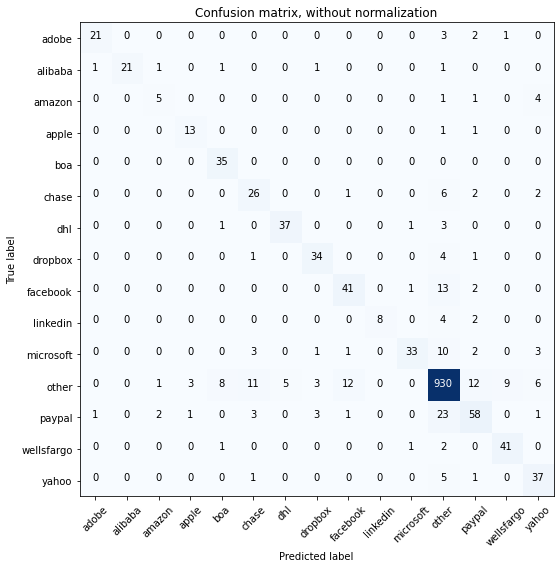

Acc     =  0.871
Pre     =  0.874
Rec     =  0.871
F1      =  0.87

Bal_Acc =  0.771
Bal_Pre =  0.802
Bal_Rec =  0.771
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.56      0.45      0.50        11
       apple       0.76      0.87      0.81        15
         boa       0.76      1.00      0.86        35
       chase       0.58      0.70      0.63        37
         dhl       0.88      0.88      0.88        42
     dropbox       0.81      0.85      0.83        40
    facebook       0.73      0.72      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.62      0.74        53
       other       0.92      0.93      0.93      1000
      paypal       0.69      0.62      0.66        93
  wellsfargo       0.80      0.91      0.85        45
       yahoo       0.70      0.84      0.76        4

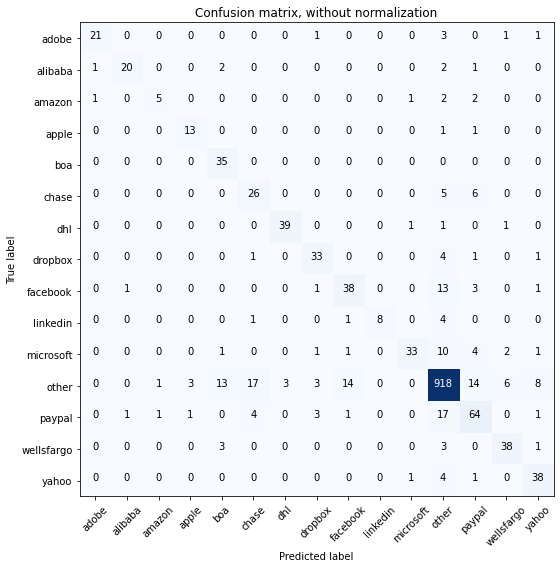

Acc     =  0.864
Pre     =  0.872
Rec     =  0.864
F1      =  0.864

Bal_Acc =  0.767
Bal_Pre =  0.794
Bal_Rec =  0.767
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.91      0.78      0.84        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.71      0.45      0.56        11
       apple       0.76      0.87      0.81        15
         boa       0.65      1.00      0.79        35
       chase       0.53      0.70      0.60        37
         dhl       0.93      0.93      0.93        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.69      0.67      0.68        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.92      0.62      0.74        53
       other       0.93      0.92      0.92      1000
      paypal       0.66      0.69      0.67        93
  wellsfargo       0.79      0.84      0.82        45
       yahoo       0.73      0.86      0.79        4

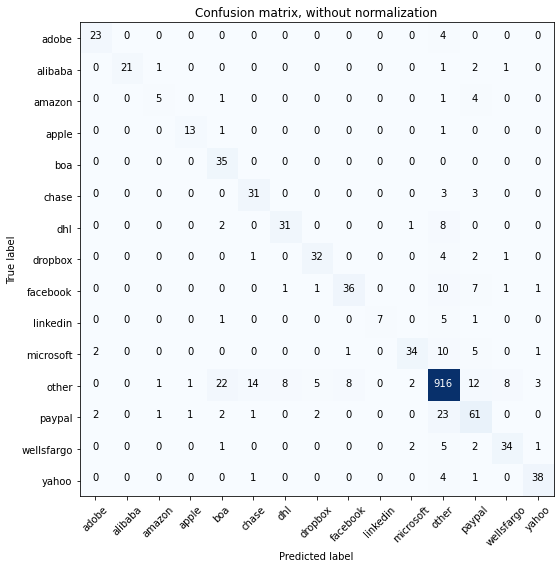

Acc     =  0.856
Pre     =  0.865
Rec     =  0.856
F1      =  0.856

Bal_Acc =  0.755
Bal_Pre =  0.795
Bal_Rec =  0.755
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.85      0.85      0.85        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.62      0.45      0.53        11
       apple       0.87      0.87      0.87        15
         boa       0.54      1.00      0.70        35
       chase       0.65      0.84      0.73        37
         dhl       0.78      0.74      0.76        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.80      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.87      0.64      0.74        53
       other       0.92      0.92      0.92      1000
      paypal       0.61      0.66      0.63        93
  wellsfargo       0.76      0.76      0.76        45
       yahoo       0.86      0.86      0.86        

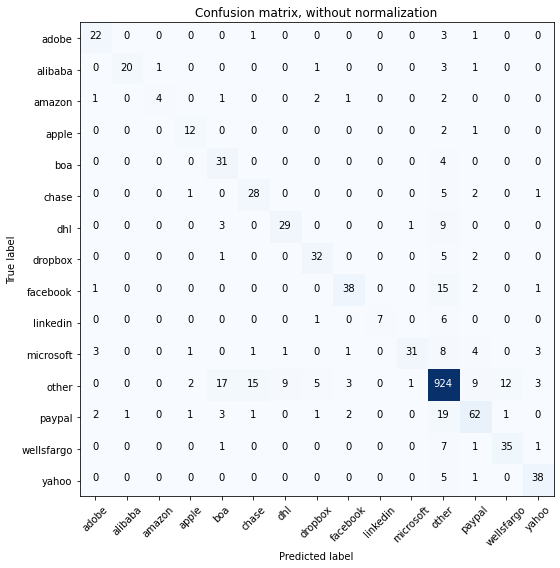

Acc     =  0.853
Pre     =  0.86
Rec     =  0.853
F1      =  0.852

Bal_Acc =  0.724
Bal_Pre =  0.788
Bal_Rec =  0.724
Bal_F1  =  0.755

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.80      0.36      0.50        11
       apple       0.71      0.80      0.75        15
         boa       0.54      0.89      0.67        35
       chase       0.61      0.76      0.67        37
         dhl       0.74      0.69      0.72        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.58      0.72        53
       other       0.91      0.92      0.92      1000
      paypal       0.72      0.67      0.69        93
  wellsfargo       0.73      0.78      0.75        45
       yahoo       0.81      0.86      0.84        4

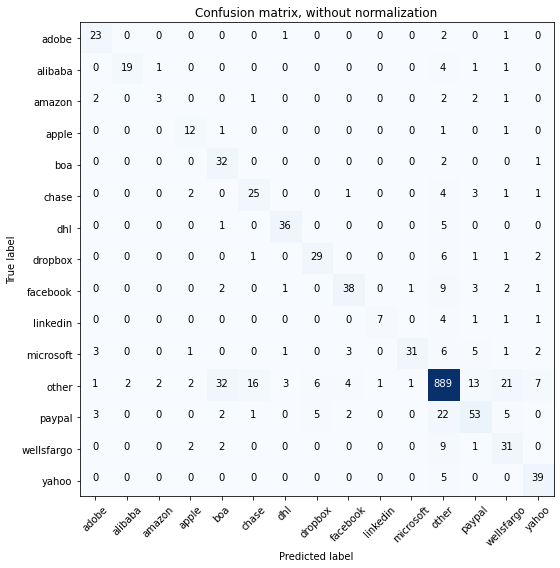

Acc     =  0.823
Pre     =  0.842
Rec     =  0.823
F1      =  0.827

Bal_Acc =  0.708
Bal_Pre =  0.713
Bal_Rec =  0.708
Bal_F1  =  0.71

              precision    recall  f1-score   support

       adobe       0.72      0.85      0.78        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.50      0.27      0.35        11
       apple       0.63      0.80      0.71        15
         boa       0.44      0.91      0.60        35
       chase       0.57      0.68      0.62        37
         dhl       0.86      0.86      0.86        42
     dropbox       0.72      0.72      0.73        40
    facebook       0.79      0.67      0.72        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.94      0.58      0.72        53
       other       0.92      0.89      0.90      1000
      paypal       0.64      0.57      0.60        93
  wellsfargo       0.46      0.69      0.55        45
       yahoo       0.72      0.89      0.80        4

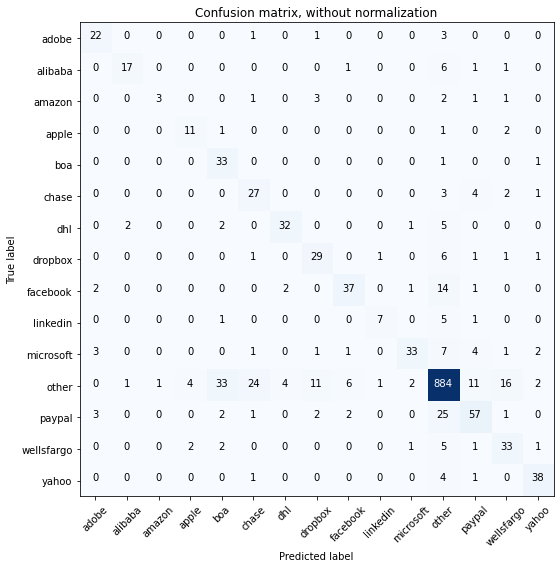

Acc     =  0.821
Pre     =  0.839
Rec     =  0.821
F1      =  0.824

Bal_Acc =  0.7
Bal_Pre =  0.719
Bal_Rec =  0.7
Bal_F1  =  0.709

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.85      0.65      0.74        26
      amazon       0.75      0.27      0.40        11
       apple       0.65      0.73      0.69        15
         boa       0.45      0.94      0.61        35
       chase       0.47      0.73      0.57        37
         dhl       0.84      0.76      0.80        42
     dropbox       0.62      0.72      0.67        40
    facebook       0.79      0.65      0.71        57
    linkedin       0.78      0.50      0.61        14
   microsoft       0.87      0.62      0.73        53
       other       0.91      0.88      0.90      1000
      paypal       0.69      0.61      0.65        93
  wellsfargo       0.57      0.73      0.64        45
       yahoo       0.83      0.86      0.84        44



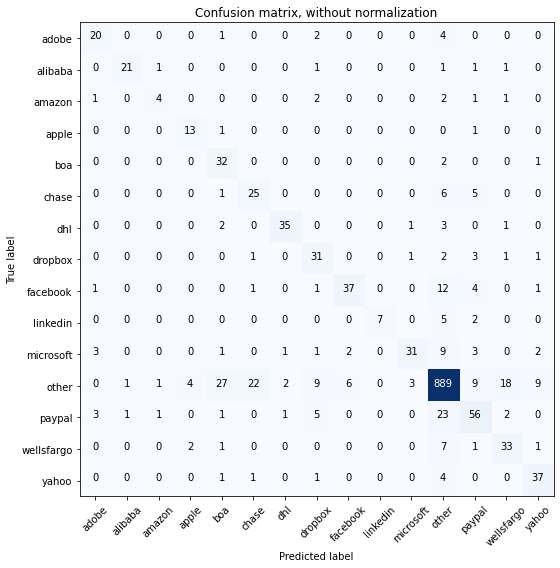

Acc     =  0.826
Pre     =  0.843
Rec     =  0.826
F1      =  0.829

Bal_Acc =  0.718
Bal_Pre =  0.725
Bal_Rec =  0.718
Bal_F1  =  0.721

              precision    recall  f1-score   support

       adobe       0.71      0.74      0.73        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.57      0.36      0.44        11
       apple       0.68      0.87      0.76        15
         boa       0.47      0.91      0.62        35
       chase       0.50      0.68      0.57        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.58      0.78      0.67        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.92      0.89      0.90      1000
      paypal       0.65      0.60      0.63        93
  wellsfargo       0.58      0.73      0.65        45
       yahoo       0.71      0.84      0.77        

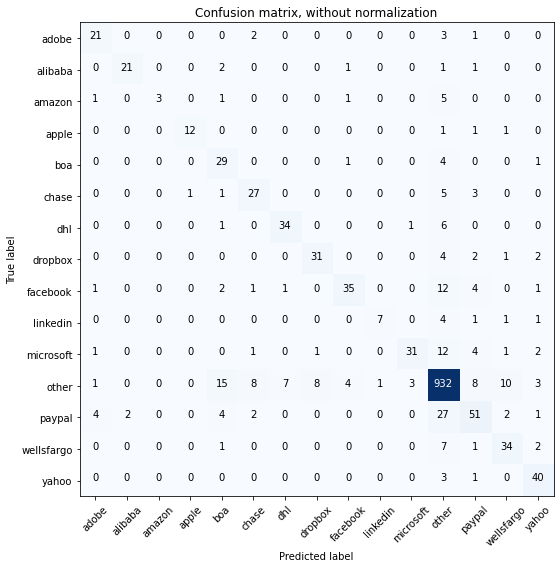

Acc     =  0.85
Pre     =  0.855
Rec     =  0.85
F1      =  0.847

Bal_Acc =  0.71
Bal_Pre =  0.794
Bal_Rec =  0.71
Bal_F1  =  0.75

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.91      0.81      0.86        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.52      0.83      0.64        35
       chase       0.66      0.73      0.69        37
         dhl       0.81      0.81      0.81        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.83      0.61      0.71        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.93      0.92      1000
      paypal       0.65      0.55      0.60        93
  wellsfargo       0.68      0.76      0.72        45
       yahoo       0.75      0.91      0.82        44

 

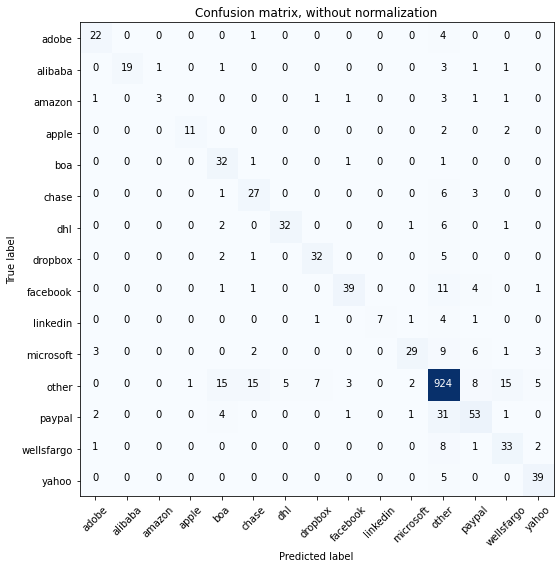

Acc     =  0.846
Pre     =  0.853
Rec     =  0.846
F1      =  0.844

Bal_Acc =  0.707
Bal_Pre =  0.791
Bal_Rec =  0.707
Bal_F1  =  0.747

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.73      0.84        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.73      0.81        15
         boa       0.55      0.91      0.69        35
       chase       0.56      0.73      0.64        37
         dhl       0.86      0.76      0.81        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.55      0.67        53
       other       0.90      0.92      0.91      1000
      paypal       0.68      0.57      0.62        93
  wellsfargo       0.60      0.73      0.66        45
       yahoo       0.78      0.89      0.83        

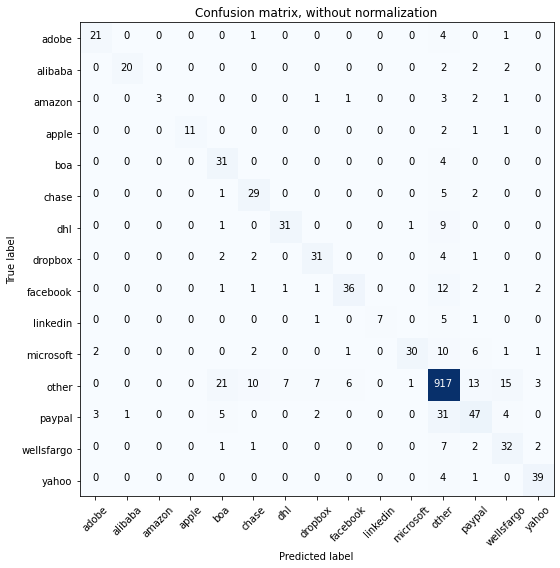

Acc     =  0.835
Pre     =  0.846
Rec     =  0.835
F1      =  0.834

Bal_Acc =  0.697
Bal_Pre =  0.802
Bal_Rec =  0.697
Bal_F1  =  0.746

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.73      0.85        15
         boa       0.49      0.89      0.63        35
       chase       0.63      0.78      0.70        37
         dhl       0.79      0.74      0.77        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.82      0.63      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.90      0.92      0.91      1000
      paypal       0.59      0.51      0.54        93
  wellsfargo       0.55      0.71      0.62        45
       yahoo       0.83      0.89      0.86        

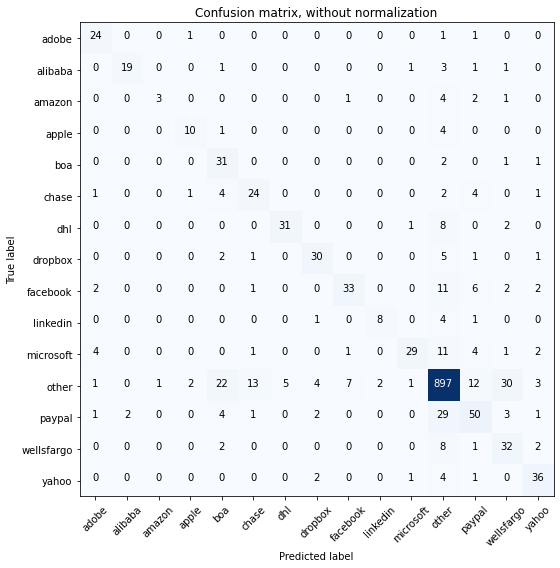

Acc     =  0.817
Pre     =  0.832
Rec     =  0.817
F1      =  0.818

Bal_Acc =  0.683
Bal_Pre =  0.727
Bal_Rec =  0.683
Bal_F1  =  0.704

              precision    recall  f1-score   support

       adobe       0.73      0.89      0.80        27
     alibaba       0.90      0.73      0.81        26
      amazon       0.75      0.27      0.40        11
       apple       0.71      0.67      0.69        15
         boa       0.46      0.89      0.61        35
       chase       0.59      0.65      0.62        37
         dhl       0.86      0.74      0.79        42
     dropbox       0.77      0.75      0.76        40
    facebook       0.79      0.58      0.67        57
    linkedin       0.80      0.57      0.67        14
   microsoft       0.88      0.55      0.67        53
       other       0.90      0.90      0.90      1000
      paypal       0.60      0.54      0.56        93
  wellsfargo       0.44      0.71      0.54        45
       yahoo       0.73      0.82      0.77        

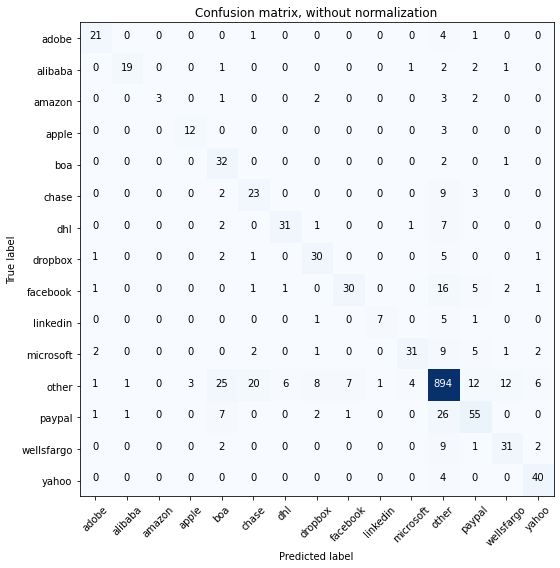

Acc     =  0.818
Pre     =  0.832
Rec     =  0.818
F1      =  0.819

Bal_Acc =  0.687
Bal_Pre =  0.755
Bal_Rec =  0.687
Bal_F1  =  0.719

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.90      0.73      0.81        26
      amazon       1.00      0.27      0.43        11
       apple       0.80      0.80      0.80        15
         boa       0.43      0.91      0.59        35
       chase       0.48      0.62      0.54        37
         dhl       0.82      0.74      0.78        42
     dropbox       0.67      0.75      0.71        40
    facebook       0.79      0.53      0.63        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.84      0.58      0.69        53
       other       0.90      0.89      0.89      1000
      paypal       0.63      0.59      0.61        93
  wellsfargo       0.65      0.69      0.67        45
       yahoo       0.77      0.91      0.83        

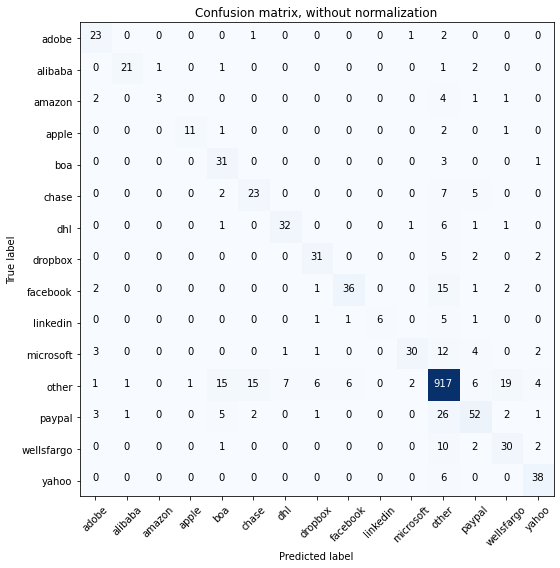

Acc     =  0.834
Pre     =  0.841
Rec     =  0.834
F1      =  0.832

Bal_Acc =  0.689
Bal_Pre =  0.767
Bal_Rec =  0.689
Bal_F1  =  0.726

              precision    recall  f1-score   support

       adobe       0.68      0.85      0.75        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.73      0.81        15
         boa       0.54      0.89      0.67        35
       chase       0.56      0.62      0.59        37
         dhl       0.80      0.76      0.78        42
     dropbox       0.76      0.78      0.77        40
    facebook       0.84      0.63      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.57      0.69        53
       other       0.90      0.92      0.91      1000
      paypal       0.68      0.56      0.61        93
  wellsfargo       0.54      0.67      0.59        45
       yahoo       0.76      0.86      0.81        

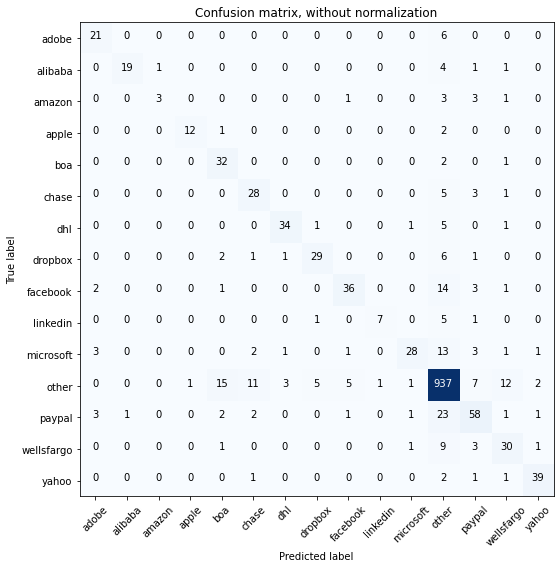

Acc     =  0.853
Pre     =  0.857
Rec     =  0.853
F1      =  0.85

Bal_Acc =  0.704
Bal_Pre =  0.792
Bal_Rec =  0.704
Bal_F1  =  0.745

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.59      0.91      0.72        35
       chase       0.62      0.76      0.68        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.81      0.72      0.76        40
    facebook       0.82      0.63      0.71        57
    linkedin       0.88      0.50      0.64        14
   microsoft       0.88      0.53      0.66        53
       other       0.90      0.94      0.92      1000
      paypal       0.69      0.62      0.66        93
  wellsfargo       0.59      0.67      0.62        45
       yahoo       0.89      0.89      0.89        4

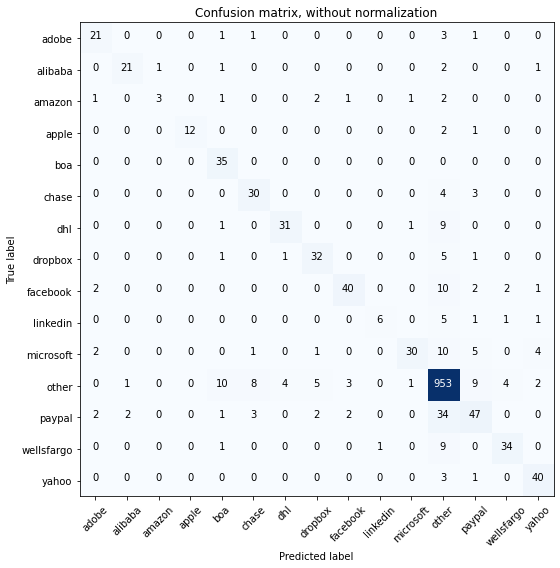

Acc     =  0.867
Pre     =  0.867
Rec     =  0.867
F1      =  0.862

Bal_Acc =  0.722
Bal_Pre =  0.815
Bal_Rec =  0.722
Bal_F1  =  0.766

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.67      1.00      0.80        35
       chase       0.70      0.81      0.75        37
         dhl       0.86      0.74      0.79        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.87      0.70      0.78        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.95      0.93      1000
      paypal       0.66      0.51      0.57        93
  wellsfargo       0.83      0.76      0.79        45
       yahoo       0.82      0.91      0.86        

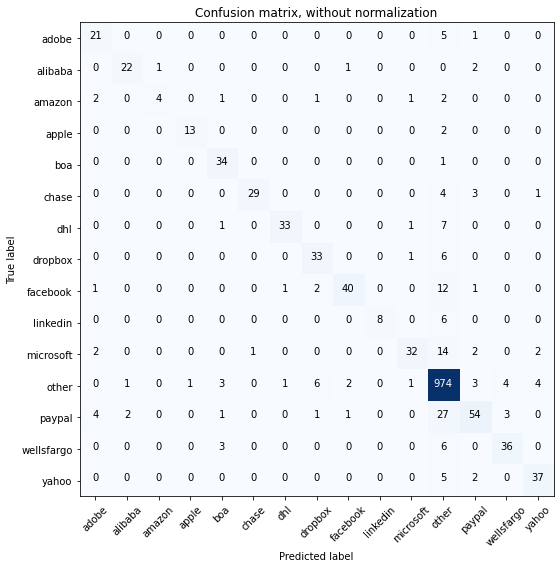

Acc     =  0.89
Pre     =  0.89
Rec     =  0.89
F1      =  0.885

Bal_Acc =  0.753
Bal_Pre =  0.864
Bal_Rec =  0.753
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.79      0.97      0.87        35
       chase       0.97      0.78      0.87        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.97      0.94      1000
      paypal       0.79      0.58      0.67        93
  wellsfargo       0.84      0.80      0.82        45
       yahoo       0.84      0.84      0.84        44


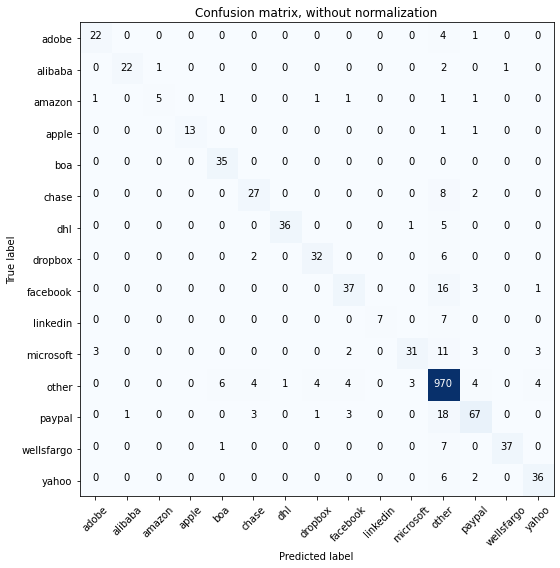

Acc     =  0.895
Pre     =  0.894
Rec     =  0.895
F1      =  0.891

Bal_Acc =  0.762
Bal_Pre =  0.879
Bal_Rec =  0.762
Bal_F1  =  0.816

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.81      1.00      0.90        35
       chase       0.75      0.73      0.74        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.84      0.80      0.82        40
    facebook       0.79      0.65      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.97      0.94      1000
      paypal       0.80      0.72      0.76        93
  wellsfargo       0.97      0.82      0.89        45
       yahoo       0.82      0.82      0.82        

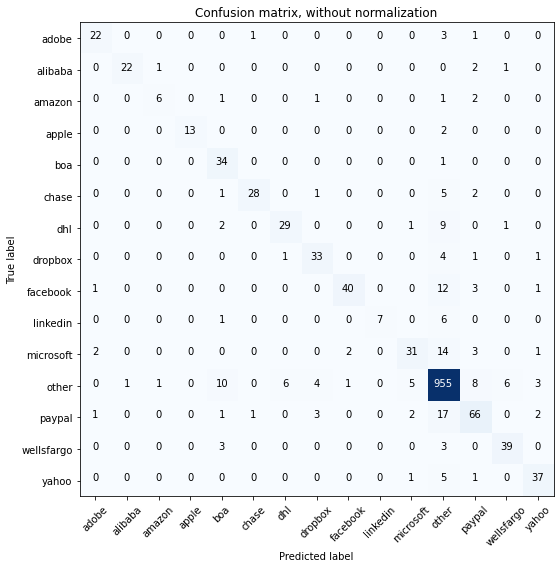

Acc     =  0.885
Pre     =  0.887
Rec     =  0.885
F1      =  0.882

Bal_Acc =  0.765
Bal_Pre =  0.849
Bal_Rec =  0.765
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.64      0.97      0.77        35
       chase       0.93      0.76      0.84        37
         dhl       0.81      0.69      0.74        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.93      0.70      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.78      0.58      0.67        53
       other       0.92      0.95      0.94      1000
      paypal       0.74      0.71      0.73        93
  wellsfargo       0.83      0.87      0.85        45
       yahoo       0.82      0.84      0.83        

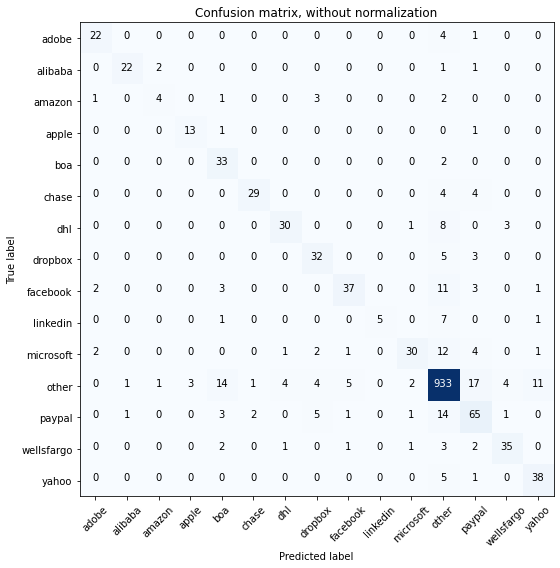

Acc     =  0.863
Pre     =  0.869
Rec     =  0.863
F1      =  0.861

Bal_Acc =  0.732
Bal_Pre =  0.794
Bal_Rec =  0.732
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.57      0.36      0.44        11
       apple       0.81      0.87      0.84        15
         boa       0.57      0.94      0.71        35
       chase       0.91      0.78      0.84        37
         dhl       0.83      0.71      0.77        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.86      0.57      0.68        53
       other       0.92      0.93      0.93      1000
      paypal       0.64      0.70      0.67        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.73      0.86      0.79        

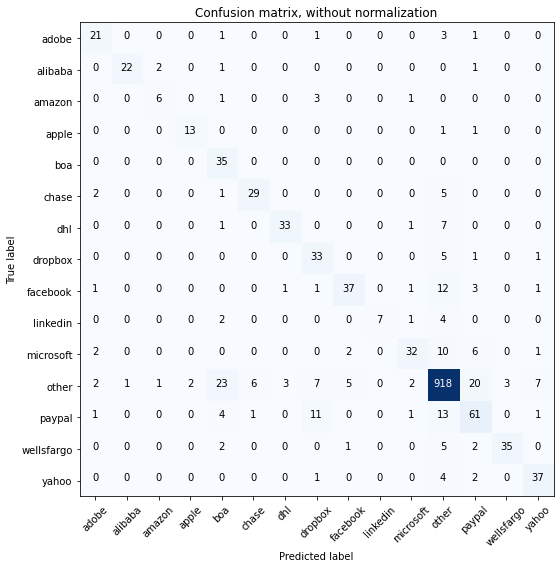

Acc     =  0.857
Pre     =  0.871
Rec     =  0.857
F1      =  0.859

Bal_Acc =  0.758
Bal_Pre =  0.791
Bal_Rec =  0.758
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.67      0.55      0.60        11
       apple       0.87      0.87      0.87        15
         boa       0.49      1.00      0.66        35
       chase       0.81      0.78      0.79        37
         dhl       0.89      0.79      0.84        42
     dropbox       0.58      0.82      0.68        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.82      0.60      0.70        53
       other       0.93      0.92      0.92      1000
      paypal       0.62      0.66      0.64        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.77      0.84      0.80        

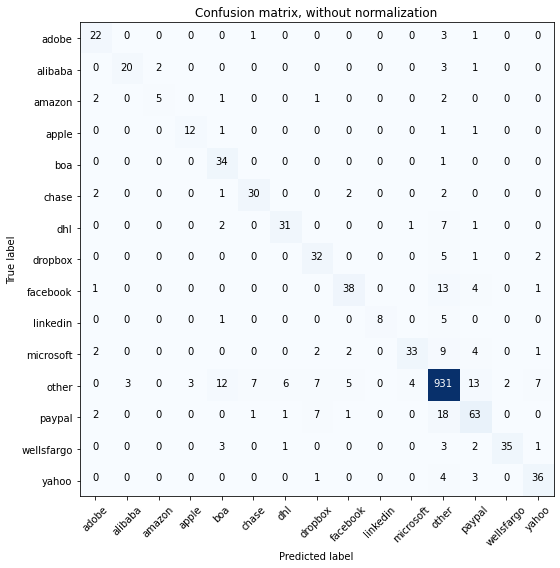

Acc     =  0.864
Pre     =  0.87
Rec     =  0.864
F1      =  0.864

Bal_Acc =  0.748
Bal_Pre =  0.791
Bal_Rec =  0.748
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.71      0.45      0.56        11
       apple       0.80      0.80      0.80        15
         boa       0.62      0.97      0.76        35
       chase       0.77      0.81      0.79        37
         dhl       0.79      0.74      0.77        42
     dropbox       0.64      0.80      0.71        40
    facebook       0.79      0.67      0.72        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.92      0.93      0.93      1000
      paypal       0.67      0.68      0.67        93
  wellsfargo       0.95      0.78      0.85        45
       yahoo       0.75      0.82      0.78        4

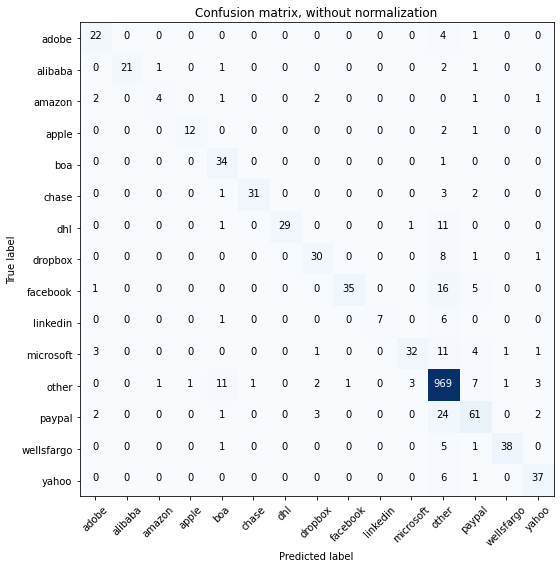

Acc     =  0.885
Pre     =  0.889
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.738
Bal_Pre =  0.866
Bal_Rec =  0.738
Bal_F1  =  0.797

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.67      0.36      0.47        11
       apple       0.92      0.80      0.86        15
         boa       0.65      0.97      0.78        35
       chase       0.97      0.84      0.90        37
         dhl       1.00      0.69      0.82        42
     dropbox       0.79      0.75      0.77        40
    facebook       0.97      0.61      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.97      0.94      1000
      paypal       0.71      0.66      0.68        93
  wellsfargo       0.95      0.84      0.89        45
       yahoo       0.82      0.84      0.83        

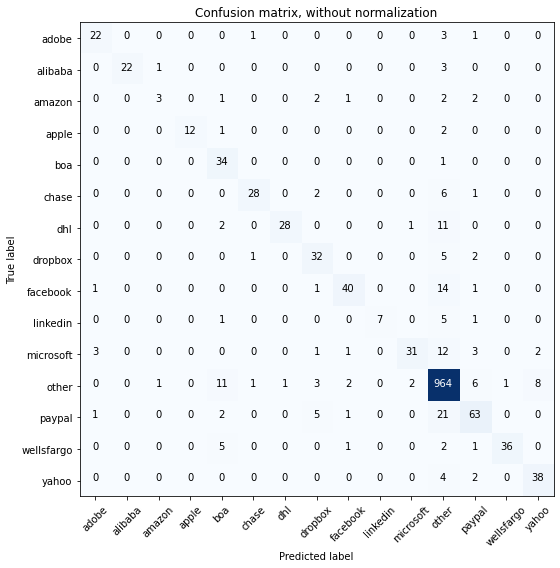

Acc     =  0.884
Pre     =  0.888
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.735
Bal_Pre =  0.853
Bal_Rec =  0.735
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.60      0.27      0.37        11
       apple       1.00      0.80      0.89        15
         boa       0.60      0.97      0.74        35
       chase       0.90      0.76      0.82        37
         dhl       0.97      0.67      0.79        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.96      0.94      1000
      paypal       0.76      0.68      0.72        93
  wellsfargo       0.97      0.80      0.88        45
       yahoo       0.79      0.86      0.83        44

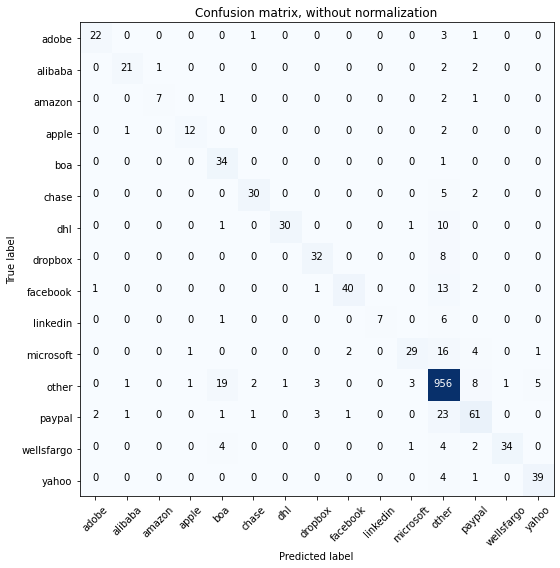

Acc     =  0.88
Pre     =  0.885
Rec     =  0.88
F1      =  0.877

Bal_Acc =  0.757
Bal_Pre =  0.865
Bal_Rec =  0.757
Bal_F1  =  0.807

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.88      0.64      0.74        11
       apple       0.86      0.80      0.83        15
         boa       0.56      0.97      0.71        35
       chase       0.88      0.81      0.85        37
         dhl       0.97      0.71      0.82        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.93      0.70      0.80        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.55      0.67        53
       other       0.91      0.96      0.93      1000
      paypal       0.73      0.66      0.69        93
  wellsfargo       0.97      0.76      0.85        45
       yahoo       0.87      0.89      0.88        44

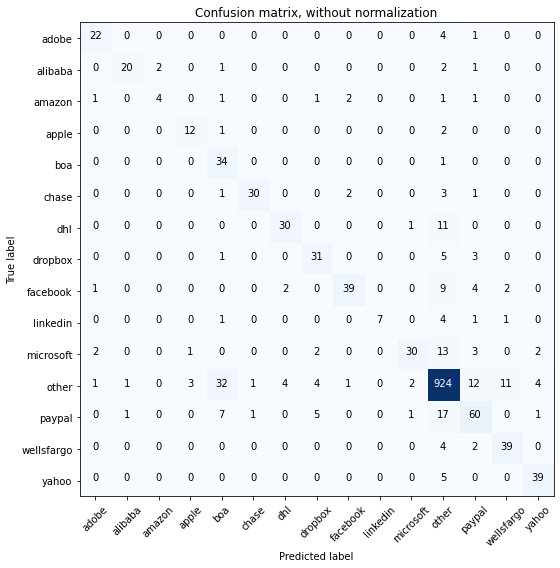

Acc     =  0.858
Pre     =  0.872
Rec     =  0.858
F1      =  0.859

Bal_Acc =  0.739
Bal_Pre =  0.801
Bal_Rec =  0.739
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.67      0.36      0.47        11
       apple       0.75      0.80      0.77        15
         boa       0.43      0.97      0.60        35
       chase       0.94      0.81      0.87        37
         dhl       0.83      0.71      0.77        42
     dropbox       0.72      0.78      0.75        40
    facebook       0.89      0.68      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.92      0.92      0.92      1000
      paypal       0.67      0.65      0.66        93
  wellsfargo       0.74      0.87      0.80        45
       yahoo       0.85      0.89      0.87        

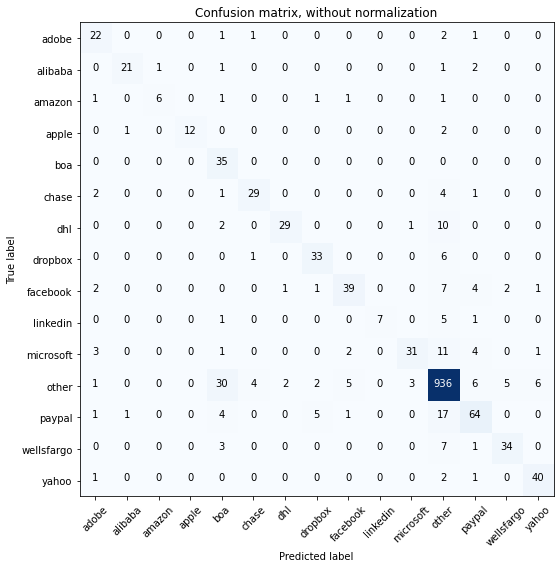

Acc     =  0.869
Pre     =  0.883
Rec     =  0.869
F1      =  0.87

Bal_Acc =  0.755
Bal_Pre =  0.829
Bal_Rec =  0.755
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.86      0.55      0.67        11
       apple       1.00      0.80      0.89        15
         boa       0.44      1.00      0.61        35
       chase       0.83      0.78      0.81        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.81      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.94      0.93      1000
      paypal       0.75      0.69      0.72        93
  wellsfargo       0.83      0.76      0.79        45
       yahoo       0.83      0.91      0.87        44

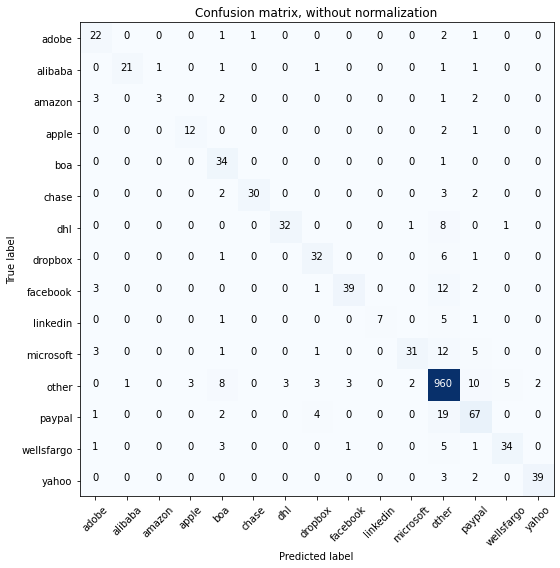

Acc     =  0.886
Pre     =  0.891
Rec     =  0.886
F1      =  0.883

Bal_Acc =  0.742
Bal_Pre =  0.844
Bal_Rec =  0.742
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.61      0.97      0.75        35
       chase       0.97      0.81      0.88        37
         dhl       0.91      0.76      0.83        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.91      0.68      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.92      0.96      0.94      1000
      paypal       0.70      0.72      0.71        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.95      0.89      0.92        4

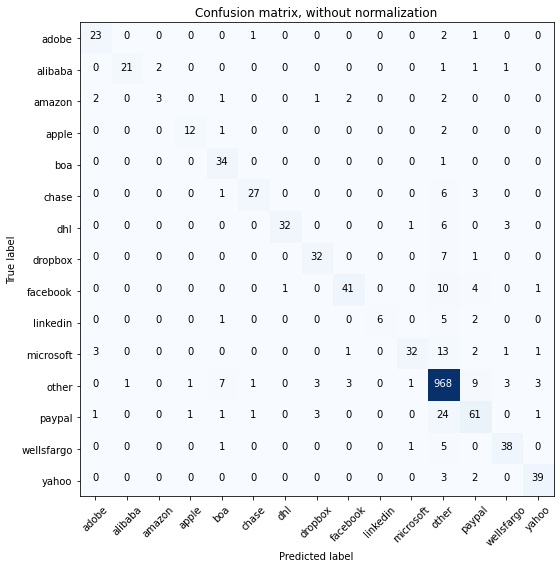

Acc     =  0.89
Pre     =  0.889
Rec     =  0.89
F1      =  0.885

Bal_Acc =  0.74
Bal_Pre =  0.848
Bal_Rec =  0.74
Bal_F1  =  0.79

              precision    recall  f1-score   support

       adobe       0.79      0.85      0.82        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.86      0.80      0.83        15
         boa       0.72      0.97      0.83        35
       chase       0.90      0.73      0.81        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.87      0.72      0.79        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.97      0.94      1000
      paypal       0.71      0.66      0.68        93
  wellsfargo       0.83      0.84      0.84        45
       yahoo       0.87      0.89      0.88        44

 

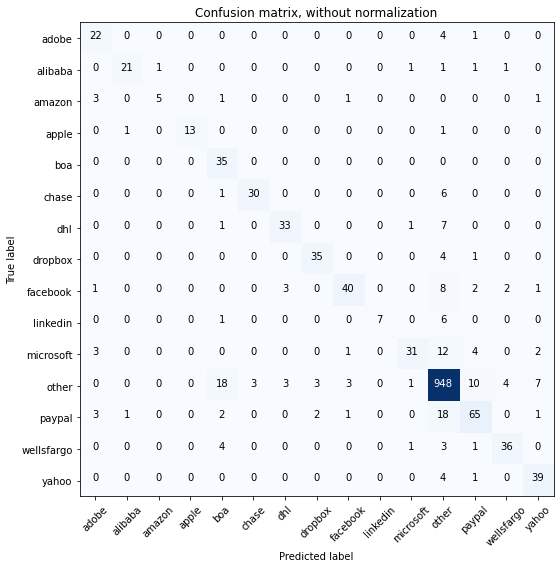

Acc     =  0.884
Pre     =  0.89
Rec     =  0.884
F1      =  0.882

Bal_Acc =  0.769
Bal_Pre =  0.844
Bal_Rec =  0.769
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.56      1.00      0.71        35
       chase       0.91      0.81      0.86        37
         dhl       0.85      0.79      0.81        42
     dropbox       0.88      0.88      0.88        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.93      0.95      0.94      1000
      paypal       0.76      0.70      0.73        93
  wellsfargo       0.84      0.80      0.82        45
       yahoo       0.76      0.89      0.82        4

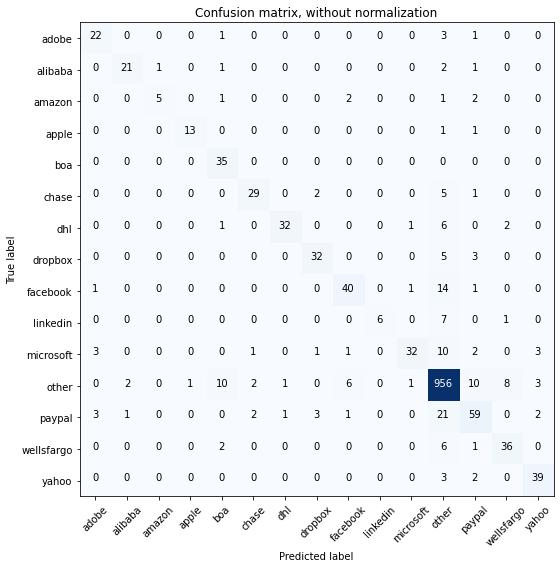

Acc     =  0.882
Pre     =  0.883
Rec     =  0.882
F1      =  0.878

Bal_Acc =  0.753
Bal_Pre =  0.843
Bal_Rec =  0.753
Bal_F1  =  0.795

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.83      0.45      0.59        11
       apple       0.93      0.87      0.90        15
         boa       0.69      1.00      0.81        35
       chase       0.85      0.78      0.82        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.84      0.80      0.82        40
    facebook       0.80      0.70      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.96      0.94      1000
      paypal       0.70      0.63      0.67        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.83      0.89      0.86        

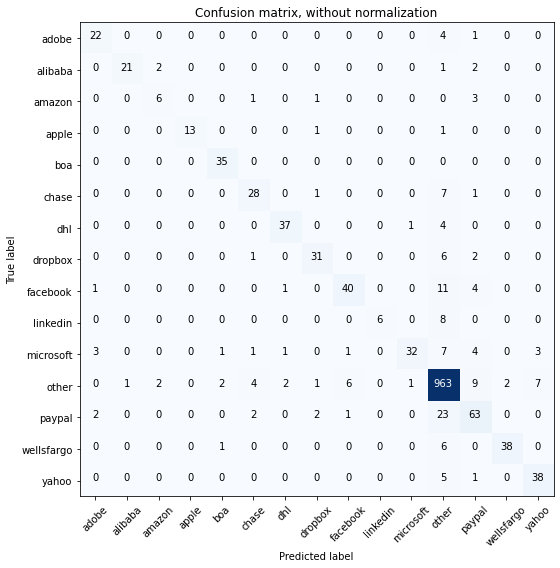

Acc     =  0.892
Pre     =  0.892
Rec     =  0.892
F1      =  0.889

Bal_Acc =  0.769
Bal_Pre =  0.858
Bal_Rec =  0.769
Bal_F1  =  0.811

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.55      0.57        11
       apple       1.00      0.87      0.93        15
         boa       0.90      1.00      0.95        35
       chase       0.76      0.76      0.76        37
         dhl       0.90      0.88      0.89        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.60      0.74        53
       other       0.92      0.96      0.94      1000
      paypal       0.70      0.68      0.69        93
  wellsfargo       0.95      0.84      0.89        45
       yahoo       0.79      0.86      0.83        

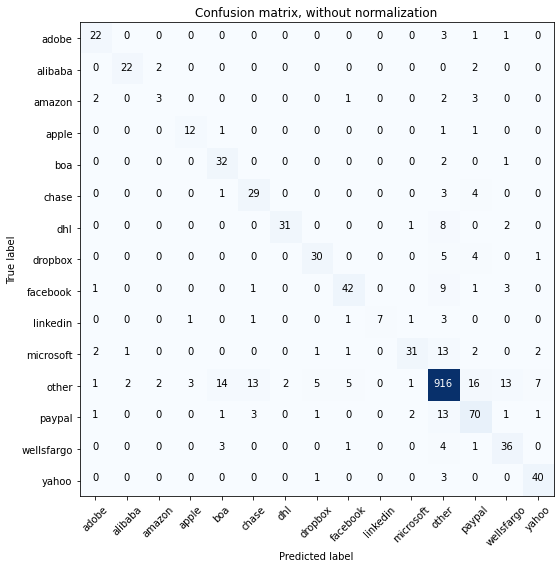

Acc     =  0.86
Pre     =  0.868
Rec     =  0.86
F1      =  0.86

Bal_Acc =  0.741
Bal_Pre =  0.765
Bal_Rec =  0.741
Bal_F1  =  0.753

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.43      0.27      0.33        11
       apple       0.75      0.80      0.77        15
         boa       0.62      0.91      0.74        35
       chase       0.62      0.78      0.69        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.79      0.75      0.77        40
    facebook       0.82      0.74      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.58      0.70        53
       other       0.93      0.92      0.92      1000
      paypal       0.67      0.75      0.71        93
  wellsfargo       0.63      0.80      0.71        45
       yahoo       0.78      0.91      0.84        44


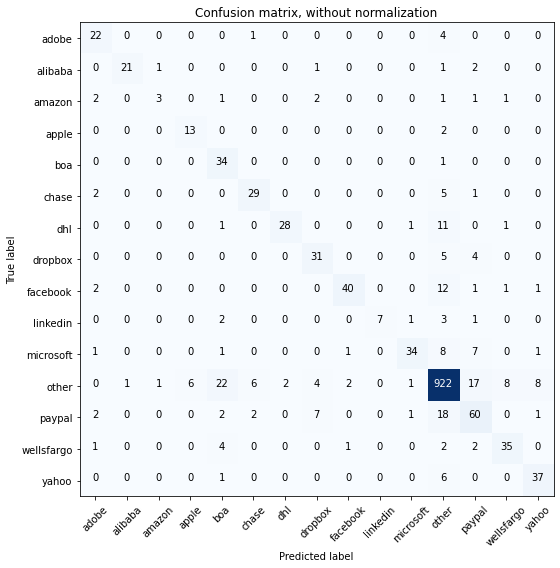

Acc     =  0.855
Pre     =  0.866
Rec     =  0.855
F1      =  0.856

Bal_Acc =  0.733
Bal_Pre =  0.78
Bal_Rec =  0.733
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.68      0.87      0.76        15
         boa       0.50      0.97      0.66        35
       chase       0.76      0.78      0.77        37
         dhl       0.93      0.67      0.78        42
     dropbox       0.69      0.78      0.73        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.64      0.75        53
       other       0.92      0.92      0.92      1000
      paypal       0.62      0.65      0.63        93
  wellsfargo       0.76      0.78      0.77        45
       yahoo       0.77      0.84      0.80        4

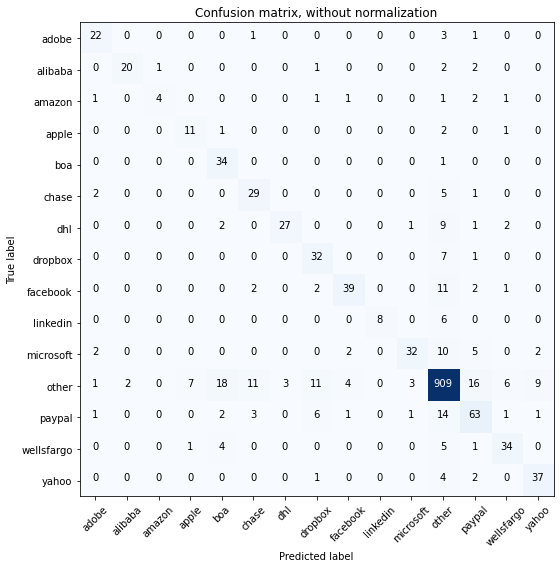

Acc     =  0.845
Pre     =  0.857
Rec     =  0.845
F1      =  0.846

Bal_Acc =  0.728
Bal_Pre =  0.766
Bal_Rec =  0.728
Bal_F1  =  0.747

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.80      0.36      0.50        11
       apple       0.58      0.73      0.65        15
         boa       0.56      0.97      0.71        35
       chase       0.63      0.78      0.70        37
         dhl       0.90      0.64      0.75        42
     dropbox       0.59      0.80      0.68        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.86      0.60      0.71        53
       other       0.92      0.91      0.91      1000
      paypal       0.65      0.68      0.66        93
  wellsfargo       0.74      0.76      0.75        45
       yahoo       0.76      0.84      0.80        

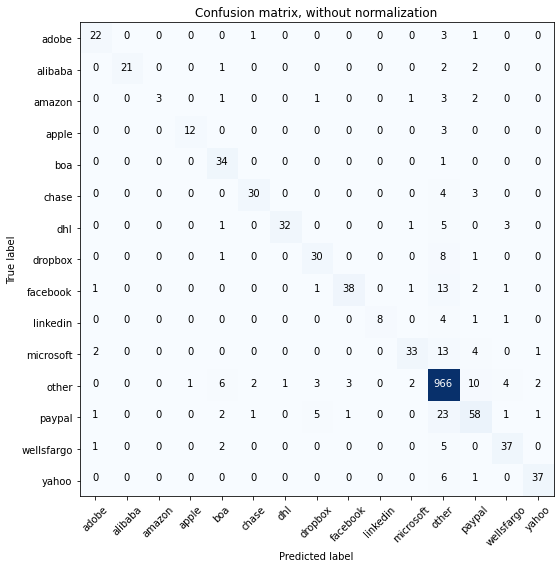

Acc     =  0.884
Pre     =  0.886
Rec     =  0.884
F1      =  0.88

Bal_Acc =  0.74
Bal_Pre =  0.874
Bal_Rec =  0.74
Bal_F1  =  0.801

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       1.00      0.81      0.89        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.71      0.97      0.82        35
       chase       0.88      0.81      0.85        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.75      0.75      0.75        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.91      0.97      0.94      1000
      paypal       0.68      0.62      0.65        93
  wellsfargo       0.79      0.82      0.80        45
       yahoo       0.90      0.84      0.87        44


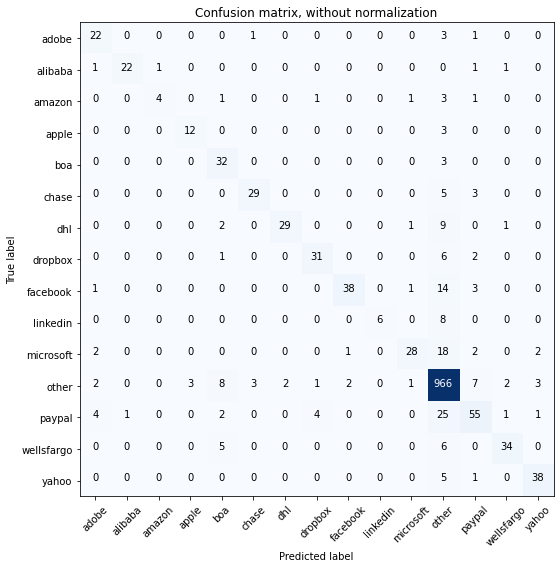

Acc     =  0.875
Pre     =  0.876
Rec     =  0.875
F1      =  0.869

Bal_Acc =  0.719
Bal_Pre =  0.846
Bal_Rec =  0.719
Bal_F1  =  0.777

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.80      0.36      0.50        11
       apple       0.80      0.80      0.80        15
         boa       0.63      0.91      0.74        35
       chase       0.88      0.78      0.83        37
         dhl       0.94      0.69      0.79        42
     dropbox       0.84      0.78      0.81        40
    facebook       0.93      0.67      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.53      0.66        53
       other       0.90      0.97      0.93      1000
      paypal       0.72      0.59      0.65        93
  wellsfargo       0.87      0.76      0.81        45
       yahoo       0.86      0.86      0.86        

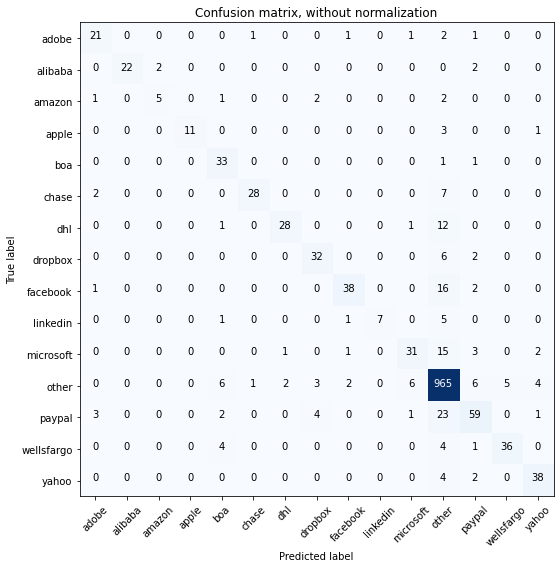

Acc     =  0.88
Pre     =  0.88
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.733
Bal_Pre =  0.852
Bal_Rec =  0.733
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.73      0.85        15
         boa       0.69      0.94      0.80        35
       chase       0.93      0.76      0.84        37
         dhl       0.90      0.67      0.77        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.78      0.58      0.67        53
       other       0.91      0.96      0.93      1000
      paypal       0.75      0.63      0.69        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.83      0.86      0.84        44


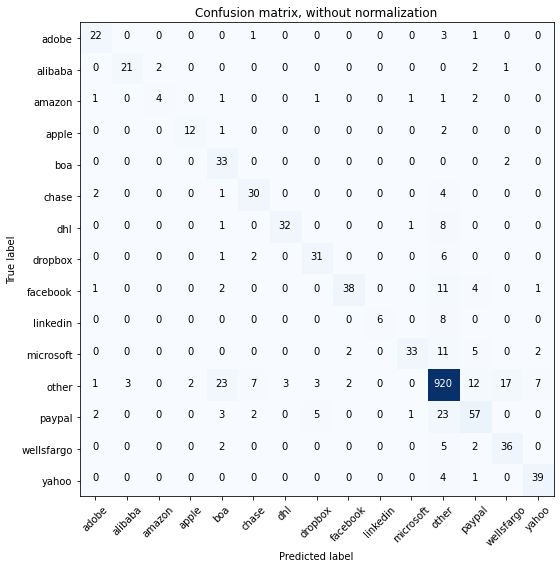

Acc     =  0.854
Pre     =  0.865
Rec     =  0.854
F1      =  0.854

Bal_Acc =  0.734
Bal_Pre =  0.792
Bal_Rec =  0.734
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.88      0.81      0.84        26
      amazon       0.67      0.36      0.47        11
       apple       0.86      0.80      0.83        15
         boa       0.49      0.94      0.64        35
       chase       0.71      0.81      0.76        37
         dhl       0.91      0.76      0.83        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.92      0.62      0.74        53
       other       0.91      0.92      0.92      1000
      paypal       0.66      0.61      0.64        93
  wellsfargo       0.64      0.80      0.71        45
       yahoo       0.80      0.89      0.84        

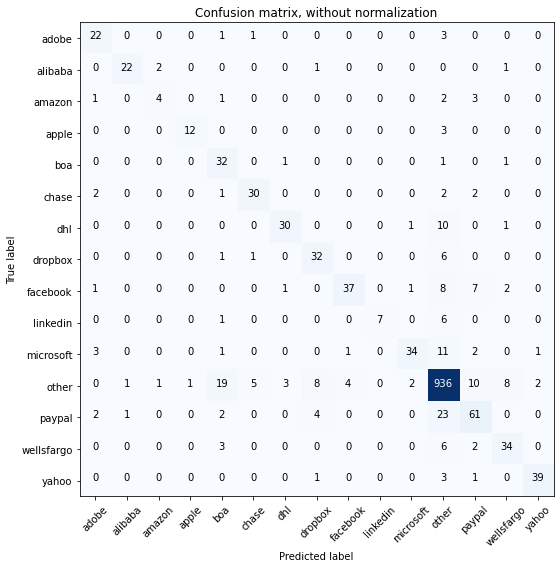

Acc     =  0.865
Pre     =  0.872
Rec     =  0.865
F1      =  0.865

Bal_Acc =  0.739
Bal_Pre =  0.803
Bal_Rec =  0.739
Bal_F1  =  0.77

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.57      0.36      0.44        11
       apple       0.92      0.80      0.86        15
         boa       0.52      0.91      0.66        35
       chase       0.81      0.81      0.81        37
         dhl       0.86      0.71      0.78        42
     dropbox       0.70      0.80      0.74        40
    facebook       0.88      0.65      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.64      0.75        53
       other       0.92      0.94      0.93      1000
      paypal       0.69      0.66      0.67        93
  wellsfargo       0.72      0.76      0.74        45
       yahoo       0.93      0.89      0.91        4

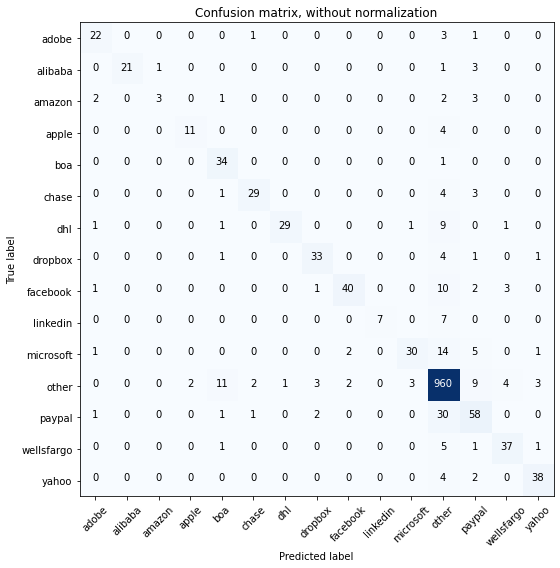

Acc     =  0.878
Pre     =  0.88
Rec     =  0.878
F1      =  0.874

Bal_Acc =  0.729
Bal_Pre =  0.852
Bal_Rec =  0.729
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       0.85      0.73      0.79        15
         boa       0.67      0.97      0.79        35
       chase       0.88      0.78      0.83        37
         dhl       0.97      0.69      0.81        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.96      0.93      1000
      paypal       0.66      0.62      0.64        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.86      0.86      0.86        4

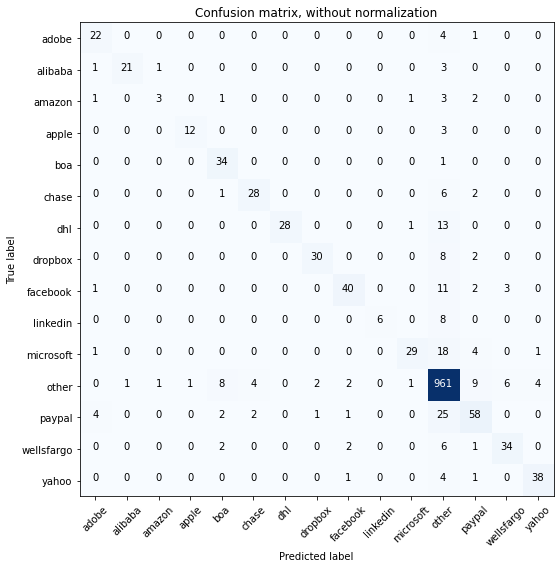

Acc     =  0.873
Pre     =  0.874
Rec     =  0.873
F1      =  0.868

Bal_Acc =  0.715
Bal_Pre =  0.847
Bal_Rec =  0.715
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       0.92      0.80      0.86        15
         boa       0.71      0.97      0.82        35
       chase       0.82      0.76      0.79        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.91      0.75      0.82        40
    facebook       0.87      0.70      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.96      0.93      1000
      paypal       0.71      0.62      0.66        93
  wellsfargo       0.79      0.76      0.77        45
       yahoo       0.88      0.86      0.87        

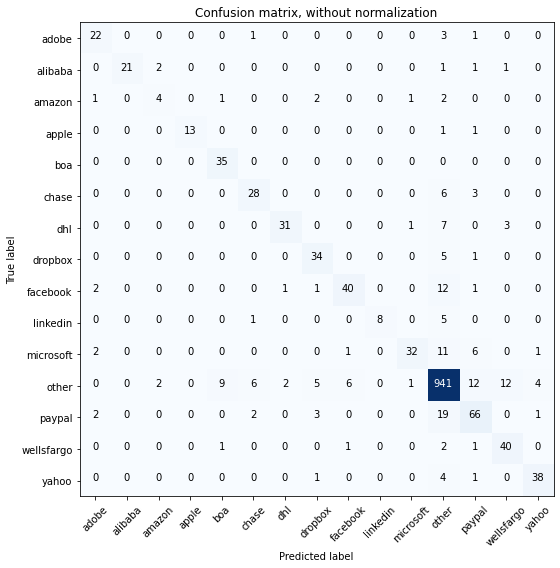

Acc     =  0.879
Pre     =  0.882
Rec     =  0.879
F1      =  0.877

Bal_Acc =  0.765
Bal_Pre =  0.824
Bal_Rec =  0.765
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.50      0.36      0.42        11
       apple       1.00      0.87      0.93        15
         boa       0.76      1.00      0.86        35
       chase       0.74      0.76      0.75        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.74      0.85      0.79        40
    facebook       0.83      0.70      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.91      0.60      0.73        53
       other       0.92      0.94      0.93      1000
      paypal       0.70      0.71      0.71        93
  wellsfargo       0.71      0.89      0.79        45
       yahoo       0.86      0.86      0.86        

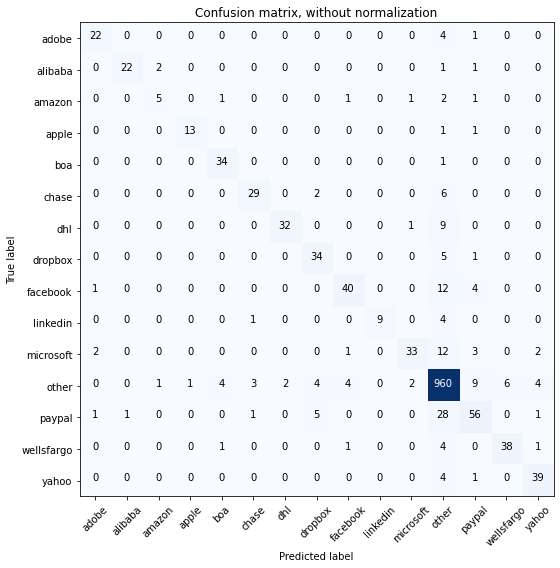

Acc     =  0.888
Pre     =  0.886
Rec     =  0.888
F1      =  0.884

Bal_Acc =  0.774
Bal_Pre =  0.855
Bal_Rec =  0.774
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.62      0.45      0.53        11
       apple       0.93      0.87      0.90        15
         boa       0.85      0.97      0.91        35
       chase       0.85      0.78      0.82        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.96      0.94      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.86      0.84      0.85        45
       yahoo       0.83      0.89      0.86        

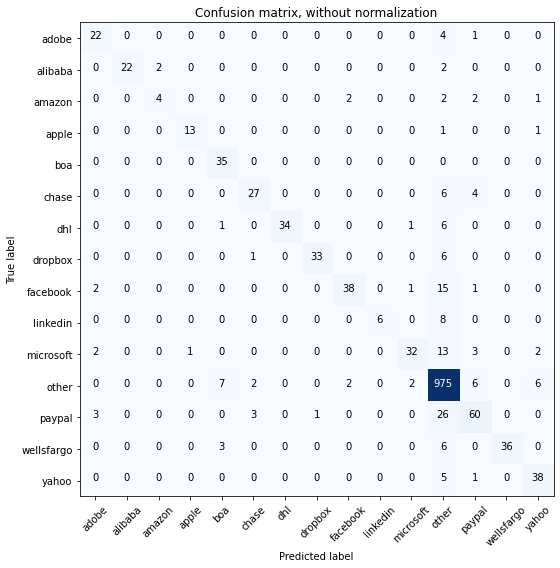

Acc     =  0.893
Pre     =  0.894
Rec     =  0.893
F1      =  0.888

Bal_Acc =  0.749
Bal_Pre =  0.878
Bal_Rec =  0.749
Bal_F1  =  0.808

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       0.93      0.87      0.90        15
         boa       0.76      1.00      0.86        35
       chase       0.82      0.73      0.77        37
         dhl       1.00      0.81      0.89        42
     dropbox       0.97      0.82      0.89        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.97      0.94      1000
      paypal       0.77      0.65      0.70        93
  wellsfargo       1.00      0.80      0.89        45
       yahoo       0.79      0.86      0.83        

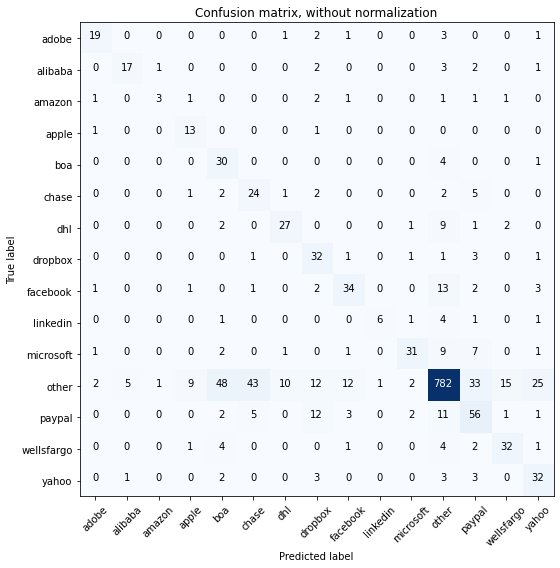

Acc     =  0.739
Pre     =  0.799
Rec     =  0.739
F1      =  0.757

Bal_Acc =  0.659
Bal_Pre =  0.612
Bal_Rec =  0.659
Bal_F1  =  0.635

              precision    recall  f1-score   support

       adobe       0.76      0.70      0.73        27
     alibaba       0.74      0.65      0.69        26
      amazon       0.60      0.27      0.37        11
       apple       0.50      0.87      0.63        15
         boa       0.32      0.86      0.47        35
       chase       0.32      0.65      0.43        37
         dhl       0.68      0.64      0.66        42
     dropbox       0.46      0.80      0.58        40
    facebook       0.63      0.60      0.61        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.82      0.58      0.68        53
       other       0.92      0.78      0.85      1000
      paypal       0.48      0.60      0.54        93
  wellsfargo       0.63      0.71      0.67        45
       yahoo       0.47      0.73      0.57        

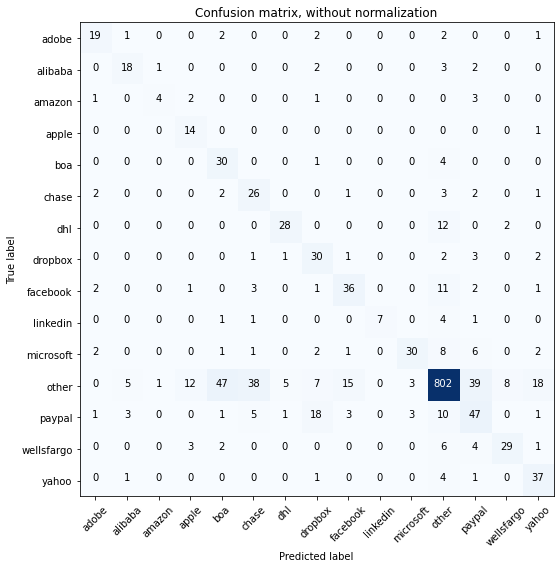

Acc     =  0.752
Pre     =  0.806
Rec     =  0.752
F1      =  0.767

Bal_Acc =  0.677
Bal_Pre =  0.636
Bal_Rec =  0.677
Bal_F1  =  0.656

              precision    recall  f1-score   support

       adobe       0.70      0.70      0.70        27
     alibaba       0.64      0.69      0.67        26
      amazon       0.67      0.36      0.47        11
       apple       0.44      0.93      0.60        15
         boa       0.35      0.86      0.50        35
       chase       0.35      0.70      0.46        37
         dhl       0.80      0.67      0.73        42
     dropbox       0.46      0.75      0.57        40
    facebook       0.63      0.63      0.63        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.83      0.57      0.67        53
       other       0.92      0.80      0.86      1000
      paypal       0.43      0.51      0.46        93
  wellsfargo       0.74      0.64      0.69        45
       yahoo       0.57      0.84      0.68        

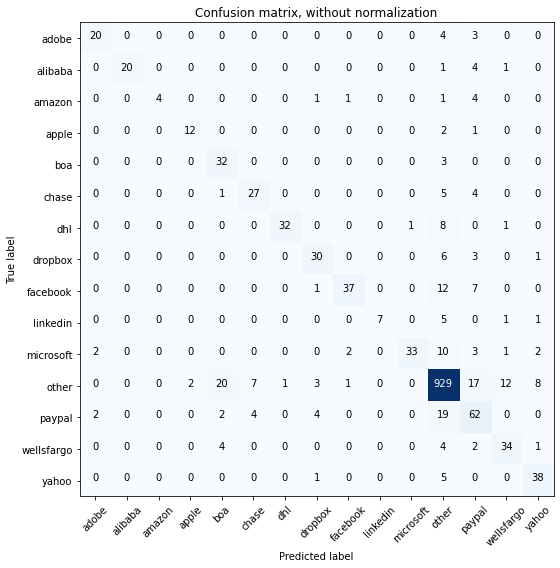

Acc     =  0.856
Pre     =  0.869
Rec     =  0.856
F1      =  0.856

Bal_Acc =  0.721
Bal_Pre =  0.829
Bal_Rec =  0.721
Bal_F1  =  0.771

              precision    recall  f1-score   support

       adobe       0.83      0.74      0.78        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.36      0.53        11
       apple       0.86      0.80      0.83        15
         boa       0.54      0.91      0.68        35
       chase       0.71      0.73      0.72        37
         dhl       0.97      0.76      0.85        42
     dropbox       0.75      0.75      0.75        40
    facebook       0.90      0.65      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.62      0.76        53
       other       0.92      0.93      0.92      1000
      paypal       0.56      0.67      0.61        93
  wellsfargo       0.68      0.76      0.72        45
       yahoo       0.75      0.86      0.80        

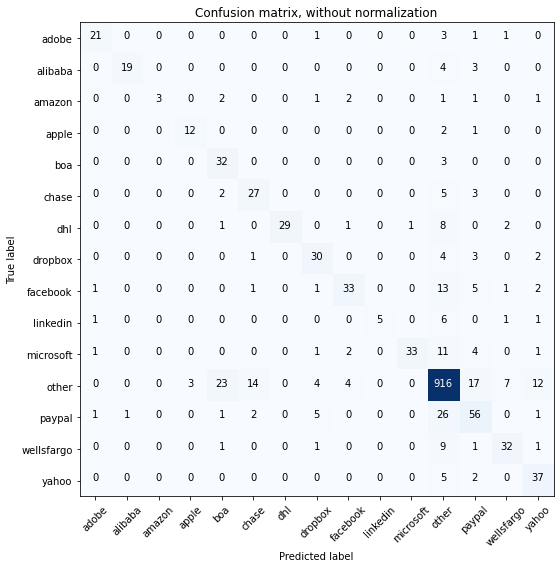

Acc     =  0.835
Pre     =  0.849
Rec     =  0.835
F1      =  0.834

Bal_Acc =  0.686
Bal_Pre =  0.799
Bal_Rec =  0.686
Bal_F1  =  0.738

              precision    recall  f1-score   support

       adobe       0.84      0.78      0.81        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       0.80      0.80      0.80        15
         boa       0.52      0.91      0.66        35
       chase       0.60      0.73      0.66        37
         dhl       1.00      0.69      0.82        42
     dropbox       0.68      0.75      0.71        40
    facebook       0.79      0.58      0.67        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.97      0.62      0.76        53
       other       0.90      0.92      0.91      1000
      paypal       0.58      0.60      0.59        93
  wellsfargo       0.73      0.71      0.72        45
       yahoo       0.64      0.84      0.73        

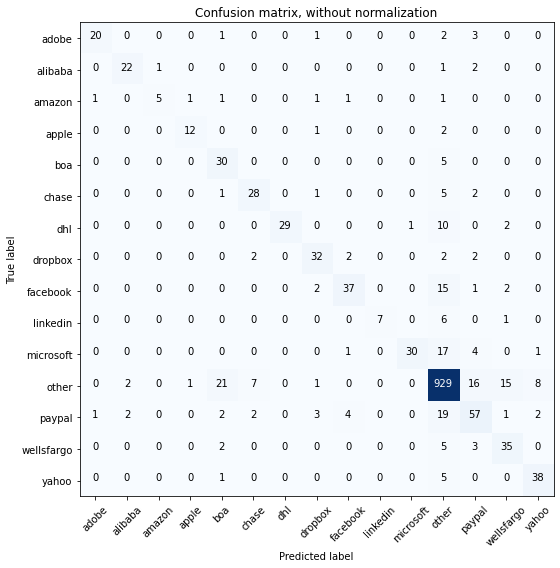

Acc     =  0.852
Pre     =  0.862
Rec     =  0.852
F1      =  0.851

Bal_Acc =  0.723
Bal_Pre =  0.811
Bal_Rec =  0.723
Bal_F1  =  0.764

              precision    recall  f1-score   support

       adobe       0.91      0.74      0.82        27
     alibaba       0.85      0.85      0.85        26
      amazon       0.83      0.45      0.59        11
       apple       0.86      0.80      0.83        15
         boa       0.51      0.86      0.64        35
       chase       0.72      0.76      0.74        37
         dhl       1.00      0.69      0.82        42
     dropbox       0.76      0.80      0.78        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.57      0.71        53
       other       0.91      0.93      0.92      1000
      paypal       0.63      0.61      0.62        93
  wellsfargo       0.62      0.78      0.69        45
       yahoo       0.78      0.86      0.82        

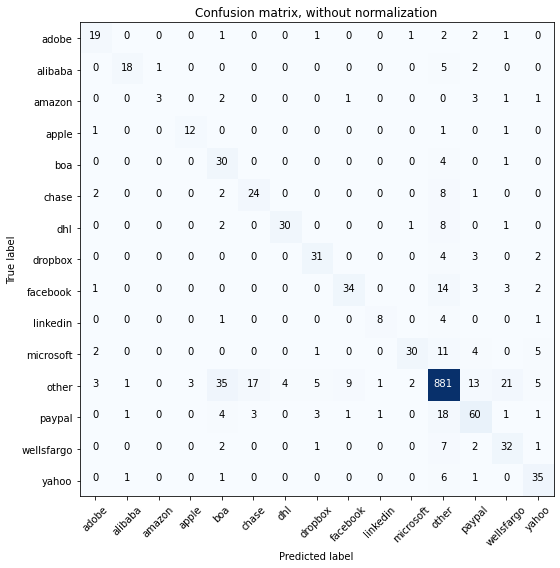

Acc     =  0.81
Pre     =  0.831
Rec     =  0.81
F1      =  0.815

Bal_Acc =  0.682
Bal_Pre =  0.719
Bal_Rec =  0.682
Bal_F1  =  0.7

              precision    recall  f1-score   support

       adobe       0.68      0.70      0.69        27
     alibaba       0.86      0.69      0.77        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.38      0.86      0.52        35
       chase       0.55      0.65      0.59        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.74      0.78      0.76        40
    facebook       0.76      0.60      0.67        57
    linkedin       0.80      0.57      0.67        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.88      0.89      1000
      paypal       0.64      0.65      0.64        93
  wellsfargo       0.52      0.71      0.60        45
       yahoo       0.66      0.80      0.72        44



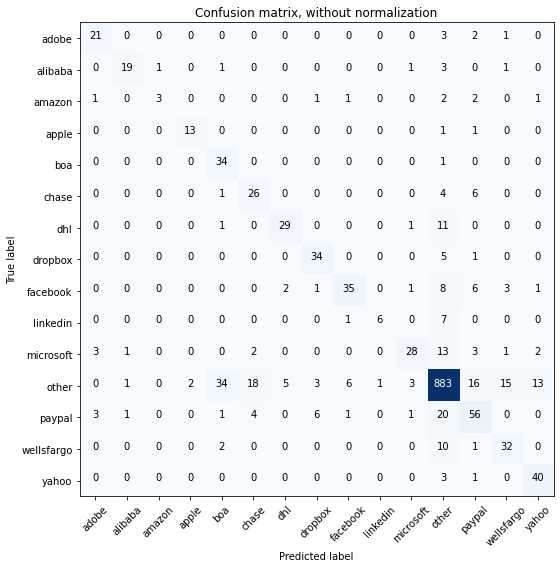

Acc     =  0.818
Pre     =  0.833
Rec     =  0.818
F1      =  0.82

Bal_Acc =  0.703
Bal_Pre =  0.735
Bal_Rec =  0.703
Bal_F1  =  0.719

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.86      0.73      0.79        26
      amazon       0.75      0.27      0.40        11
       apple       0.87      0.87      0.87        15
         boa       0.46      0.97      0.62        35
       chase       0.52      0.70      0.60        37
         dhl       0.81      0.69      0.74        42
     dropbox       0.76      0.85      0.80        40
    facebook       0.80      0.61      0.69        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.80      0.53      0.64        53
       other       0.91      0.88      0.89      1000
      paypal       0.59      0.60      0.60        93
  wellsfargo       0.60      0.71      0.65        45
       yahoo       0.70      0.91      0.79        4

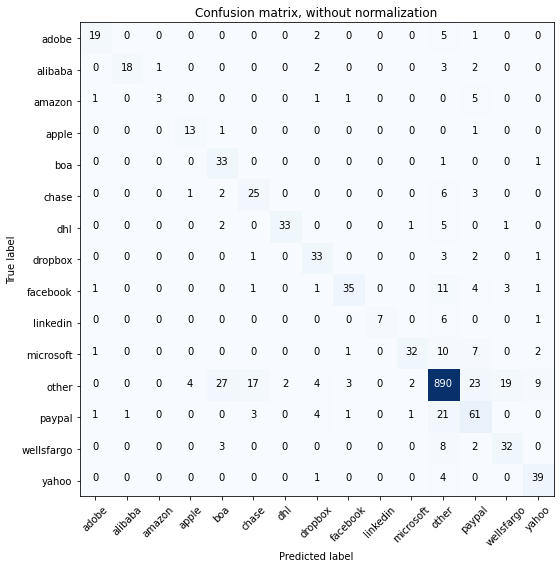

Acc     =  0.827
Pre     =  0.847
Rec     =  0.827
F1      =  0.83

Bal_Acc =  0.708
Bal_Pre =  0.76
Bal_Rec =  0.708
Bal_F1  =  0.733

              precision    recall  f1-score   support

       adobe       0.83      0.70      0.76        27
     alibaba       0.95      0.69      0.80        26
      amazon       0.75      0.27      0.40        11
       apple       0.72      0.87      0.79        15
         boa       0.49      0.94      0.64        35
       chase       0.53      0.68      0.60        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.69      0.82      0.75        40
    facebook       0.85      0.61      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.89      0.90      1000
      paypal       0.55      0.66      0.60        93
  wellsfargo       0.58      0.71      0.64        45
       yahoo       0.72      0.89      0.80        44

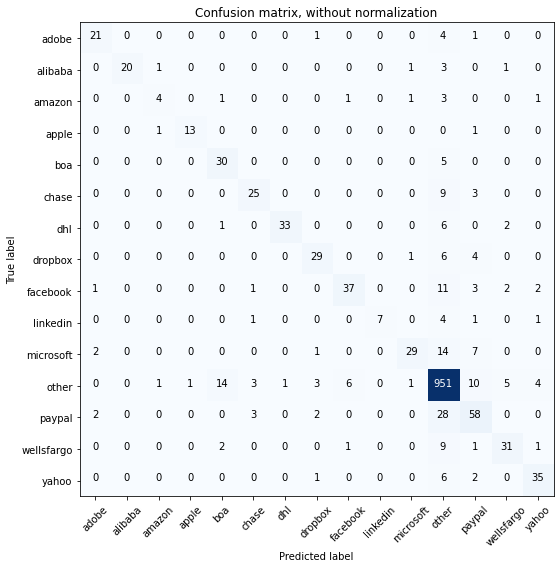

Acc     =  0.86
Pre     =  0.86
Rec     =  0.86
F1      =  0.856

Bal_Acc =  0.705
Bal_Pre =  0.816
Bal_Rec =  0.705
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       1.00      0.77      0.87        26
      amazon       0.57      0.36      0.44        11
       apple       0.93      0.87      0.90        15
         boa       0.62      0.86      0.72        35
       chase       0.76      0.68      0.71        37
         dhl       0.97      0.79      0.87        42
     dropbox       0.78      0.72      0.75        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.88      0.55      0.67        53
       other       0.90      0.95      0.92      1000
      paypal       0.64      0.62      0.63        93
  wellsfargo       0.76      0.69      0.72        45
       yahoo       0.80      0.80      0.80        44


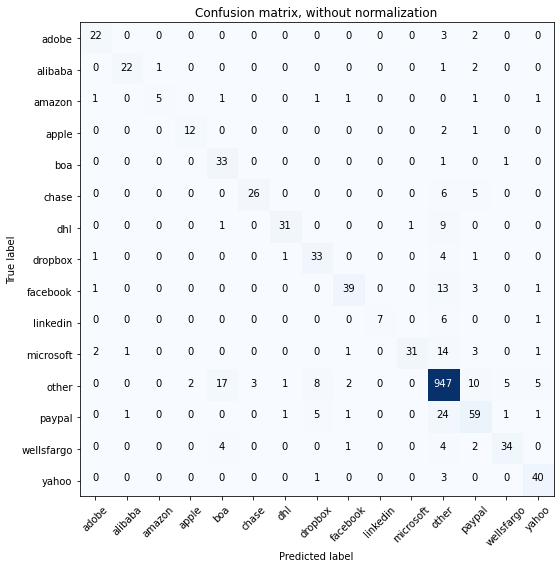

Acc     =  0.871
Pre     =  0.877
Rec     =  0.871
F1      =  0.869

Bal_Acc =  0.743
Bal_Pre =  0.837
Bal_Rec =  0.743
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.83      0.45      0.59        11
       apple       0.86      0.80      0.83        15
         boa       0.59      0.94      0.73        35
       chase       0.90      0.70      0.79        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.69      0.82      0.75        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.58      0.73        53
       other       0.91      0.95      0.93      1000
      paypal       0.66      0.63      0.65        93
  wellsfargo       0.83      0.76      0.79        45
       yahoo       0.80      0.91      0.85        

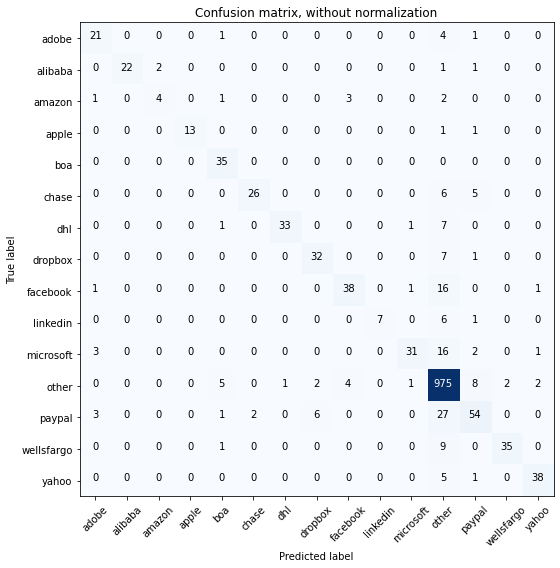

Acc     =  0.886
Pre     =  0.886
Rec     =  0.886
F1      =  0.881

Bal_Acc =  0.739
Bal_Pre =  0.873
Bal_Rec =  0.739
Bal_F1  =  0.8

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.93      0.70      0.80        37
         dhl       0.97      0.79      0.87        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.90      0.97      0.94      1000
      paypal       0.72      0.58      0.64        93
  wellsfargo       0.95      0.78      0.85        45
       yahoo       0.90      0.86      0.88        44

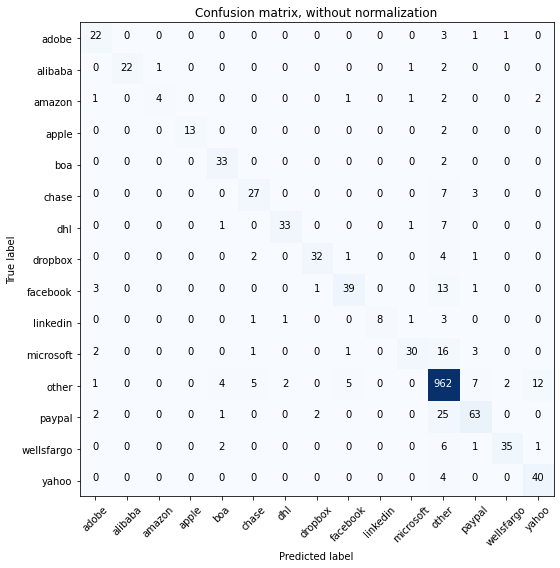

Acc     =  0.886
Pre     =  0.886
Rec     =  0.886
F1      =  0.882

Bal_Acc =  0.753
Bal_Pre =  0.864
Bal_Rec =  0.753
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.87      0.93        15
         boa       0.80      0.94      0.87        35
       chase       0.75      0.73      0.74        37
         dhl       0.92      0.79      0.85        42
     dropbox       0.91      0.80      0.85        40
    facebook       0.83      0.68      0.75        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.96      0.93      1000
      paypal       0.79      0.68      0.73        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.73      0.91      0.81        

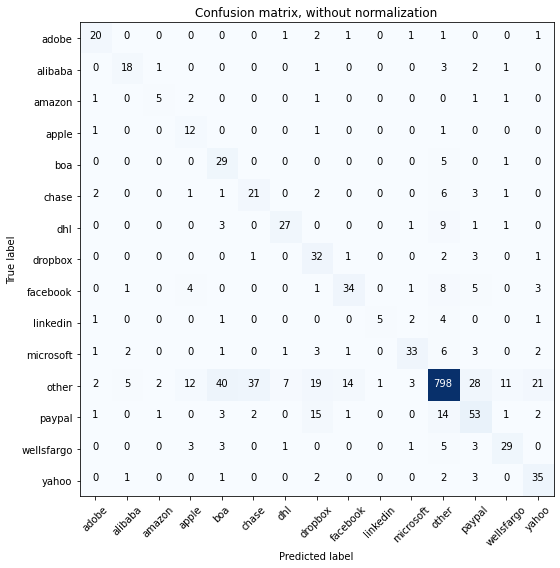

Acc     =  0.748
Pre     =  0.801
Rec     =  0.748
F1      =  0.764

Bal_Acc =  0.661
Bal_Pre =  0.597
Bal_Rec =  0.661
Bal_F1  =  0.627

              precision    recall  f1-score   support

       adobe       0.69      0.74      0.71        27
     alibaba       0.67      0.69      0.68        26
      amazon       0.56      0.45      0.50        11
       apple       0.35      0.80      0.49        15
         boa       0.35      0.83      0.50        35
       chase       0.34      0.57      0.43        37
         dhl       0.73      0.64      0.68        42
     dropbox       0.41      0.80      0.54        40
    facebook       0.65      0.60      0.62        57
    linkedin       0.83      0.36      0.50        14
   microsoft       0.79      0.62      0.69        53
       other       0.92      0.80      0.86      1000
      paypal       0.50      0.57      0.54        93
  wellsfargo       0.63      0.64      0.64        45
       yahoo       0.53      0.80      0.64        

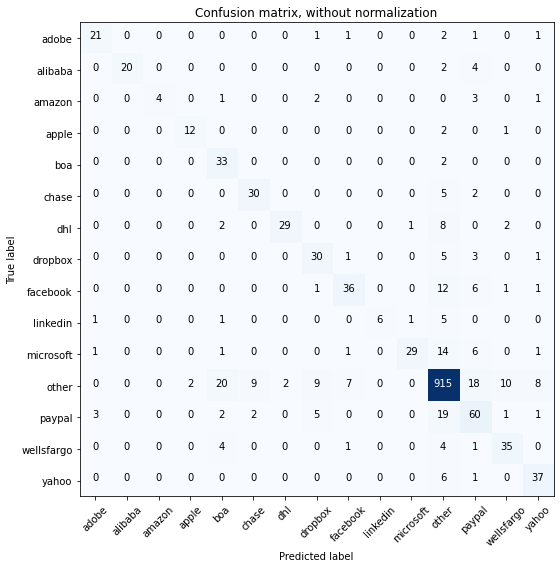

Acc     =  0.843
Pre     =  0.857
Rec     =  0.843
F1      =  0.843

Bal_Acc =  0.713
Bal_Pre =  0.806
Bal_Rec =  0.713
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.36      0.53        11
       apple       0.86      0.80      0.83        15
         boa       0.52      0.94      0.67        35
       chase       0.73      0.81      0.77        37
         dhl       0.94      0.69      0.79        42
     dropbox       0.62      0.75      0.68        40
    facebook       0.77      0.63      0.69        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.55      0.69        53
       other       0.91      0.92      0.91      1000
      paypal       0.57      0.65      0.61        93
  wellsfargo       0.70      0.78      0.74        45
       yahoo       0.73      0.84      0.78        

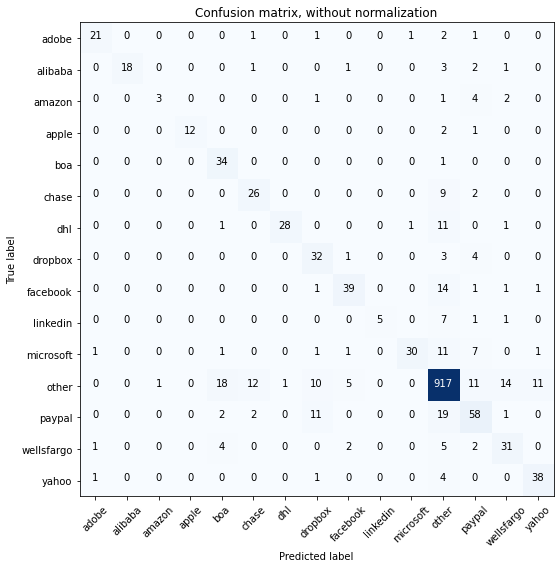

Acc     =  0.84
Pre     =  0.853
Rec     =  0.84
F1      =  0.839

Bal_Acc =  0.692
Bal_Pre =  0.795
Bal_Rec =  0.692
Bal_F1  =  0.74

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       1.00      0.69      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.57      0.97      0.72        35
       chase       0.62      0.70      0.66        37
         dhl       0.97      0.67      0.79        42
     dropbox       0.55      0.80      0.65        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.92      0.91      1000
      paypal       0.62      0.62      0.62        93
  wellsfargo       0.60      0.69      0.64        45
       yahoo       0.75      0.86      0.80        44


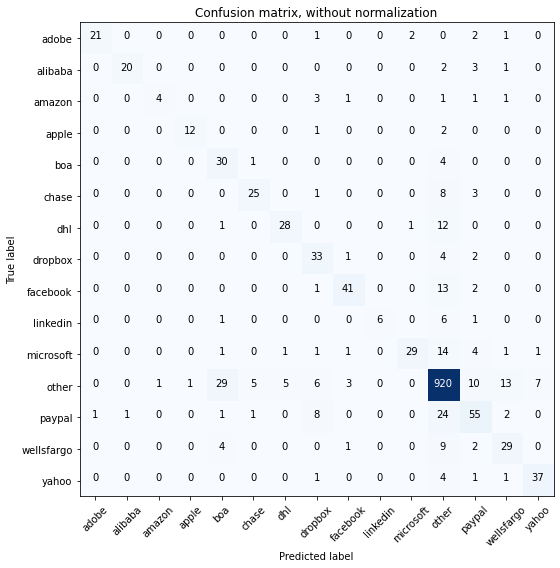

Acc     =  0.838
Pre     =  0.85
Rec     =  0.838
F1      =  0.838

Bal_Acc =  0.695
Bal_Pre =  0.799
Bal_Rec =  0.695
Bal_F1  =  0.743

              precision    recall  f1-score   support

       adobe       0.95      0.78      0.86        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.45      0.86      0.59        35
       chase       0.78      0.68      0.72        37
         dhl       0.82      0.67      0.74        42
     dropbox       0.59      0.82      0.69        40
    facebook       0.85      0.72      0.78        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.55      0.68        53
       other       0.90      0.92      0.91      1000
      paypal       0.64      0.59      0.61        93
  wellsfargo       0.59      0.64      0.62        45
       yahoo       0.82      0.84      0.83        4

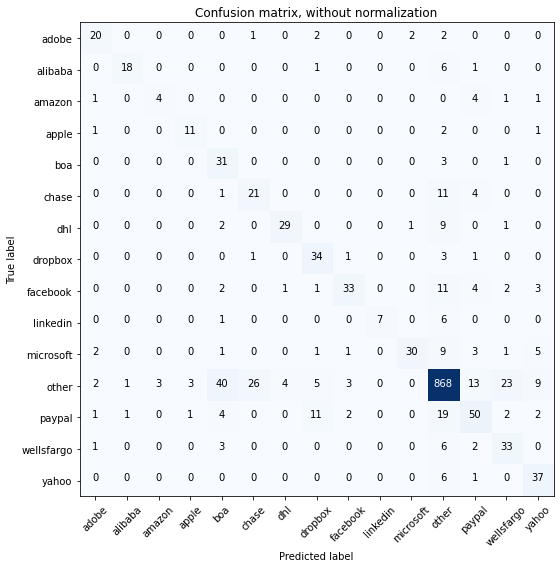

Acc     =  0.797
Pre     =  0.824
Rec     =  0.797
F1      =  0.803

Bal_Acc =  0.677
Bal_Pre =  0.705
Bal_Rec =  0.677
Bal_F1  =  0.691

              precision    recall  f1-score   support

       adobe       0.71      0.74      0.73        27
     alibaba       0.90      0.69      0.78        26
      amazon       0.57      0.36      0.44        11
       apple       0.73      0.73      0.73        15
         boa       0.36      0.89      0.52        35
       chase       0.43      0.57      0.49        37
         dhl       0.85      0.69      0.76        42
     dropbox       0.62      0.85      0.72        40
    facebook       0.82      0.58      0.68        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.90      0.87      0.89      1000
      paypal       0.60      0.54      0.57        93
  wellsfargo       0.52      0.73      0.61        45
       yahoo       0.64      0.84      0.73        

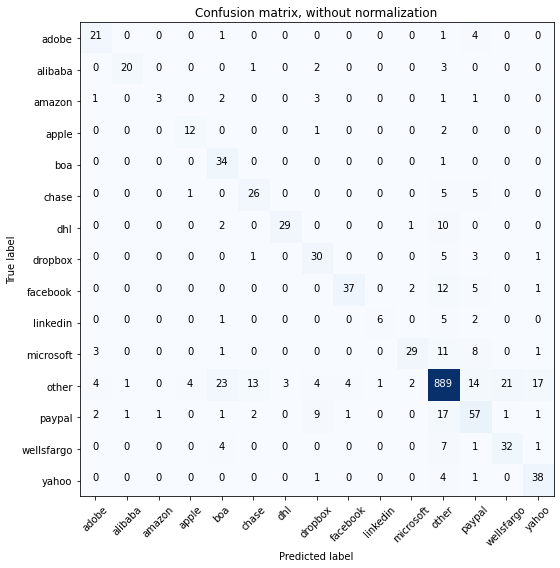

Acc     =  0.821
Pre     =  0.839
Rec     =  0.821
F1      =  0.823

Bal_Acc =  0.696
Bal_Pre =  0.729
Bal_Rec =  0.696
Bal_F1  =  0.712

              precision    recall  f1-score   support

       adobe       0.68      0.78      0.72        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.71      0.80      0.75        15
         boa       0.49      0.97      0.65        35
       chase       0.60      0.70      0.65        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.60      0.75      0.67        40
    facebook       0.88      0.65      0.75        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.85      0.55      0.67        53
       other       0.91      0.89      0.90      1000
      paypal       0.56      0.61      0.59        93
  wellsfargo       0.59      0.71      0.65        45
       yahoo       0.63      0.86      0.73        

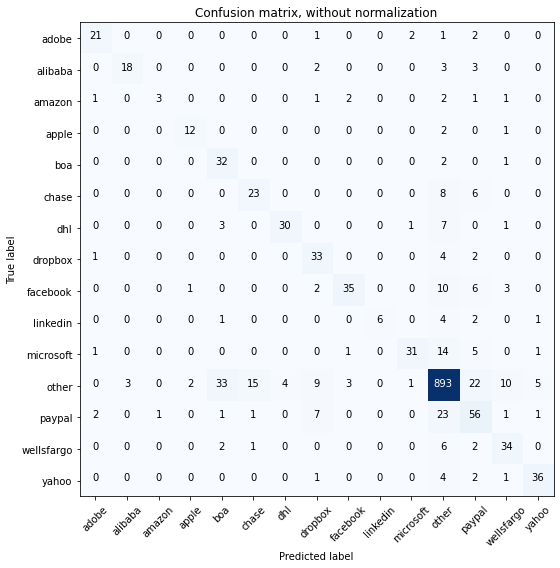

Acc     =  0.821
Pre     =  0.84
Rec     =  0.821
F1      =  0.823

Bal_Acc =  0.688
Bal_Pre =  0.755
Bal_Rec =  0.688
Bal_F1  =  0.72

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.86      0.69      0.77        26
      amazon       0.75      0.27      0.40        11
       apple       0.80      0.80      0.80        15
         boa       0.44      0.91      0.60        35
       chase       0.57      0.62      0.60        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.59      0.82      0.69        40
    facebook       0.85      0.61      0.71        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.89      0.90      1000
      paypal       0.51      0.60      0.55        93
  wellsfargo       0.64      0.76      0.69        45
       yahoo       0.82      0.82      0.82        44

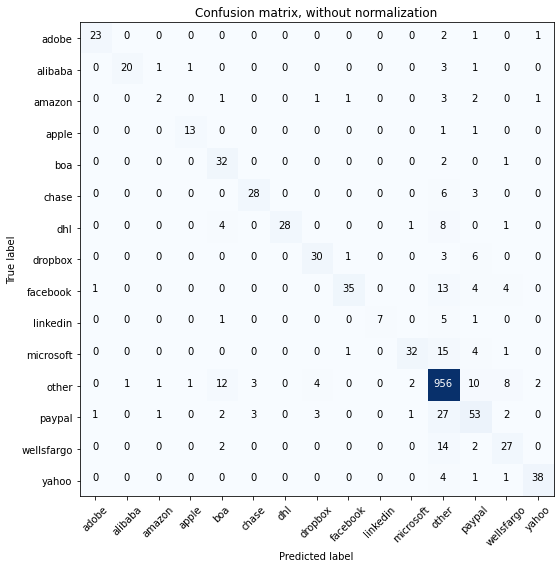

Acc     =  0.86
Pre     =  0.863
Rec     =  0.86
F1      =  0.856

Bal_Acc =  0.698
Bal_Pre =  0.81
Bal_Rec =  0.698
Bal_F1  =  0.75

              precision    recall  f1-score   support

       adobe       0.92      0.85      0.88        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.40      0.18      0.25        11
       apple       0.87      0.87      0.87        15
         boa       0.59      0.91      0.72        35
       chase       0.82      0.76      0.79        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.79      0.75      0.77        40
    facebook       0.92      0.61      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.90      0.96      0.93      1000
      paypal       0.60      0.57      0.58        93
  wellsfargo       0.60      0.60      0.60        45
       yahoo       0.90      0.86      0.88        44



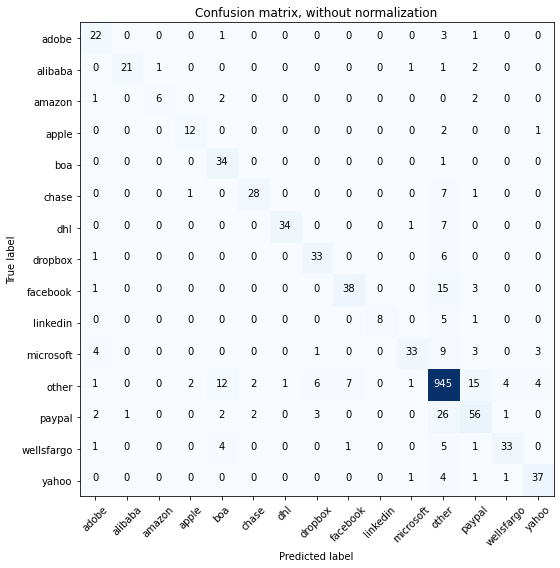

Acc     =  0.871
Pre     =  0.874
Rec     =  0.871
F1      =  0.869

Bal_Acc =  0.754
Bal_Pre =  0.831
Bal_Rec =  0.754
Bal_F1  =  0.791

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.86      0.55      0.67        11
       apple       0.80      0.80      0.80        15
         boa       0.62      0.97      0.76        35
       chase       0.88      0.76      0.81        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.77      0.82      0.80        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.89      0.62      0.73        53
       other       0.91      0.94      0.93      1000
      paypal       0.65      0.60      0.63        93
  wellsfargo       0.85      0.73      0.79        45
       yahoo       0.82      0.84      0.83        

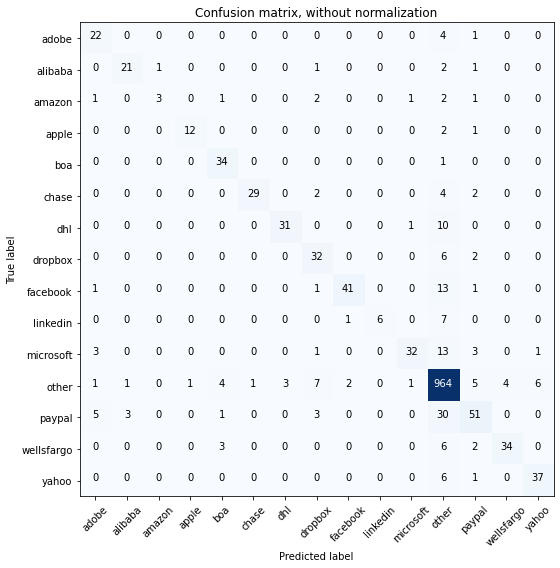

Acc     =  0.877
Pre     =  0.877
Rec     =  0.877
F1      =  0.871

Bal_Acc =  0.723
Bal_Pre =  0.847
Bal_Rec =  0.723
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.67      0.81      0.73        27
     alibaba       0.84      0.81      0.82        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.79      0.97      0.87        35
       chase       0.97      0.78      0.87        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.65      0.80      0.72        40
    facebook       0.93      0.72      0.81        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.90      0.96      0.93      1000
      paypal       0.72      0.55      0.62        93
  wellsfargo       0.89      0.76      0.82        45
       yahoo       0.84      0.84      0.84        4

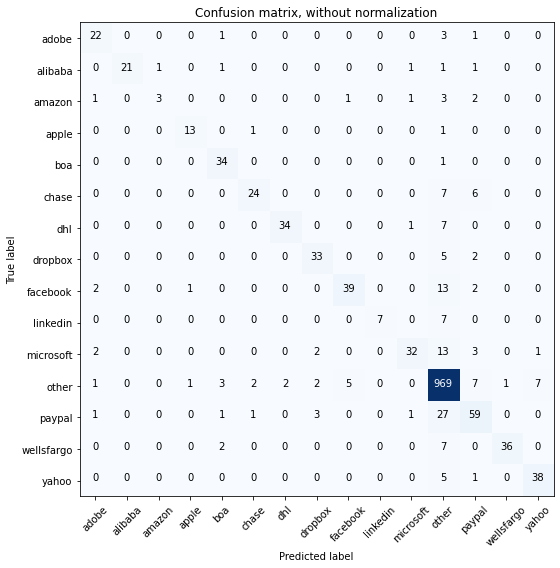

Acc     =  0.886
Pre     =  0.886
Rec     =  0.886
F1      =  0.881

Bal_Acc =  0.738
Bal_Pre =  0.865
Bal_Rec =  0.738
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.27      0.40        11
       apple       0.87      0.87      0.87        15
         boa       0.81      0.97      0.88        35
       chase       0.86      0.65      0.74        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.82      0.82      0.82        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.60      0.72        53
       other       0.91      0.97      0.94      1000
      paypal       0.70      0.63      0.67        93
  wellsfargo       0.97      0.80      0.88        45
       yahoo       0.83      0.86      0.84        

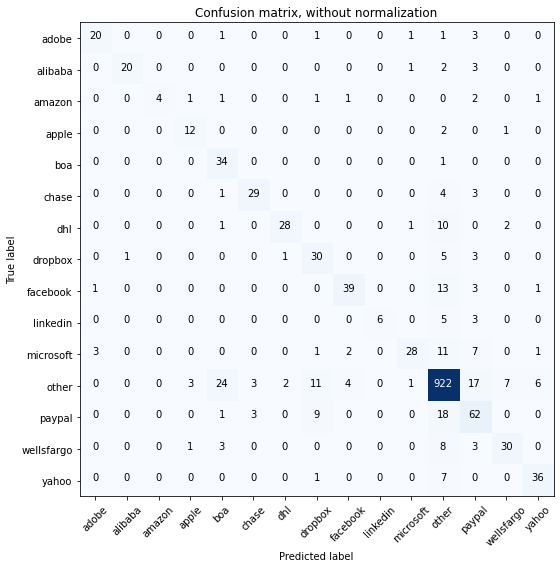

Acc     =  0.845
Pre     =  0.859
Rec     =  0.845
F1      =  0.845

Bal_Acc =  0.704
Bal_Pre =  0.803
Bal_Rec =  0.704
Bal_F1  =  0.75

              precision    recall  f1-score   support

       adobe       0.83      0.74      0.78        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.36      0.53        11
       apple       0.71      0.80      0.75        15
         boa       0.52      0.97      0.67        35
       chase       0.83      0.78      0.81        37
         dhl       0.90      0.67      0.77        42
     dropbox       0.56      0.75      0.64        40
    facebook       0.85      0.68      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.53      0.66        53
       other       0.91      0.92      0.92      1000
      paypal       0.57      0.67      0.61        93
  wellsfargo       0.75      0.67      0.71        45
       yahoo       0.80      0.82      0.81        4

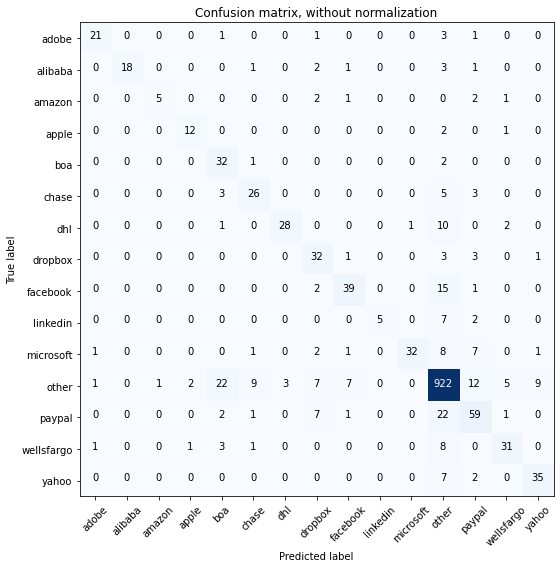

Acc     =  0.843
Pre     =  0.855
Rec     =  0.843
F1      =  0.843

Bal_Acc =  0.7
Bal_Pre =  0.796
Bal_Rec =  0.7
Bal_F1  =  0.745

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       1.00      0.69      0.82        26
      amazon       0.83      0.45      0.59        11
       apple       0.80      0.80      0.80        15
         boa       0.50      0.91      0.65        35
       chase       0.65      0.70      0.68        37
         dhl       0.90      0.67      0.77        42
     dropbox       0.58      0.80      0.67        40
    facebook       0.76      0.68      0.72        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.97      0.60      0.74        53
       other       0.91      0.92      0.91      1000
      paypal       0.63      0.63      0.63        93
  wellsfargo       0.76      0.69      0.72        45
       yahoo       0.76      0.80      0.78        44



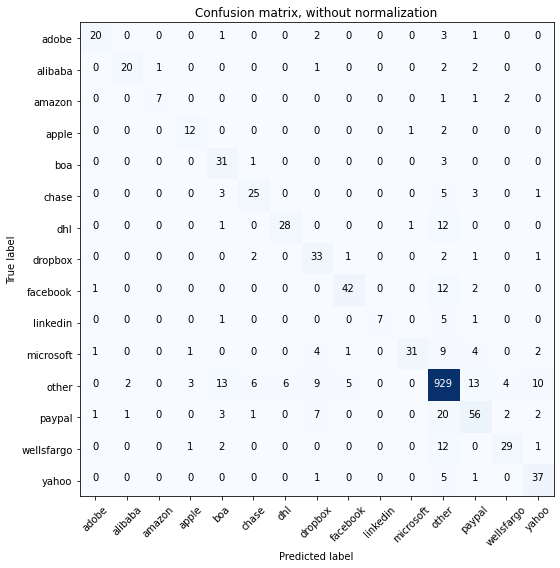

Acc     =  0.849
Pre     =  0.857
Rec     =  0.849
F1      =  0.848

Bal_Acc =  0.723
Bal_Pre =  0.789
Bal_Rec =  0.723
Bal_F1  =  0.755

              precision    recall  f1-score   support

       adobe       0.87      0.74      0.80        27
     alibaba       0.87      0.77      0.82        26
      amazon       0.88      0.64      0.74        11
       apple       0.71      0.80      0.75        15
         boa       0.56      0.89      0.69        35
       chase       0.71      0.68      0.69        37
         dhl       0.82      0.67      0.74        42
     dropbox       0.58      0.82      0.68        40
    facebook       0.86      0.74      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.58      0.72        53
       other       0.91      0.93      0.92      1000
      paypal       0.66      0.60      0.63        93
  wellsfargo       0.78      0.64      0.71        45
       yahoo       0.69      0.84      0.76        

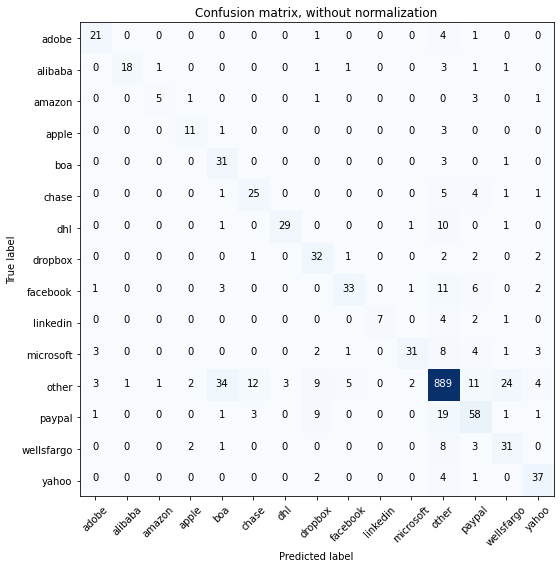

Acc     =  0.817
Pre     =  0.839
Rec     =  0.817
F1      =  0.822

Bal_Acc =  0.694
Bal_Pre =  0.734
Bal_Rec =  0.694
Bal_F1  =  0.713

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.69      0.80        26
      amazon       0.71      0.45      0.56        11
       apple       0.69      0.73      0.71        15
         boa       0.42      0.89      0.57        35
       chase       0.61      0.68      0.64        37
         dhl       0.91      0.69      0.78        42
     dropbox       0.56      0.80      0.66        40
    facebook       0.80      0.58      0.67        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.91      0.89      0.90      1000
      paypal       0.60      0.62      0.61        93
  wellsfargo       0.50      0.69      0.58        45
       yahoo       0.73      0.84      0.78        

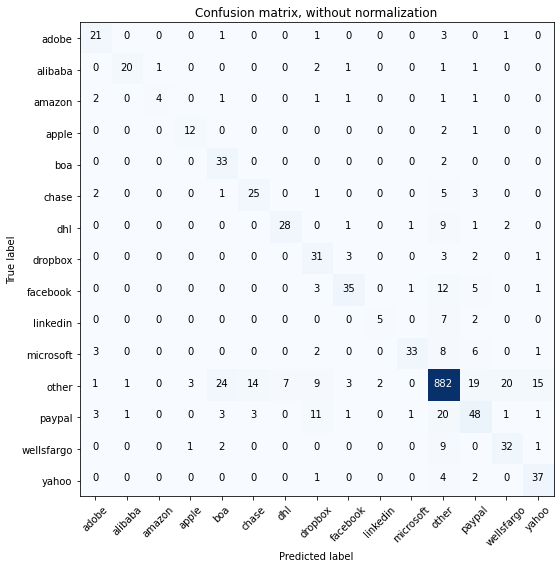

Acc     =  0.81
Pre     =  0.827
Rec     =  0.81
F1      =  0.812

Bal_Acc =  0.688
Bal_Pre =  0.706
Bal_Rec =  0.688
Bal_F1  =  0.697

              precision    recall  f1-score   support

       adobe       0.66      0.78      0.71        27
     alibaba       0.91      0.77      0.83        26
      amazon       0.80      0.36      0.50        11
       apple       0.75      0.80      0.77        15
         boa       0.51      0.94      0.66        35
       chase       0.60      0.68      0.63        37
         dhl       0.80      0.67      0.73        42
     dropbox       0.50      0.78      0.61        40
    facebook       0.78      0.61      0.69        57
    linkedin       0.71      0.36      0.48        14
   microsoft       0.92      0.62      0.74        53
       other       0.91      0.88      0.90      1000
      paypal       0.53      0.52      0.52        93
  wellsfargo       0.57      0.71      0.63        45
       yahoo       0.65      0.84      0.73        44

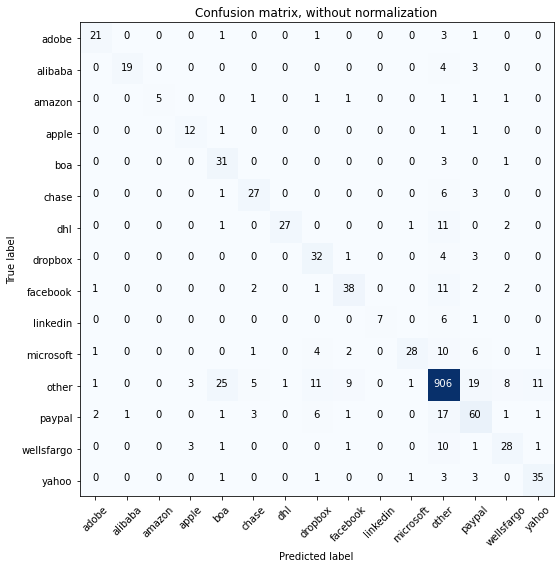

Acc     =  0.829
Pre     =  0.845
Rec     =  0.829
F1      =  0.831

Bal_Acc =  0.699
Bal_Pre =  0.774
Bal_Rec =  0.699
Bal_F1  =  0.735

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.45      0.62        11
       apple       0.67      0.80      0.73        15
         boa       0.49      0.89      0.63        35
       chase       0.69      0.73      0.71        37
         dhl       0.96      0.64      0.77        42
     dropbox       0.56      0.80      0.66        40
    facebook       0.72      0.67      0.69        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.53      0.67        53
       other       0.91      0.91      0.91      1000
      paypal       0.58      0.65      0.61        93
  wellsfargo       0.65      0.62      0.64        45
       yahoo       0.71      0.80      0.75        

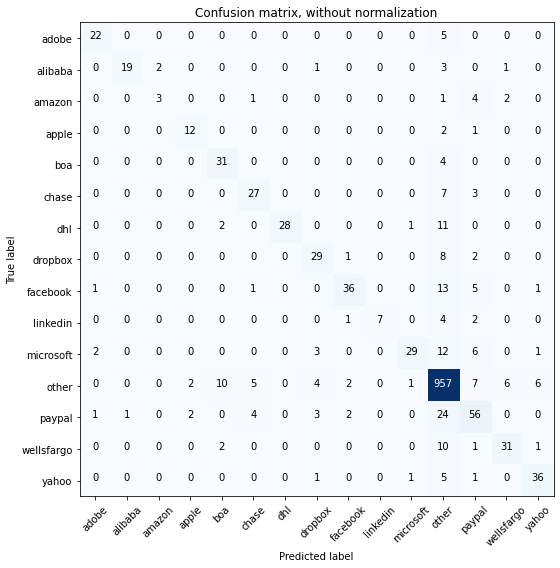

Acc     =  0.86
Pre     =  0.86
Rec     =  0.86
F1      =  0.854

Bal_Acc =  0.691
Bal_Pre =  0.808
Bal_Rec =  0.691
Bal_F1  =  0.745

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.60      0.27      0.37        11
       apple       0.75      0.80      0.77        15
         boa       0.69      0.89      0.78        35
       chase       0.71      0.73      0.72        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.71      0.72      0.72        40
    facebook       0.86      0.63      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.90      0.96      0.93      1000
      paypal       0.64      0.60      0.62        93
  wellsfargo       0.78      0.69      0.73        45
       yahoo       0.80      0.82      0.81        44


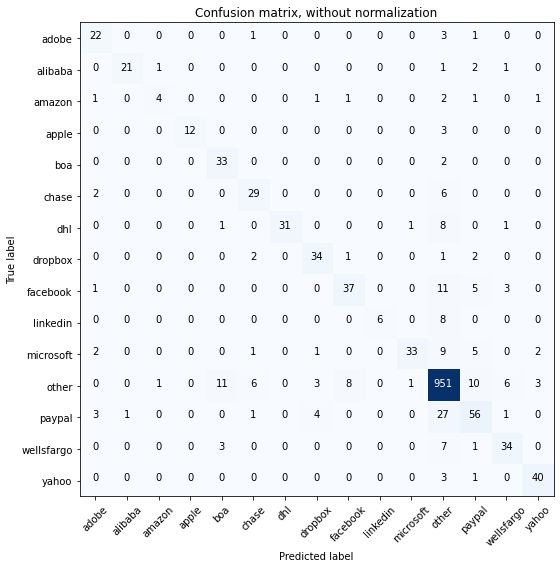

Acc     =  0.873
Pre     =  0.875
Rec     =  0.873
F1      =  0.869

Bal_Acc =  0.735
Bal_Pre =  0.83
Bal_Rec =  0.735
Bal_F1  =  0.78

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.80      0.89        15
         boa       0.69      0.94      0.80        35
       chase       0.72      0.78      0.75        37
         dhl       1.00      0.74      0.85        42
     dropbox       0.79      0.85      0.82        40
    facebook       0.79      0.65      0.71        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.62      0.75        53
       other       0.91      0.95      0.93      1000
      paypal       0.67      0.60      0.63        93
  wellsfargo       0.74      0.76      0.75        45
       yahoo       0.87      0.91      0.89        44

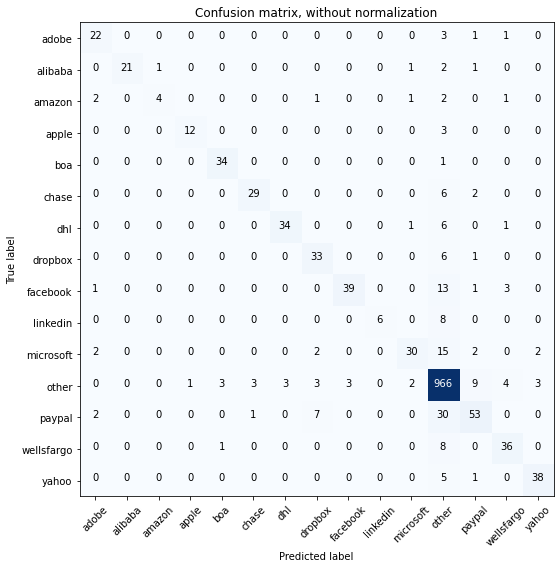

Acc     =  0.882
Pre     =  0.881
Rec     =  0.882
F1      =  0.876

Bal_Acc =  0.737
Bal_Pre =  0.866
Bal_Rec =  0.737
Bal_F1  =  0.796

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.80      0.36      0.50        11
       apple       0.92      0.80      0.86        15
         boa       0.89      0.97      0.93        35
       chase       0.88      0.78      0.83        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.72      0.82      0.77        40
    facebook       0.93      0.68      0.79        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.86      0.57      0.68        53
       other       0.90      0.97      0.93      1000
      paypal       0.75      0.57      0.65        93
  wellsfargo       0.78      0.80      0.79        45
       yahoo       0.88      0.86      0.87        

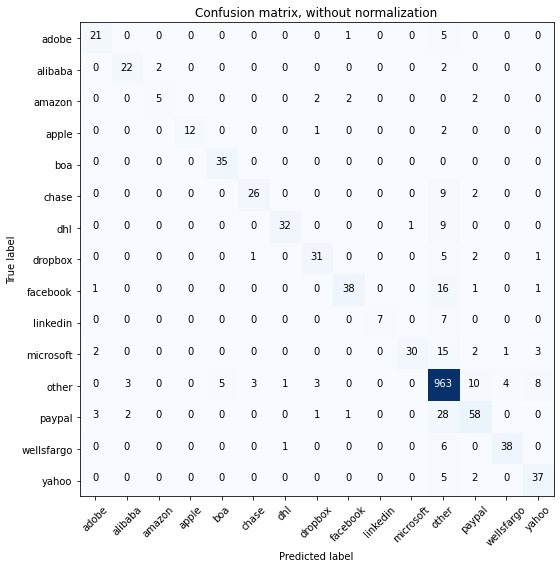

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.742
Bal_Pre =  0.862
Bal_Rec =  0.742
Bal_F1  =  0.798

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       0.81      0.85      0.83        26
      amazon       0.71      0.45      0.56        11
       apple       1.00      0.80      0.89        15
         boa       0.88      1.00      0.93        35
       chase       0.87      0.70      0.78        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.82      0.78      0.79        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.97      0.57      0.71        53
       other       0.90      0.96      0.93      1000
      paypal       0.73      0.62      0.67        93
  wellsfargo       0.88      0.84      0.86        45
       yahoo       0.74      0.84      0.79        44

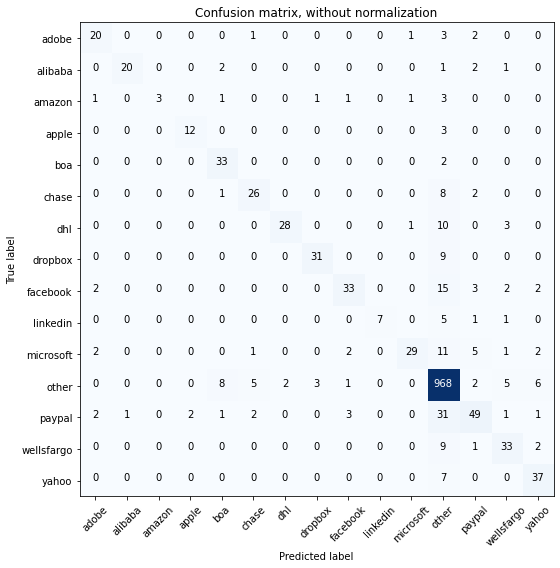

Acc     =  0.864
Pre     =  0.864
Rec     =  0.864
F1      =  0.856

Bal_Acc =  0.691
Bal_Pre =  0.842
Bal_Rec =  0.691
Bal_F1  =  0.759

              precision    recall  f1-score   support

       adobe       0.74      0.74      0.74        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       0.86      0.80      0.83        15
         boa       0.72      0.94      0.81        35
       chase       0.74      0.70      0.72        37
         dhl       0.93      0.67      0.78        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.82      0.58      0.68        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.97      0.93      1000
      paypal       0.73      0.53      0.61        93
  wellsfargo       0.70      0.73      0.72        45
       yahoo       0.74      0.84      0.79        

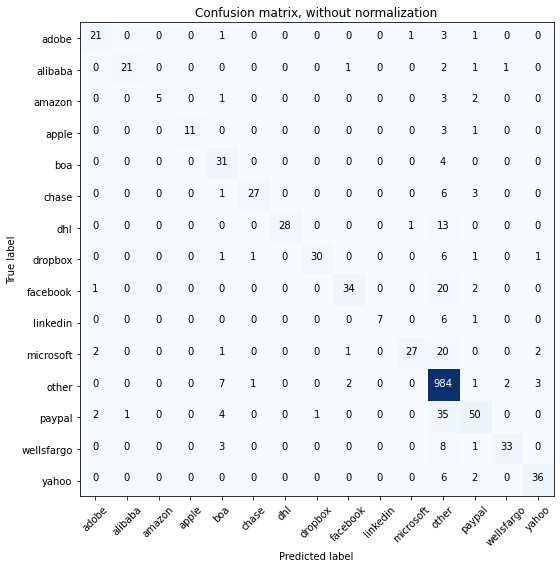

Acc     =  0.874
Pre     =  0.879
Rec     =  0.874
F1      =  0.866

Bal_Acc =  0.699
Bal_Pre =  0.901
Bal_Rec =  0.699
Bal_F1  =  0.787

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       1.00      0.45      0.62        11
       apple       1.00      0.73      0.85        15
         boa       0.62      0.89      0.73        35
       chase       0.93      0.73      0.82        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.97      0.75      0.85        40
    facebook       0.89      0.60      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.93      0.51      0.66        53
       other       0.88      0.98      0.93      1000
      paypal       0.76      0.54      0.63        93
  wellsfargo       0.92      0.73      0.81        45
       yahoo       0.86      0.82      0.84        

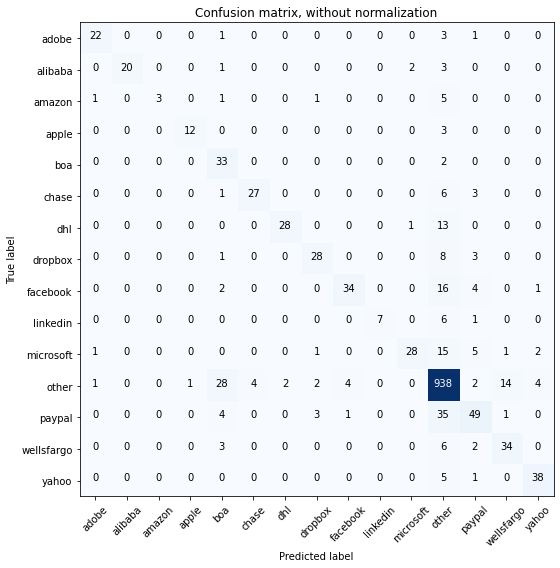

Acc     =  0.845
Pre     =  0.857
Rec     =  0.845
F1      =  0.842

Bal_Acc =  0.694
Bal_Pre =  0.848
Bal_Rec =  0.694
Bal_F1  =  0.763

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.44      0.94      0.60        35
       chase       0.87      0.73      0.79        37
         dhl       0.93      0.67      0.78        42
     dropbox       0.80      0.70      0.75        40
    facebook       0.87      0.60      0.71        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.90      0.53      0.67        53
       other       0.88      0.94      0.91      1000
      paypal       0.69      0.53      0.60        93
  wellsfargo       0.68      0.76      0.72        45
       yahoo       0.84      0.86      0.85        

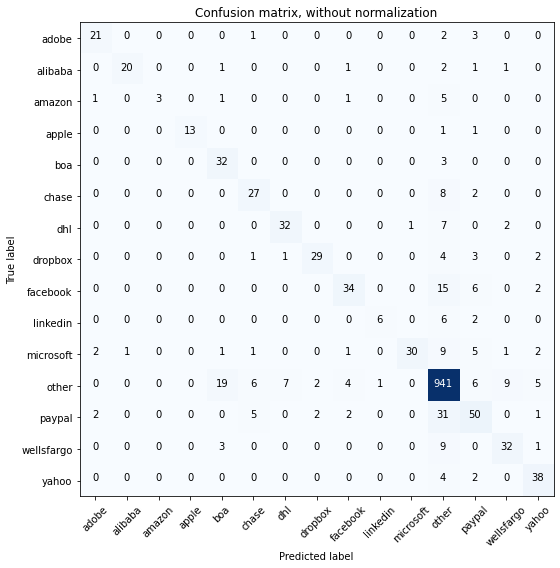

Acc     =  0.85
Pre     =  0.854
Rec     =  0.85
F1      =  0.846

Bal_Acc =  0.697
Bal_Pre =  0.816
Bal_Rec =  0.697
Bal_F1  =  0.752

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.87      0.93        15
         boa       0.56      0.91      0.70        35
       chase       0.66      0.73      0.69        37
         dhl       0.80      0.76      0.78        42
     dropbox       0.88      0.72      0.79        40
    facebook       0.79      0.60      0.68        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.97      0.57      0.71        53
       other       0.90      0.94      0.92      1000
      paypal       0.62      0.54      0.57        93
  wellsfargo       0.71      0.71      0.71        45
       yahoo       0.75      0.86      0.80        44

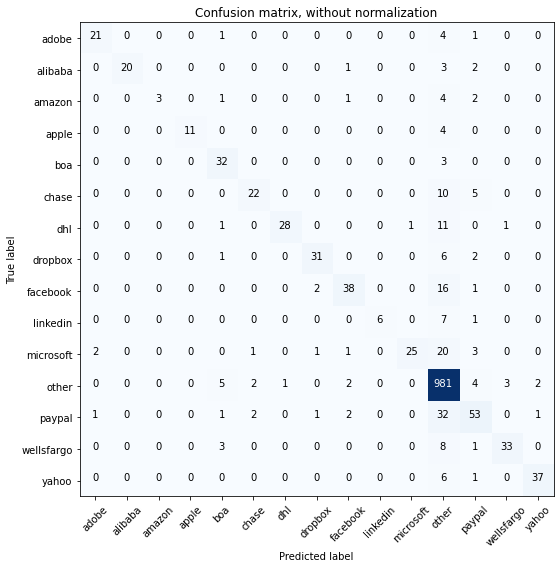

Acc     =  0.871
Pre     =  0.874
Rec     =  0.871
F1      =  0.862

Bal_Acc =  0.68
Bal_Pre =  0.897
Bal_Rec =  0.68
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.88      0.78      0.82        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.73      0.85        15
         boa       0.71      0.91      0.80        35
       chase       0.81      0.59      0.69        37
         dhl       0.97      0.67      0.79        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.96      0.47      0.63        53
       other       0.88      0.98      0.93      1000
      paypal       0.70      0.57      0.63        93
  wellsfargo       0.89      0.73      0.80        45
       yahoo       0.93      0.84      0.88        44

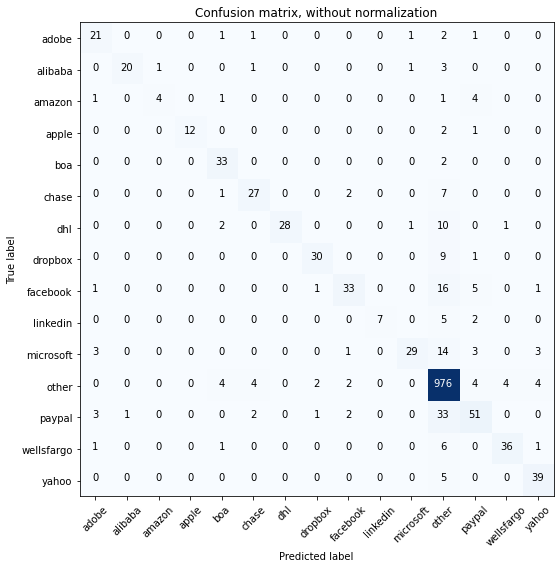

Acc     =  0.875
Pre     =  0.874
Rec     =  0.875
F1      =  0.867

Bal_Acc =  0.709
Bal_Pre =  0.86
Bal_Rec =  0.709
Bal_F1  =  0.777

              precision    recall  f1-score   support

       adobe       0.70      0.78      0.74        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.80      0.36      0.50        11
       apple       1.00      0.80      0.89        15
         boa       0.77      0.94      0.85        35
       chase       0.77      0.73      0.75        37
         dhl       1.00      0.67      0.80        42
     dropbox       0.88      0.75      0.81        40
    facebook       0.82      0.58      0.68        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.98      0.93      1000
      paypal       0.71      0.55      0.62        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.81      0.89      0.85        4

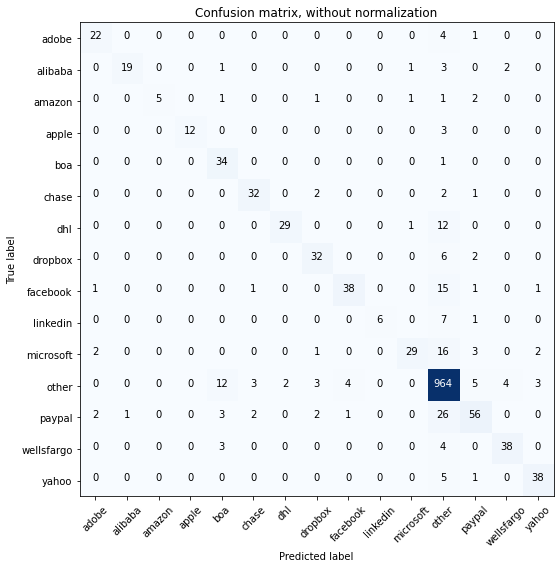

Acc     =  0.88
Pre     =  0.883
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.736
Bal_Pre =  0.876
Bal_Rec =  0.736
Bal_F1  =  0.8

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.45      0.62        11
       apple       1.00      0.80      0.89        15
         boa       0.63      0.97      0.76        35
       chase       0.84      0.86      0.85        37
         dhl       0.94      0.69      0.79        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.55      0.68        53
       other       0.90      0.96      0.93      1000
      paypal       0.77      0.60      0.67        93
  wellsfargo       0.86      0.84      0.85        45
       yahoo       0.86      0.86      0.86        44



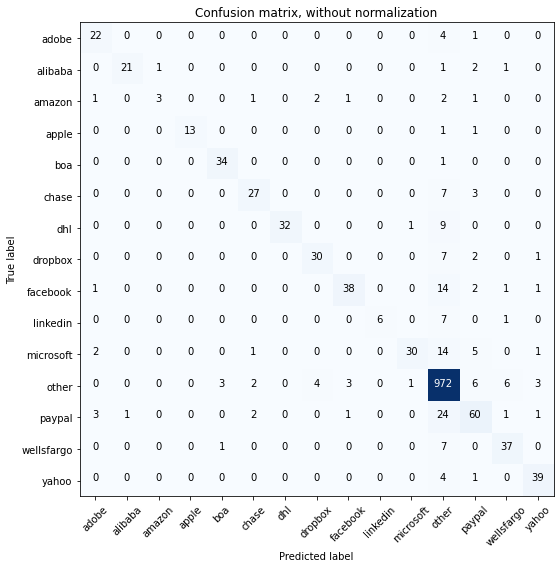

Acc     =  0.886
Pre     =  0.886
Rec     =  0.886
F1      =  0.881

Bal_Acc =  0.731
Bal_Pre =  0.872
Bal_Rec =  0.731
Bal_F1  =  0.795

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.87      0.93        15
         boa       0.89      0.97      0.93        35
       chase       0.82      0.73      0.77        37
         dhl       1.00      0.76      0.86        42
     dropbox       0.83      0.75      0.79        40
    facebook       0.88      0.67      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.97      0.94      1000
      paypal       0.71      0.65      0.68        93
  wellsfargo       0.79      0.82      0.80        45
       yahoo       0.85      0.89      0.87        

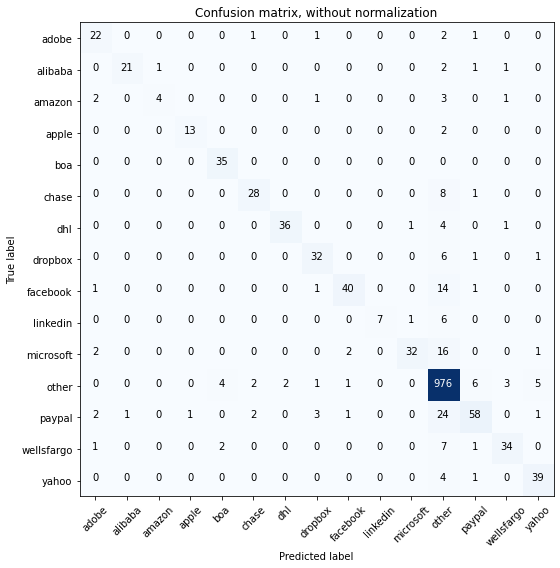

Acc     =  0.895
Pre     =  0.894
Rec     =  0.895
F1      =  0.889

Bal_Acc =  0.754
Bal_Pre =  0.876
Bal_Rec =  0.754
Bal_F1  =  0.81

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.85      1.00      0.92        35
       chase       0.85      0.76      0.80        37
         dhl       0.95      0.86      0.90        42
     dropbox       0.82      0.80      0.81        40
    facebook       0.91      0.70      0.79        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.60      0.74        53
       other       0.91      0.98      0.94      1000
      paypal       0.82      0.62      0.71        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.83      0.89      0.86        4

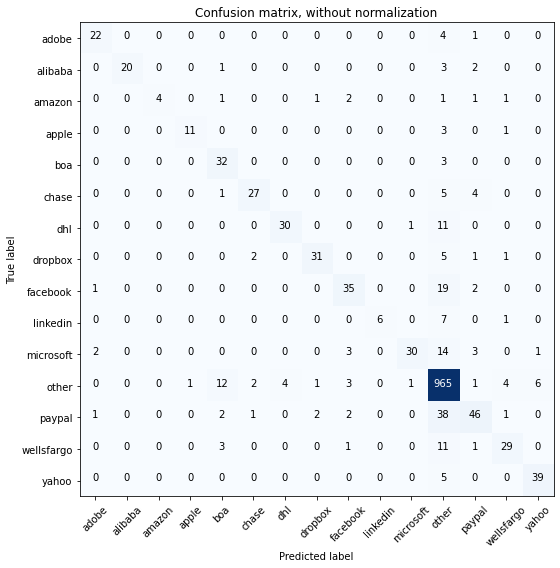

Acc     =  0.862
Pre     =  0.863
Rec     =  0.862
F1      =  0.854

Bal_Acc =  0.694
Bal_Pre =  0.862
Bal_Rec =  0.694
Bal_F1  =  0.769

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.36      0.53        11
       apple       0.92      0.73      0.81        15
         boa       0.62      0.91      0.74        35
       chase       0.84      0.73      0.78        37
         dhl       0.88      0.71      0.79        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.76      0.61      0.68        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.57      0.71        53
       other       0.88      0.96      0.92      1000
      paypal       0.74      0.49      0.59        93
  wellsfargo       0.76      0.64      0.70        45
       yahoo       0.85      0.89      0.87        

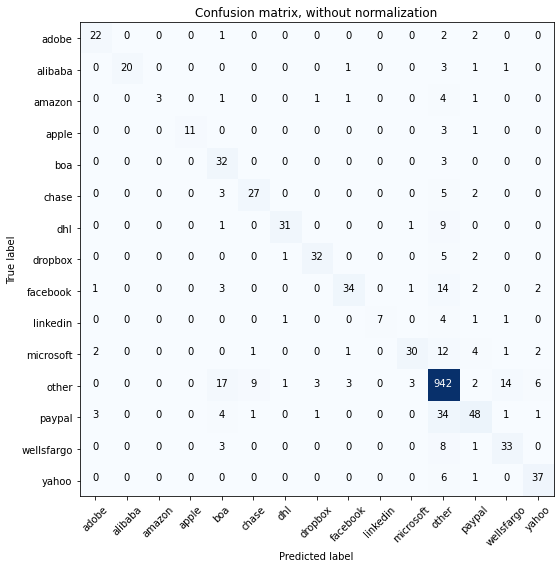

Acc     =  0.851
Pre     =  0.858
Rec     =  0.851
F1      =  0.846

Bal_Acc =  0.698
Bal_Pre =  0.833
Bal_Rec =  0.698
Bal_F1  =  0.76

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.73      0.85        15
         boa       0.49      0.91      0.64        35
       chase       0.71      0.73      0.72        37
         dhl       0.91      0.74      0.82        42
     dropbox       0.86      0.80      0.83        40
    facebook       0.85      0.60      0.70        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.86      0.57      0.68        53
       other       0.89      0.94      0.92      1000
      paypal       0.71      0.52      0.60        93
  wellsfargo       0.65      0.73      0.69        45
       yahoo       0.77      0.84      0.80        4

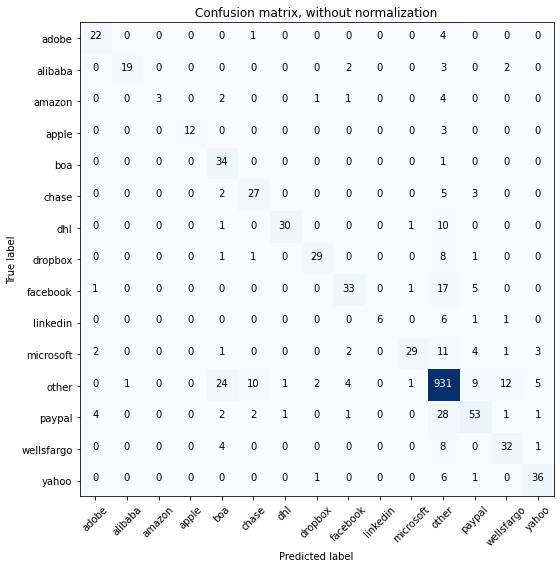

Acc     =  0.842
Pre     =  0.852
Rec     =  0.842
F1      =  0.839

Bal_Acc =  0.69
Bal_Pre =  0.823
Bal_Rec =  0.69
Bal_F1  =  0.751

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.73      0.83        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.48      0.97      0.64        35
       chase       0.66      0.73      0.69        37
         dhl       0.94      0.71      0.81        42
     dropbox       0.88      0.72      0.79        40
    facebook       0.77      0.58      0.66        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.93      0.91      1000
      paypal       0.69      0.57      0.62        93
  wellsfargo       0.65      0.71      0.68        45
       yahoo       0.78      0.82      0.80        44

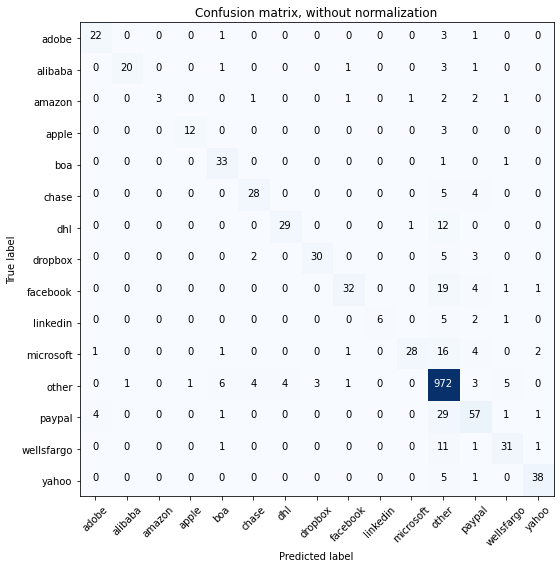

Acc     =  0.871
Pre     =  0.872
Rec     =  0.871
F1      =  0.864

Bal_Acc =  0.697
Bal_Pre =  0.871
Bal_Rec =  0.697
Bal_F1  =  0.774

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.75      0.94      0.84        35
       chase       0.80      0.76      0.78        37
         dhl       0.88      0.69      0.77        42
     dropbox       0.91      0.75      0.82        40
    facebook       0.89      0.56      0.69        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.93      0.53      0.67        53
       other       0.89      0.97      0.93      1000
      paypal       0.69      0.61      0.65        93
  wellsfargo       0.76      0.69      0.72        45
       yahoo       0.88      0.86      0.87        

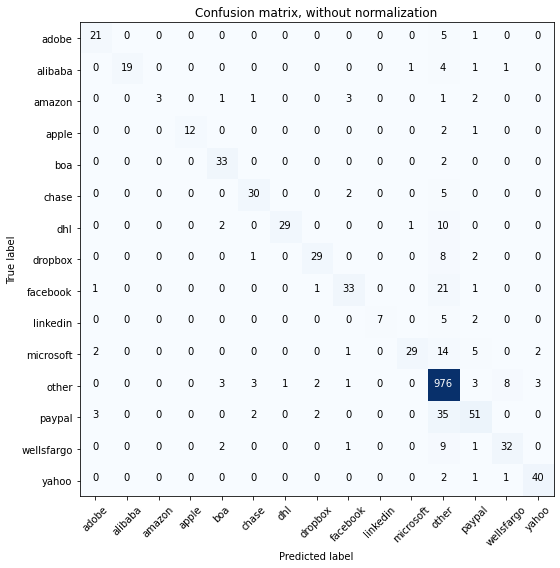

Acc     =  0.873
Pre     =  0.873
Rec     =  0.873
F1      =  0.865

Bal_Acc =  0.701
Bal_Pre =  0.881
Bal_Rec =  0.701
Bal_F1  =  0.781

              precision    recall  f1-score   support

       adobe       0.78      0.78      0.78        27
     alibaba       1.00      0.73      0.84        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.80      0.89        15
         boa       0.80      0.94      0.87        35
       chase       0.81      0.81      0.81        37
         dhl       0.97      0.69      0.81        42
     dropbox       0.85      0.72      0.78        40
    facebook       0.80      0.58      0.67        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.55      0.69        53
       other       0.89      0.98      0.93      1000
      paypal       0.72      0.55      0.62        93
  wellsfargo       0.76      0.71      0.74        45
       yahoo       0.89      0.91      0.90        

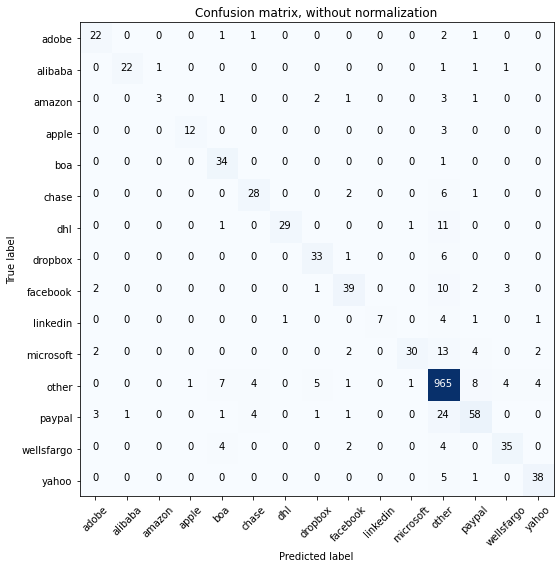

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.731
Bal_Pre =  0.843
Bal_Rec =  0.731
Bal_F1  =  0.783

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.80      0.86        15
         boa       0.69      0.97      0.81        35
       chase       0.76      0.76      0.76        37
         dhl       0.97      0.69      0.81        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.80      0.68      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.57      0.71        53
       other       0.91      0.96      0.94      1000
      paypal       0.74      0.62      0.68        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.84      0.86      0.85        44

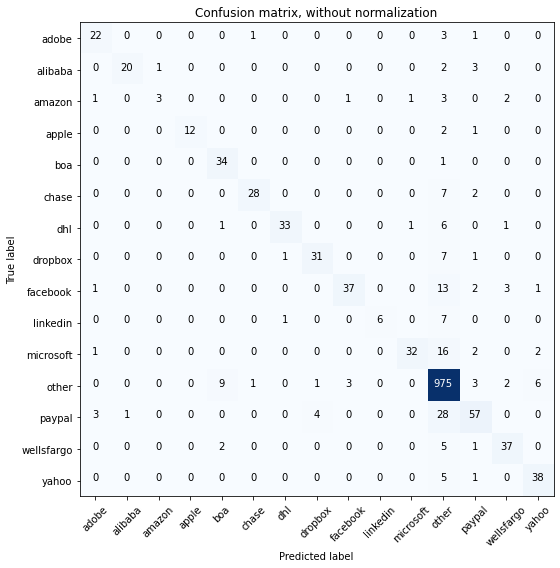

Acc     =  0.887
Pre     =  0.888
Rec     =  0.887
F1      =  0.881

Bal_Acc =  0.727
Bal_Pre =  0.874
Bal_Rec =  0.727
Bal_F1  =  0.794

              precision    recall  f1-score   support

       adobe       0.79      0.81      0.80        27
     alibaba       0.95      0.77      0.85        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.74      0.97      0.84        35
       chase       0.93      0.76      0.84        37
         dhl       0.94      0.79      0.86        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.90      0.65      0.76        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.94      0.60      0.74        53
       other       0.90      0.97      0.94      1000
      paypal       0.77      0.61      0.68        93
  wellsfargo       0.82      0.82      0.82        45
       yahoo       0.81      0.86      0.84        

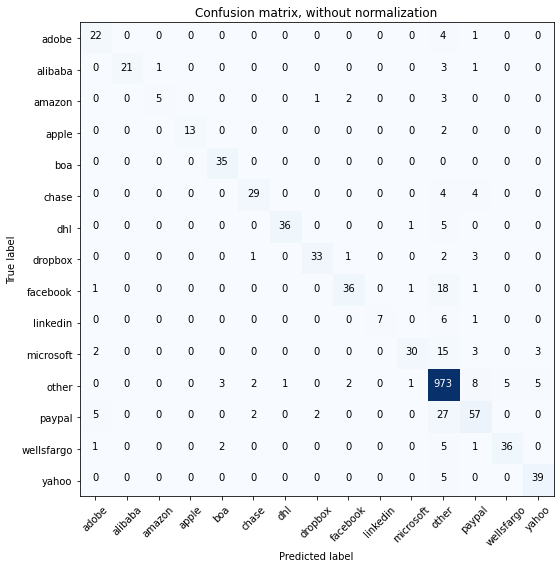

Acc     =  0.891
Pre     =  0.891
Rec     =  0.891
F1      =  0.886

Bal_Acc =  0.759
Bal_Pre =  0.885
Bal_Rec =  0.759
Bal_F1  =  0.817

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.88      1.00      0.93        35
       chase       0.85      0.78      0.82        37
         dhl       0.97      0.86      0.91        42
     dropbox       0.92      0.82      0.87        40
    facebook       0.88      0.63      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.97      0.94      1000
      paypal       0.71      0.61      0.66        93
  wellsfargo       0.88      0.80      0.84        45
       yahoo       0.83      0.89      0.86        

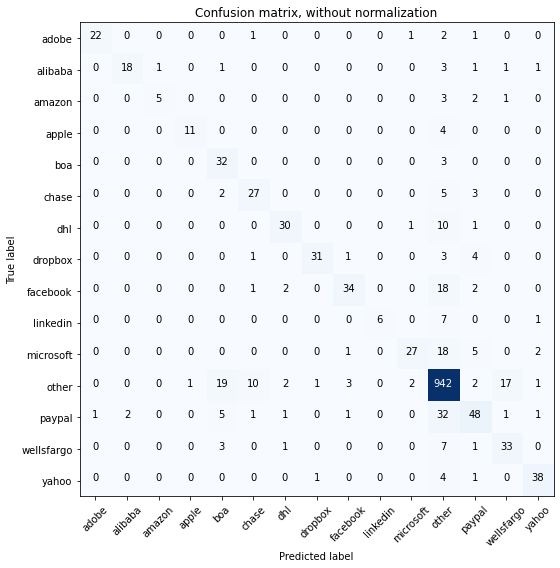

Acc     =  0.847
Pre     =  0.853
Rec     =  0.847
F1      =  0.843

Bal_Acc =  0.695
Bal_Pre =  0.822
Bal_Rec =  0.695
Bal_F1  =  0.753

              precision    recall  f1-score   support

       adobe       0.96      0.81      0.88        27
     alibaba       0.90      0.69      0.78        26
      amazon       0.83      0.45      0.59        11
       apple       0.92      0.73      0.81        15
         boa       0.52      0.91      0.66        35
       chase       0.66      0.73      0.69        37
         dhl       0.83      0.71      0.77        42
     dropbox       0.94      0.78      0.85        40
    facebook       0.85      0.60      0.70        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.87      0.51      0.64        53
       other       0.89      0.94      0.91      1000
      paypal       0.68      0.52      0.59        93
  wellsfargo       0.62      0.73      0.67        45
       yahoo       0.86      0.86      0.86        

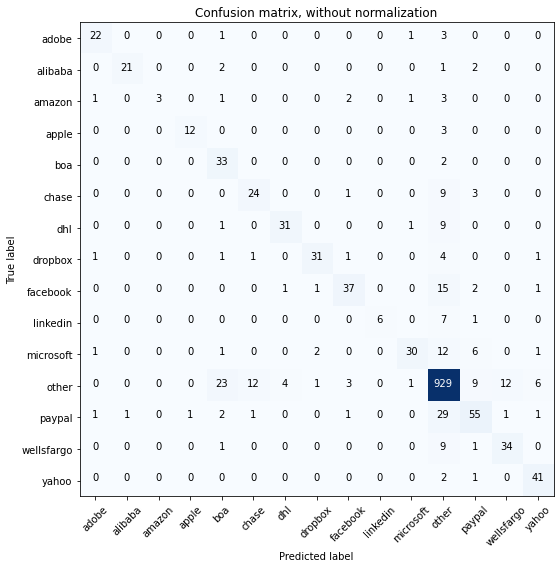

Acc     =  0.851
Pre     =  0.858
Rec     =  0.851
F1      =  0.848

Bal_Acc =  0.71
Bal_Pre =  0.828
Bal_Rec =  0.71
Bal_F1  =  0.764

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.81      0.88        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.50      0.94      0.65        35
       chase       0.63      0.65      0.64        37
         dhl       0.86      0.74      0.79        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.57      0.69        53
       other       0.90      0.93      0.91      1000
      paypal       0.69      0.59      0.64        93
  wellsfargo       0.72      0.76      0.74        45
       yahoo       0.80      0.93      0.86        44

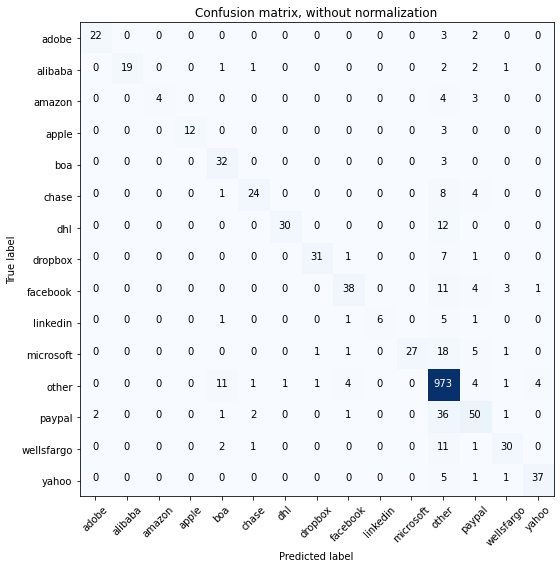

Acc     =  0.867
Pre     =  0.871
Rec     =  0.867
F1      =  0.86

Bal_Acc =  0.692
Bal_Pre =  0.888
Bal_Rec =  0.692
Bal_F1  =  0.778

              precision    recall  f1-score   support

       adobe       0.92      0.81      0.86        27
     alibaba       1.00      0.73      0.84        26
      amazon       1.00      0.36      0.53        11
       apple       1.00      0.80      0.89        15
         boa       0.65      0.91      0.76        35
       chase       0.83      0.65      0.73        37
         dhl       0.97      0.71      0.82        42
     dropbox       0.94      0.78      0.85        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       1.00      0.51      0.67        53
       other       0.88      0.97      0.93      1000
      paypal       0.64      0.54      0.58        93
  wellsfargo       0.79      0.67      0.72        45
       yahoo       0.88      0.84      0.86        4

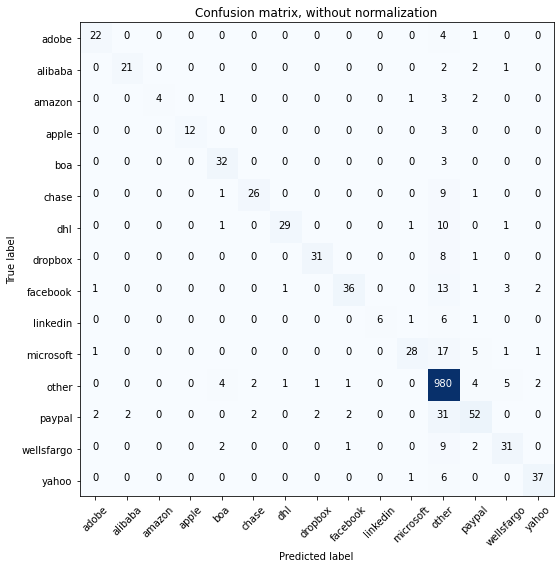

Acc     =  0.875
Pre     =  0.875
Rec     =  0.875
F1      =  0.867

Bal_Acc =  0.702
Bal_Pre =  0.884
Bal_Rec =  0.702
Bal_F1  =  0.783

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.91      0.81      0.86        26
      amazon       1.00      0.36      0.53        11
       apple       1.00      0.80      0.89        15
         boa       0.78      0.91      0.84        35
       chase       0.87      0.70      0.78        37
         dhl       0.94      0.69      0.79        42
     dropbox       0.91      0.78      0.84        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.88      0.53      0.66        53
       other       0.89      0.98      0.93      1000
      paypal       0.72      0.56      0.63        93
  wellsfargo       0.74      0.69      0.71        45
       yahoo       0.88      0.84      0.86        

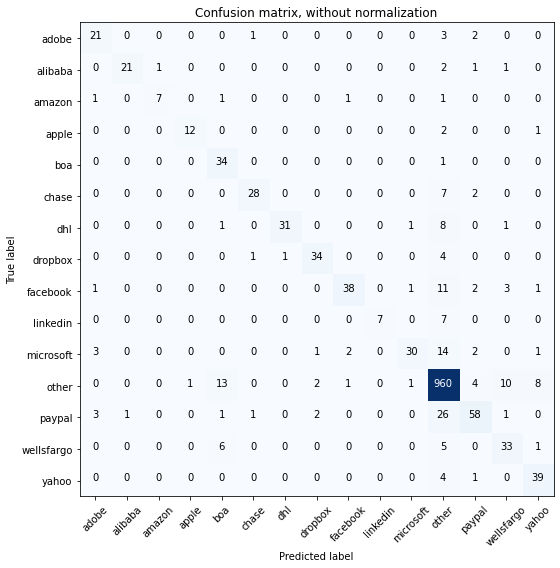

Acc     =  0.879
Pre     =  0.884
Rec     =  0.879
F1      =  0.876

Bal_Acc =  0.752
Bal_Pre =  0.853
Bal_Rec =  0.752
Bal_F1  =  0.799

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.88      0.64      0.74        11
       apple       0.92      0.80      0.86        15
         boa       0.61      0.97      0.75        35
       chase       0.90      0.76      0.82        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.87      0.85      0.86        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.96      0.93      1000
      paypal       0.81      0.62      0.70        93
  wellsfargo       0.67      0.73      0.70        45
       yahoo       0.76      0.89      0.82        

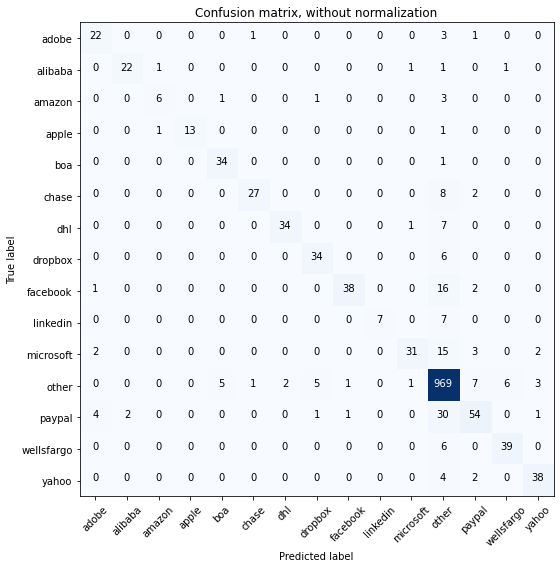

Acc     =  0.889
Pre     =  0.889
Rec     =  0.889
F1      =  0.884

Bal_Acc =  0.764
Bal_Pre =  0.881
Bal_Rec =  0.764
Bal_F1  =  0.818

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.92      0.85      0.88        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.85      0.97      0.91        35
       chase       0.93      0.73      0.82        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.83      0.85      0.84        40
    facebook       0.95      0.67      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.90      0.97      0.93      1000
      paypal       0.76      0.58      0.66        93
  wellsfargo       0.85      0.87      0.86        45
       yahoo       0.86      0.86      0.86        

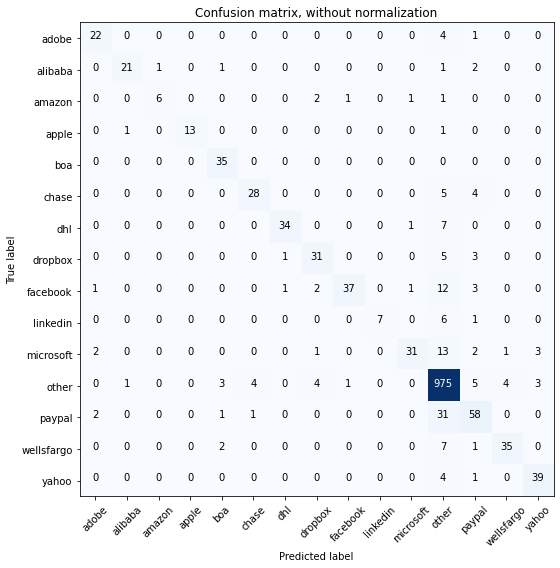

Acc     =  0.891
Pre     =  0.891
Rec     =  0.891
F1      =  0.887

Bal_Acc =  0.758
Bal_Pre =  0.881
Bal_Rec =  0.758
Bal_F1  =  0.815

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.86      0.55      0.67        11
       apple       1.00      0.87      0.93        15
         boa       0.83      1.00      0.91        35
       chase       0.85      0.76      0.80        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.78      0.78      0.78        40
    facebook       0.95      0.65      0.77        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.58      0.71        53
       other       0.91      0.97      0.94      1000
      paypal       0.72      0.62      0.67        93
  wellsfargo       0.88      0.78      0.82        45
       yahoo       0.87      0.89      0.88        

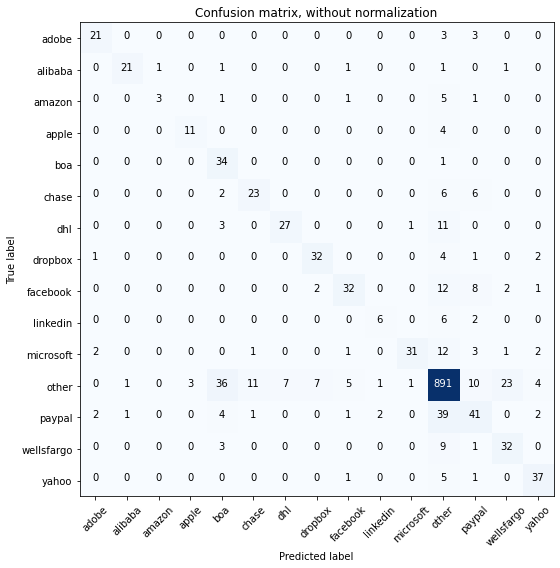

Acc     =  0.807
Pre     =  0.82
Rec     =  0.807
F1      =  0.807

Bal_Acc =  0.672
Bal_Pre =  0.731
Bal_Rec =  0.672
Bal_F1  =  0.7

              precision    recall  f1-score   support

       adobe       0.81      0.78      0.79        27
     alibaba       0.91      0.81      0.86        26
      amazon       0.75      0.27      0.40        11
       apple       0.79      0.73      0.76        15
         boa       0.40      0.97      0.57        35
       chase       0.64      0.62      0.63        37
         dhl       0.79      0.64      0.71        42
     dropbox       0.78      0.80      0.79        40
    facebook       0.76      0.56      0.65        57
    linkedin       0.67      0.43      0.52        14
   microsoft       0.94      0.58      0.72        53
       other       0.88      0.89      0.89      1000
      paypal       0.53      0.44      0.48        93
  wellsfargo       0.54      0.71      0.62        45
       yahoo       0.77      0.84      0.80        44


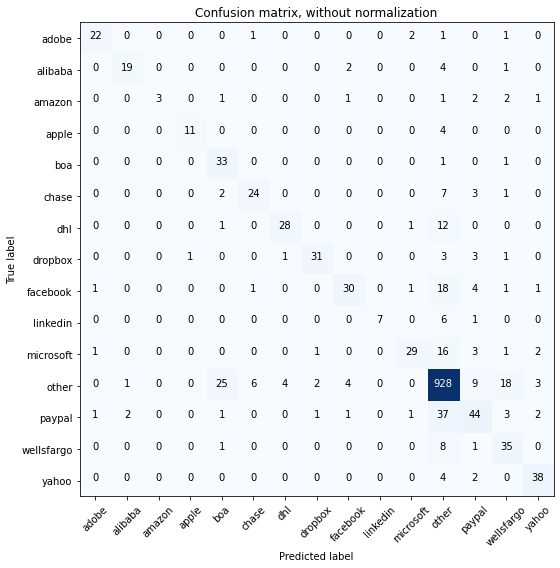

Acc     =  0.833
Pre     =  0.84
Rec     =  0.833
F1      =  0.828

Bal_Acc =  0.68
Bal_Pre =  0.81
Bal_Rec =  0.68
Bal_F1  =  0.739

              precision    recall  f1-score   support

       adobe       0.88      0.81      0.85        27
     alibaba       0.86      0.73      0.79        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.73      0.81        15
         boa       0.52      0.94      0.67        35
       chase       0.75      0.65      0.70        37
         dhl       0.85      0.67      0.75        42
     dropbox       0.89      0.78      0.83        40
    facebook       0.79      0.53      0.63        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.85      0.55      0.67        53
       other       0.88      0.93      0.91      1000
      paypal       0.61      0.47      0.53        93
  wellsfargo       0.54      0.78      0.64        45
       yahoo       0.81      0.86      0.84        44



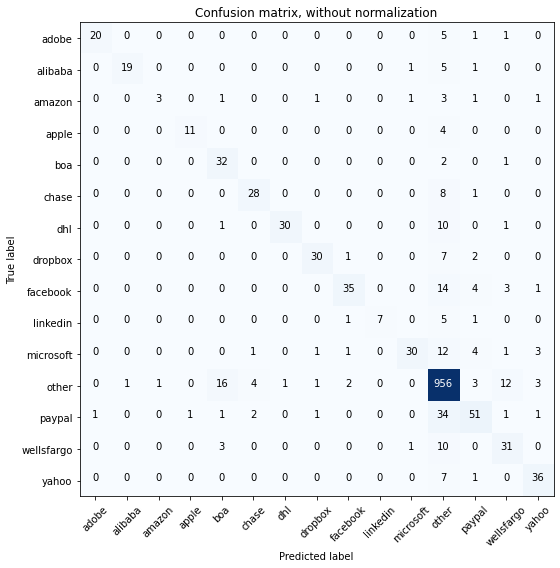

Acc     =  0.857
Pre     =  0.861
Rec     =  0.857
F1      =  0.851

Bal_Acc =  0.687
Bal_Pre =  0.841
Bal_Rec =  0.687
Bal_F1  =  0.756

              precision    recall  f1-score   support

       adobe       0.95      0.74      0.83        27
     alibaba       0.95      0.73      0.83        26
      amazon       0.75      0.27      0.40        11
       apple       0.92      0.73      0.81        15
         boa       0.59      0.91      0.72        35
       chase       0.80      0.76      0.78        37
         dhl       0.97      0.71      0.82        42
     dropbox       0.88      0.75      0.81        40
    facebook       0.88      0.61      0.72        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.88      0.96      0.92      1000
      paypal       0.73      0.55      0.63        93
  wellsfargo       0.61      0.69      0.65        45
       yahoo       0.80      0.82      0.81        

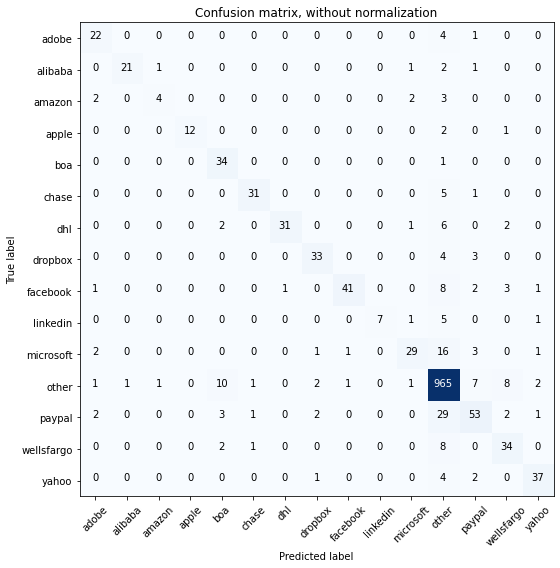

Acc     =  0.88
Pre     =  0.881
Rec     =  0.88
F1      =  0.875

Bal_Acc =  0.737
Bal_Pre =  0.847
Bal_Rec =  0.737
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.80      0.89        15
         boa       0.67      0.97      0.79        35
       chase       0.91      0.84      0.87        37
         dhl       0.97      0.74      0.84        42
     dropbox       0.85      0.82      0.84        40
    facebook       0.95      0.72      0.82        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.83      0.55      0.66        53
       other       0.91      0.96      0.94      1000
      paypal       0.73      0.57      0.64        93
  wellsfargo       0.68      0.76      0.72        45
       yahoo       0.86      0.84      0.85        44

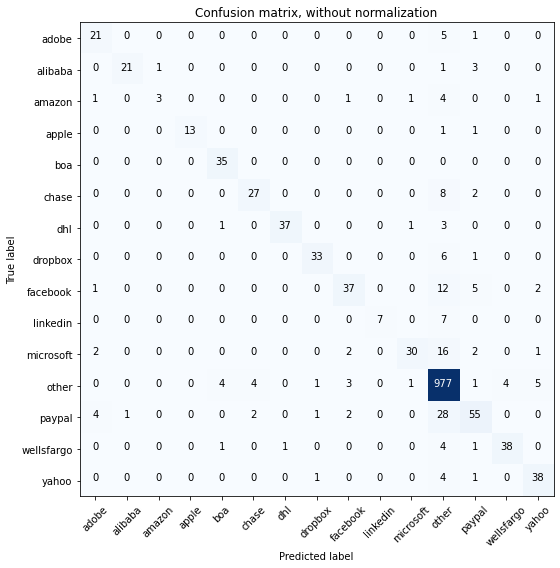

Acc     =  0.891
Pre     =  0.889
Rec     =  0.891
F1      =  0.885

Bal_Acc =  0.743
Bal_Pre =  0.873
Bal_Rec =  0.743
Bal_F1  =  0.803

              precision    recall  f1-score   support

       adobe       0.72      0.78      0.75        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.87      0.93        15
         boa       0.85      1.00      0.92        35
       chase       0.82      0.73      0.77        37
         dhl       0.97      0.88      0.93        42
     dropbox       0.92      0.82      0.87        40
    facebook       0.82      0.65      0.73        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.91      0.57      0.70        53
       other       0.91      0.98      0.94      1000
      paypal       0.75      0.59      0.66        93
  wellsfargo       0.90      0.84      0.87        45
       yahoo       0.81      0.86      0.84        

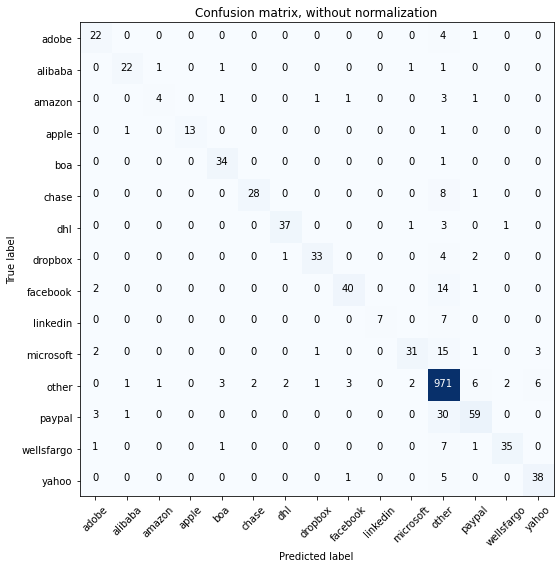

Acc     =  0.893
Pre     =  0.892
Rec     =  0.893
F1      =  0.888

Bal_Acc =  0.757
Bal_Pre =  0.875
Bal_Rec =  0.757
Bal_F1  =  0.812

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.88      0.85      0.86        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.85      0.97      0.91        35
       chase       0.93      0.76      0.84        37
         dhl       0.93      0.88      0.90        42
     dropbox       0.92      0.82      0.87        40
    facebook       0.89      0.70      0.78        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.90      0.97      0.94      1000
      paypal       0.81      0.63      0.71        93
  wellsfargo       0.92      0.78      0.84        45
       yahoo       0.81      0.86      0.84        

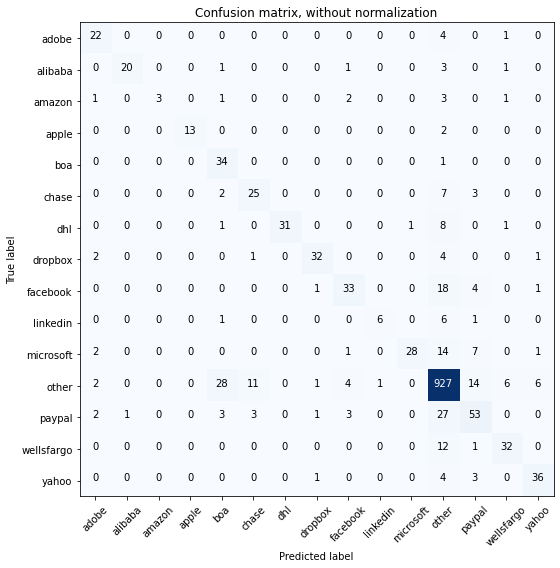

Acc     =  0.841
Pre     =  0.852
Rec     =  0.841
F1      =  0.839

Bal_Acc =  0.698
Bal_Pre =  0.82
Bal_Rec =  0.698
Bal_F1  =  0.754

              precision    recall  f1-score   support

       adobe       0.71      0.81      0.76        27
     alibaba       0.95      0.77      0.85        26
      amazon       1.00      0.27      0.43        11
       apple       1.00      0.87      0.93        15
         boa       0.48      0.97      0.64        35
       chase       0.62      0.68      0.65        37
         dhl       1.00      0.74      0.85        42
     dropbox       0.89      0.80      0.84        40
    facebook       0.75      0.58      0.65        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.97      0.53      0.68        53
       other       0.89      0.93      0.91      1000
      paypal       0.62      0.57      0.59        93
  wellsfargo       0.76      0.71      0.74        45
       yahoo       0.80      0.82      0.81        4

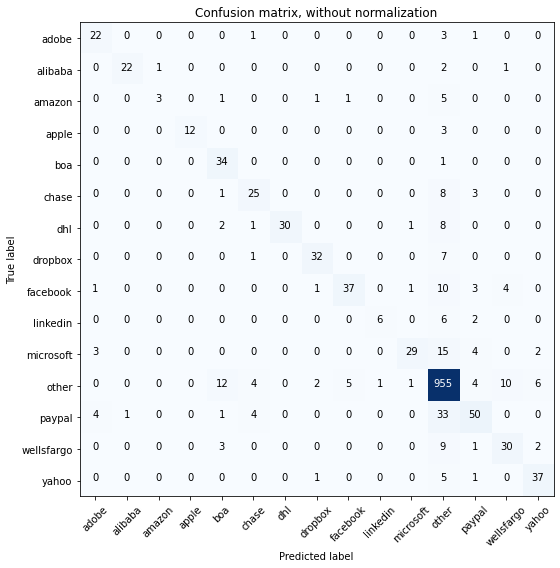

Acc     =  0.86
Pre     =  0.862
Rec     =  0.86
F1      =  0.854

Bal_Acc =  0.701
Bal_Pre =  0.822
Bal_Rec =  0.701
Bal_F1  =  0.757

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.80      0.89        15
         boa       0.63      0.97      0.76        35
       chase       0.69      0.68      0.68        37
         dhl       1.00      0.71      0.83        42
     dropbox       0.86      0.80      0.83        40
    facebook       0.86      0.65      0.74        57
    linkedin       0.86      0.43      0.57        14
   microsoft       0.91      0.55      0.68        53
       other       0.89      0.95      0.92      1000
      paypal       0.72      0.54      0.62        93
  wellsfargo       0.67      0.67      0.67        45
       yahoo       0.79      0.84      0.81        44

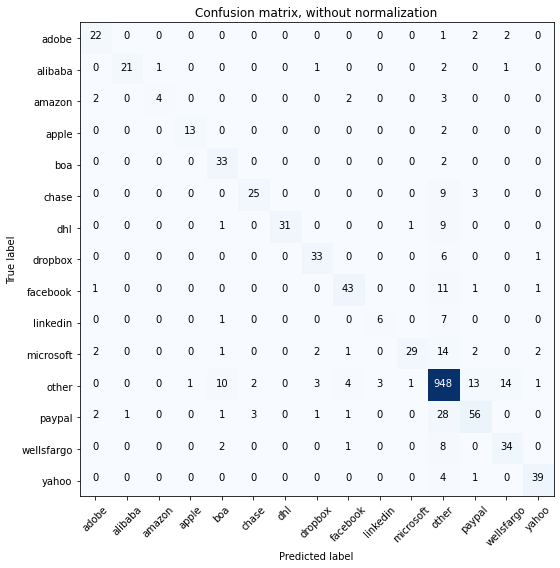

Acc     =  0.869
Pre     =  0.87
Rec     =  0.869
F1      =  0.864

Bal_Acc =  0.73
Bal_Pre =  0.825
Bal_Rec =  0.73
Bal_F1  =  0.775

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.80      0.36      0.50        11
       apple       0.93      0.87      0.90        15
         boa       0.67      0.94      0.79        35
       chase       0.83      0.68      0.75        37
         dhl       1.00      0.74      0.85        42
     dropbox       0.82      0.82      0.82        40
    facebook       0.83      0.75      0.79        57
    linkedin       0.67      0.43      0.52        14
   microsoft       0.94      0.55      0.69        53
       other       0.90      0.95      0.92      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.67      0.76      0.71        45
       yahoo       0.89      0.89      0.89        44


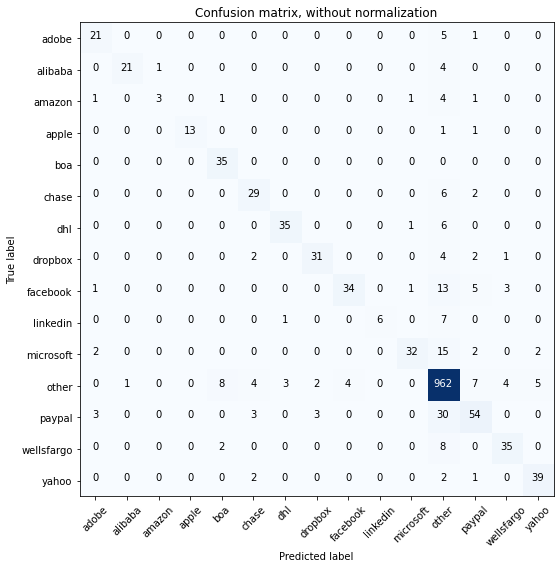

Acc     =  0.877
Pre     =  0.877
Rec     =  0.877
F1      =  0.871

Bal_Acc =  0.73
Bal_Pre =  0.852
Bal_Rec =  0.73
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.75      0.27      0.40        11
       apple       1.00      0.87      0.93        15
         boa       0.76      1.00      0.86        35
       chase       0.72      0.78      0.75        37
         dhl       0.90      0.83      0.86        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.89      0.60      0.72        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.91      0.60      0.73        53
       other       0.90      0.96      0.93      1000
      paypal       0.71      0.58      0.64        93
  wellsfargo       0.81      0.78      0.80        45
       yahoo       0.85      0.89      0.87        44

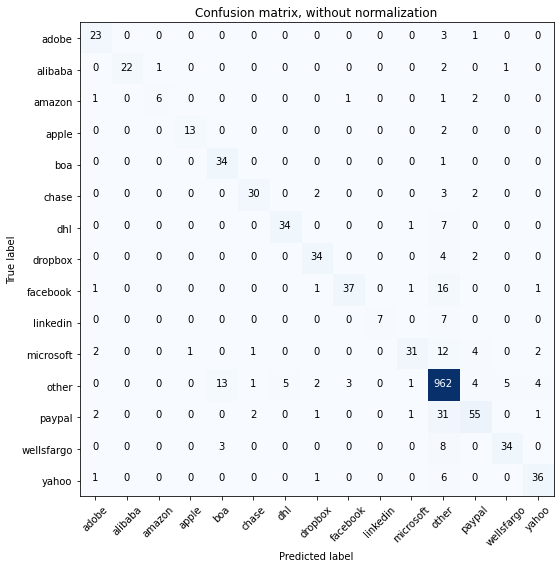

Acc     =  0.882
Pre     =  0.883
Rec     =  0.882
F1      =  0.878

Bal_Acc =  0.761
Bal_Pre =  0.864
Bal_Rec =  0.761
Bal_F1  =  0.809

              precision    recall  f1-score   support

       adobe       0.77      0.85      0.81        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.86      0.55      0.67        11
       apple       0.93      0.87      0.90        15
         boa       0.68      0.97      0.80        35
       chase       0.88      0.81      0.85        37
         dhl       0.87      0.81      0.84        42
     dropbox       0.83      0.85      0.84        40
    facebook       0.90      0.65      0.76        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.89      0.58      0.70        53
       other       0.90      0.96      0.93      1000
      paypal       0.79      0.59      0.67        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.82      0.82      0.82        

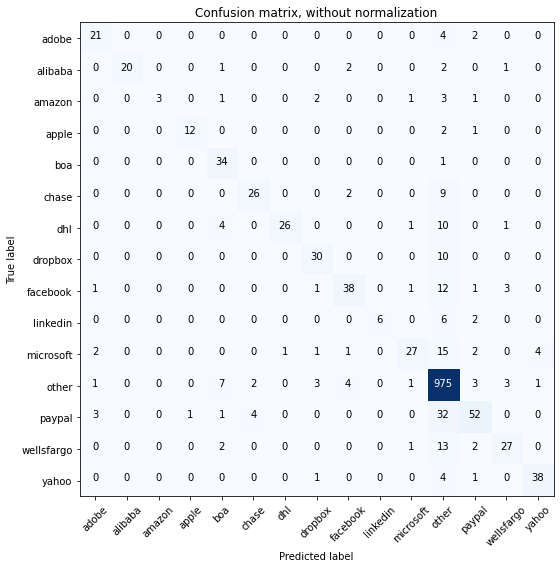

Acc     =  0.867
Pre     =  0.868
Rec     =  0.867
F1      =  0.859

Bal_Acc =  0.684
Bal_Pre =  0.859
Bal_Rec =  0.684
Bal_F1  =  0.762

              precision    recall  f1-score   support

       adobe       0.75      0.78      0.76        27
     alibaba       1.00      0.77      0.87        26
      amazon       1.00      0.27      0.43        11
       apple       0.92      0.80      0.86        15
         boa       0.68      0.97      0.80        35
       chase       0.81      0.70      0.75        37
         dhl       0.96      0.62      0.75        42
     dropbox       0.79      0.75      0.77        40
    facebook       0.81      0.67      0.73        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.84      0.51      0.64        53
       other       0.89      0.97      0.93      1000
      paypal       0.78      0.56      0.65        93
  wellsfargo       0.77      0.60      0.68        45
       yahoo       0.88      0.86      0.87        

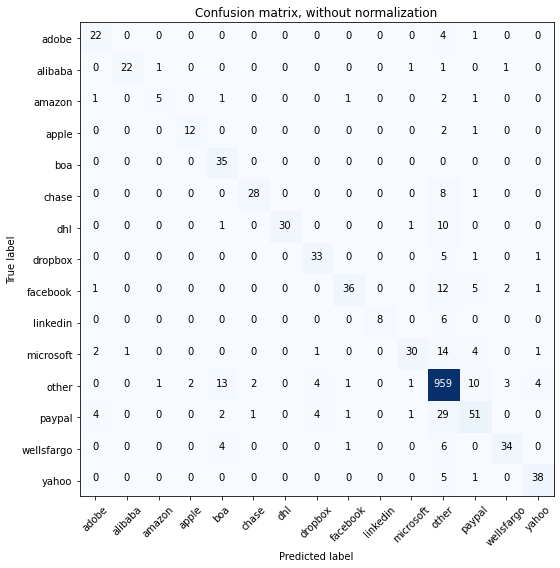

Acc     =  0.873
Pre     =  0.875
Rec     =  0.873
F1      =  0.868

Bal_Acc =  0.74
Bal_Pre =  0.842
Bal_Rec =  0.74
Bal_F1  =  0.788

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.71      0.45      0.56        11
       apple       0.86      0.80      0.83        15
         boa       0.62      1.00      0.77        35
       chase       0.90      0.76      0.82        37
         dhl       1.00      0.71      0.83        42
     dropbox       0.79      0.82      0.80        40
    facebook       0.90      0.63      0.74        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.57      0.69        53
       other       0.90      0.96      0.93      1000
      paypal       0.67      0.55      0.60        93
  wellsfargo       0.85      0.76      0.80        45
       yahoo       0.84      0.86      0.85        44

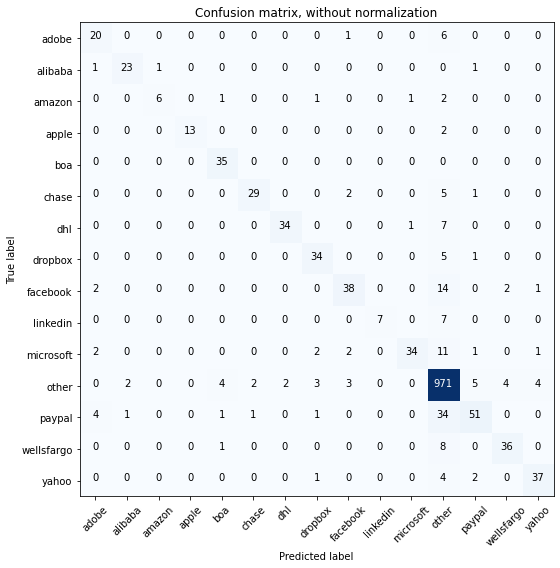

Acc     =  0.889
Pre     =  0.888
Rec     =  0.889
F1      =  0.883

Bal_Acc =  0.763
Bal_Pre =  0.876
Bal_Rec =  0.763
Bal_F1  =  0.816

              precision    recall  f1-score   support

       adobe       0.69      0.74      0.71        27
     alibaba       0.88      0.88      0.88        26
      amazon       0.86      0.55      0.67        11
       apple       1.00      0.87      0.93        15
         boa       0.83      1.00      0.91        35
       chase       0.91      0.78      0.84        37
         dhl       0.94      0.81      0.87        42
     dropbox       0.81      0.85      0.83        40
    facebook       0.83      0.67      0.74        57
    linkedin       1.00      0.50      0.67        14
   microsoft       0.94      0.64      0.76        53
       other       0.90      0.97      0.94      1000
      paypal       0.82      0.55      0.66        93
  wellsfargo       0.86      0.80      0.83        45
       yahoo       0.86      0.84      0.85        

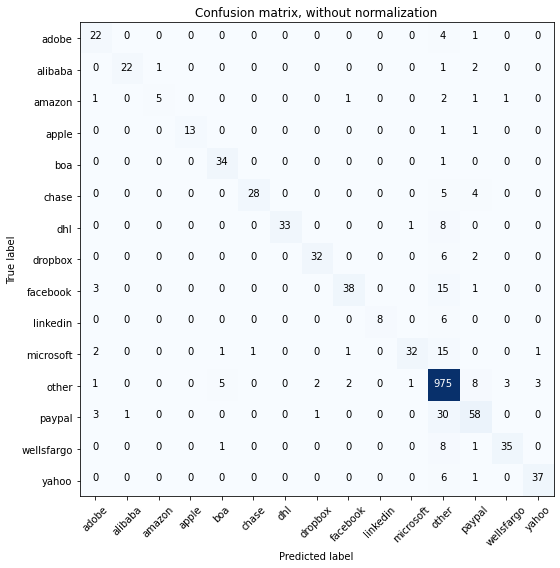

Acc     =  0.891
Pre     =  0.893
Rec     =  0.891
F1      =  0.887

Bal_Acc =  0.757
Bal_Pre =  0.897
Bal_Rec =  0.757
Bal_F1  =  0.821

              precision    recall  f1-score   support

       adobe       0.69      0.81      0.75        27
     alibaba       0.96      0.85      0.90        26
      amazon       0.83      0.45      0.59        11
       apple       1.00      0.87      0.93        15
         boa       0.83      0.97      0.89        35
       chase       0.97      0.76      0.85        37
         dhl       1.00      0.79      0.88        42
     dropbox       0.91      0.80      0.85        40
    facebook       0.90      0.67      0.77        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.94      0.60      0.74        53
       other       0.90      0.97      0.94      1000
      paypal       0.72      0.62      0.67        93
  wellsfargo       0.90      0.78      0.83        45
       yahoo       0.90      0.84      0.87        

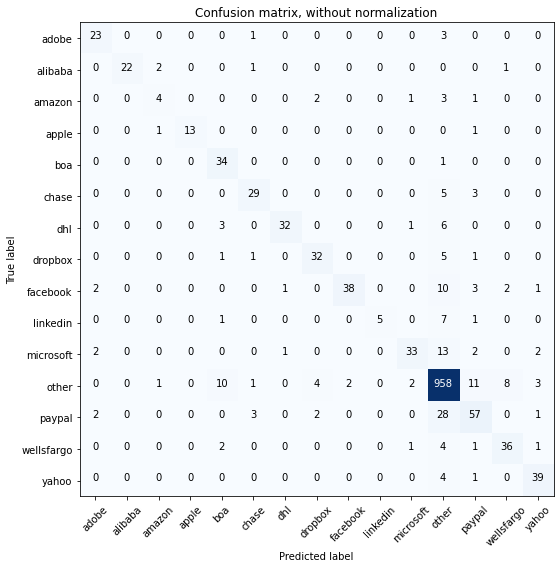

Acc     =  0.88
Pre     =  0.882
Rec     =  0.88
F1      =  0.877

Bal_Acc =  0.743
Bal_Pre =  0.835
Bal_Rec =  0.743
Bal_F1  =  0.786

              precision    recall  f1-score   support

       adobe       0.79      0.85      0.82        27
     alibaba       1.00      0.85      0.92        26
      amazon       0.50      0.36      0.42        11
       apple       1.00      0.87      0.93        15
         boa       0.67      0.97      0.79        35
       chase       0.81      0.78      0.79        37
         dhl       0.94      0.76      0.84        42
     dropbox       0.80      0.80      0.80        40
    facebook       0.95      0.67      0.78        57
    linkedin       1.00      0.36      0.53        14
   microsoft       0.87      0.62      0.73        53
       other       0.91      0.96      0.94      1000
      paypal       0.70      0.61      0.65        93
  wellsfargo       0.77      0.80      0.78        45
       yahoo       0.83      0.89      0.86        44

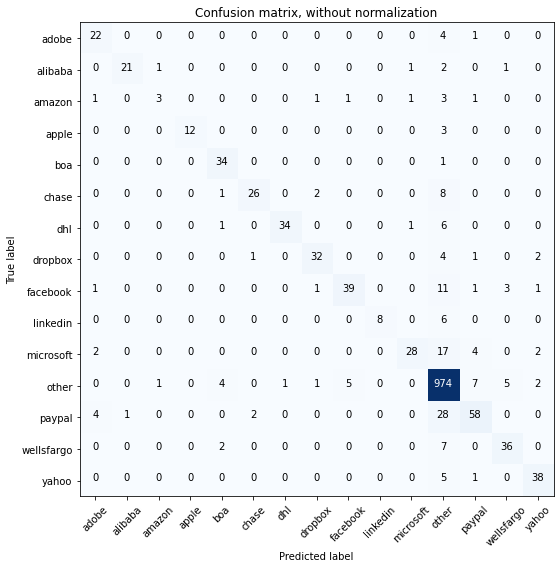

Acc     =  0.887
Pre     =  0.886
Rec     =  0.887
F1      =  0.881

Bal_Acc =  0.735
Bal_Pre =  0.862
Bal_Rec =  0.735
Bal_F1  =  0.793

              precision    recall  f1-score   support

       adobe       0.73      0.81      0.77        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.60      0.27      0.37        11
       apple       1.00      0.80      0.89        15
         boa       0.81      0.97      0.88        35
       chase       0.90      0.70      0.79        37
         dhl       0.97      0.81      0.88        42
     dropbox       0.86      0.80      0.83        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.90      0.53      0.67        53
       other       0.90      0.97      0.94      1000
      paypal       0.78      0.62      0.69        93
  wellsfargo       0.80      0.80      0.80        45
       yahoo       0.84      0.86      0.85        

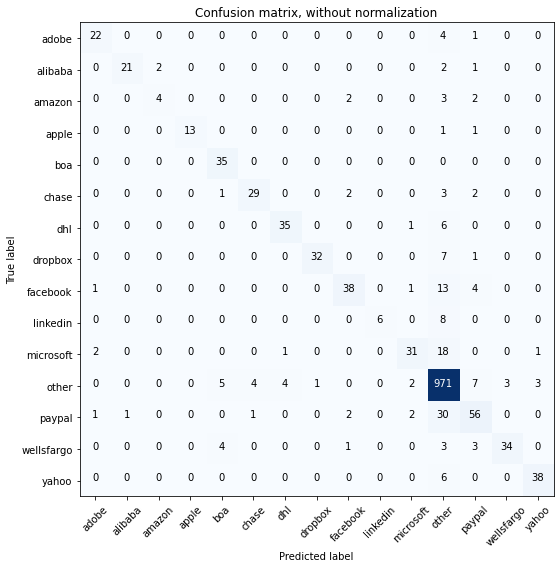

Acc     =  0.887
Pre     =  0.885
Rec     =  0.887
F1      =  0.881

Bal_Acc =  0.743
Bal_Pre =  0.871
Bal_Rec =  0.743
Bal_F1  =  0.802

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.67      0.36      0.47        11
       apple       1.00      0.87      0.93        15
         boa       0.78      1.00      0.88        35
       chase       0.85      0.78      0.82        37
         dhl       0.88      0.83      0.85        42
     dropbox       0.97      0.80      0.88        40
    facebook       0.84      0.67      0.75        57
    linkedin       1.00      0.43      0.60        14
   microsoft       0.84      0.58      0.69        53
       other       0.90      0.97      0.94      1000
      paypal       0.72      0.60      0.65        93
  wellsfargo       0.92      0.76      0.83        45
       yahoo       0.90      0.86      0.88        

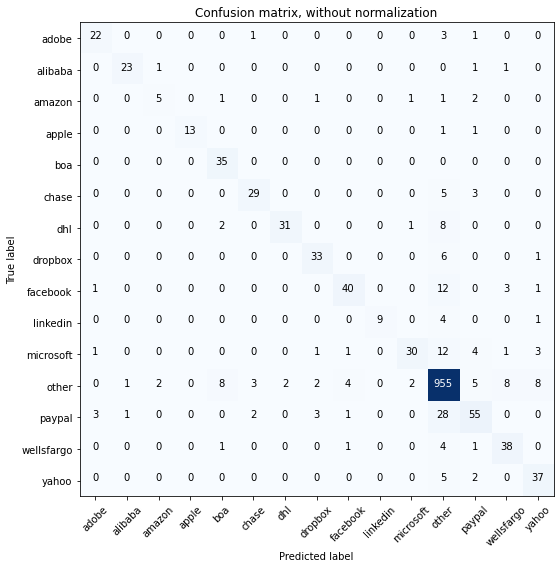

Acc     =  0.88
Pre     =  0.88
Rec     =  0.88
F1      =  0.877

Bal_Acc =  0.767
Bal_Pre =  0.837
Bal_Rec =  0.767
Bal_F1  =  0.8

              precision    recall  f1-score   support

       adobe       0.81      0.81      0.81        27
     alibaba       0.92      0.88      0.90        26
      amazon       0.62      0.45      0.53        11
       apple       1.00      0.87      0.93        15
         boa       0.74      1.00      0.85        35
       chase       0.83      0.78      0.81        37
         dhl       0.94      0.74      0.83        42
     dropbox       0.82      0.82      0.82        40
    facebook       0.85      0.70      0.77        57
    linkedin       1.00      0.64      0.78        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.95      0.93      1000
      paypal       0.73      0.59      0.65        93
  wellsfargo       0.75      0.84      0.79        45
       yahoo       0.73      0.84      0.78        44

 

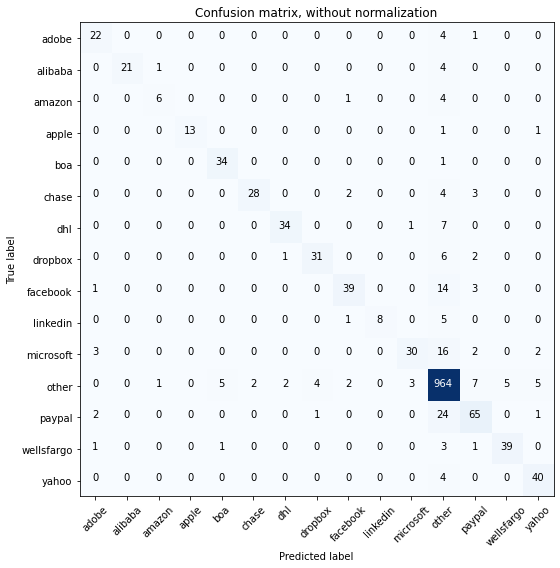

Acc     =  0.893
Pre     =  0.893
Rec     =  0.893
F1      =  0.889

Bal_Acc =  0.774
Bal_Pre =  0.88
Bal_Rec =  0.774
Bal_F1  =  0.824

              precision    recall  f1-score   support

       adobe       0.76      0.81      0.79        27
     alibaba       1.00      0.81      0.89        26
      amazon       0.75      0.55      0.63        11
       apple       1.00      0.87      0.93        15
         boa       0.85      0.97      0.91        35
       chase       0.93      0.76      0.84        37
         dhl       0.92      0.81      0.86        42
     dropbox       0.86      0.78      0.82        40
    facebook       0.87      0.68      0.76        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.88      0.57      0.69        53
       other       0.91      0.96      0.94      1000
      paypal       0.77      0.70      0.73        93
  wellsfargo       0.89      0.87      0.88        45
       yahoo       0.82      0.91      0.86        4

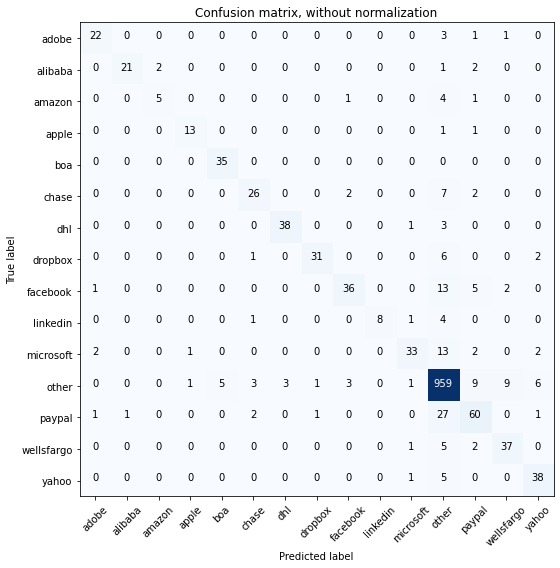

Acc     =  0.885
Pre     =  0.884
Rec     =  0.885
F1      =  0.881

Bal_Acc =  0.763
Bal_Pre =  0.852
Bal_Rec =  0.763
Bal_F1  =  0.805

              precision    recall  f1-score   support

       adobe       0.85      0.81      0.83        27
     alibaba       0.95      0.81      0.88        26
      amazon       0.71      0.45      0.56        11
       apple       0.87      0.87      0.87        15
         boa       0.88      1.00      0.93        35
       chase       0.79      0.70      0.74        37
         dhl       0.93      0.90      0.92        42
     dropbox       0.94      0.78      0.85        40
    facebook       0.86      0.63      0.73        57
    linkedin       1.00      0.57      0.73        14
   microsoft       0.87      0.62      0.73        53
       other       0.91      0.96      0.94      1000
      paypal       0.71      0.65      0.67        93
  wellsfargo       0.76      0.82      0.79        45
       yahoo       0.78      0.86      0.82        

In [13]:
list_of_analysis=[]
for image_size in list_of_size:
    for models in list_of_combinations:
        model1 = models.split(",")[0]
        model2 = models.split(",")[1]
        for classifier in list_of_classifiers:
            print("--------------------------------------------------------------------------")
            print(classifier + " - " + model1 + " - " + model2 + "-" + str(image_size))
            print("")
            accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc = classify(model1, model2, classifier, image_size)
            list_of_analysis.append(
                [
                 classifier, model1, model2, image_size, accuracy, precision, recall, f1_score, balanced_accuracy, PPV, TPR, Bal_F1, TNR, NPV, FPR, FNR, FDR, Overall_Acc
                ]
            )

In [14]:
list_of_analysis

[['RF',
  'Xception',
  'VGG16',
  128,
  0.838,
  0.852,
  0.838,
  0.841,
  0.752,
  0.727,
  0.752,
  0.739,
  0.984,
  0.982,
  0.016,
  0.248,
  0.273,
  0.978],
 ['RF',
  'Xception',
  'VGG19',
  128,
  0.826,
  0.842,
  0.826,
  0.829,
  0.746,
  0.728,
  0.746,
  0.737,
  0.983,
  0.98,
  0.017,
  0.254,
  0.272,
  0.977],
 ['RF',
  'Xception',
  'ResNet50',
  128,
  0.793,
  0.813,
  0.793,
  0.797,
  0.659,
  0.648,
  0.659,
  0.653,
  0.979,
  0.977,
  0.021,
  0.341,
  0.352,
  0.972],
 ['RF',
  'Xception',
  'ResNet101',
  128,
  0.797,
  0.815,
  0.797,
  0.8,
  0.669,
  0.674,
  0.669,
  0.671,
  0.979,
  0.977,
  0.021,
  0.331,
  0.326,
  0.973],
 ['RF',
  'Xception',
  'ResNet152',
  128,
  0.806,
  0.817,
  0.806,
  0.807,
  0.659,
  0.675,
  0.659,
  0.667,
  0.979,
  0.979,
  0.021,
  0.341,
  0.325,
  0.974],
 ['RF',
  'Xception',
  'ResNet50V2',
  128,
  0.82,
  0.837,
  0.82,
  0.823,
  0.716,
  0.739,
  0.716,
  0.727,
  0.981,
  0.98,
  0.019,
  0.284,
  0.261

In [15]:
import pandas as pd
df=pd.DataFrame(list_of_analysis, columns=[
                 "classifier",
                 "model1",
                 "model2",
                 "image_size",
                 "accuracy", 
                 "precision", 
                 "recall", 
                 "f1_score", 
                 "balanced_accuracy", 
                 "balanced_precision_PPV", 
                 "balanced_recall_TPR", 
                 "Bal_F1",
                 "TNR", 
                 "NPV", 
                 "FPR", 
                 "FNR", 
                 "FDR", 
                 "Overall_Acc"
                ])
df

,classifier,model1,model2,image_size,accuracy,precision,recall,f1_score,balanced_accuracy,balanced_precision_PPV,balanced_recall_TPR,Bal_F1,TNR,NPV,FPR,FNR,FDR,Overall_Acc
0,RF,Xception,VGG16,128,0.838,0.852,0.838,0.841,0.752,0.727,0.752,0.739,0.984,0.982,0.016,0.248,0.273,0.978
1,RF,Xception,VGG19,128,0.826,0.842,0.826,0.829,0.746,0.728,0.746,0.737,0.983,0.980,0.017,0.254,0.272,0.977
2,RF,Xception,ResNet50,128,0.793,0.813,0.793,0.797,0.659,0.648,0.659,0.653,0.979,0.977,0.021,0.341,0.352,0.972
3,RF,Xception,ResNet101,128,0.797,0.815,0.797,0.800,0.669,0.674,0.669,0.671,0.979,0.977,0.021,0.331,0.326,0.973
4,RF,Xception,ResNet152,128,0.806,0.817,0.806,0.807,0.659,0.675,0.659,0.667,0.979,0.979,0.021,0.341,0.325,0.974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,RF,MobileNetV2,DenseNet169,256,0.887,0.886,0.887,0.881,0.735,0.862,0.735,0.793,0.984,0.990,0.016,0.265,0.138,0.985
236,RF,MobileNetV2,DenseNet201,256,0.887,0.885,0.887,0.881,0.743,0.871,0.743,0.802,0.984,0.989,0.016,0.257,0.129,0.985
237,RF,DenseNet121,DenseNet169,256,0.880,0.880,0.880,0.877,0.767,0.837,0.767,0.800,0.985,0.988,0.015,0.233,0.163,0.984
238,RF,DenseNet121,DenseNet201,256,0.893,0.893,0.893,0.889,0.774,0.880,0.774,0.824,0.985,0.989,0.015,0.226,0.120,0.986


In [16]:
df.to_csv(analysis_output, header=True, index=False)